In [35]:
import torch
import os
import glob 

from torch import nn
from torch.utils.data import DataLoader, TensorDataset, Dataset
from torch.nn.utils.rnn import pad_sequence
from torch.nn import Module
from torch.utils.data import Subset
import torchaudio
import torch.nn.functional as F

import numpy as np

from tqdm import tqdm

import random

import ast

from collections import Counter

from typing import List, Dict

import pandas as pd

import speechbrain
from speechbrain.lobes.models.Xvector import Xvector, Classifier
from speechbrain.lobes.models import ECAPA_TDNN
from speechbrain.inference.speaker import EncoderClassifier
from speechbrain.inference.classifiers import EncoderClassifier
from speechbrain.nnet.pooling import AttentionPooling, StatisticsPooling
from speechbrain.utils.seed import seed_everything
from speechbrain.dataio.dataio import length_to_mask
from speechbrain.nnet.linear import Linear


from sklearn.metrics import accuracy_score, classification_report, f1_score
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

from transformers import get_linear_schedule_with_warmup

import librosa

from scipy.io import wavfile

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns


plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman', 'DejaVu Serif', 'Georgia']



In [36]:
#os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "caching_allocator"
#print(speechbrain.__version__)

In [37]:
class CustomAttentionPooling(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        
        self.input_dim = input_dim
        
        self.attn_pooling_w = torch.nn.Linear(input_dim, 1)
        
    def forward(self, x, mask=None):
        attn_weights = self.attn_pooling_w(x).squeeze(-1).float()
        
        if mask is not None:
            attn_weights[~mask] = float('-inf')
        attn_weights = torch.nn.functional.softmax(attn_weights, dim=-1).unsqueeze(-1)
        out = torch.sum(x*attn_weights, dim=1)
        return out
            

class CustomStatisticsPooling(nn.Module):
    def __init__(self, return_mean=True, return_std=True):
        super().__init__()
        self.eps = 1e-5
        self.return_mean = return_mean
        self.return_std = return_std
        
        if not (self.return_mean or self.return_std):
            raise ValueError("Enable either mean and/or std for statistical pooling.")
    
    def forward(self, x, mask=None):
        if mask is not None:
            
            
            #mask = mask.unsqueeze(-1)  # Expand to match x's shape (batch_size, time_steps, features)
            mask = mask.unsqueeze(-1).expand(-1, -1, x.size(-1))  
            masked_x = x * mask.float()
            valid_counts = mask.sum(dim=1).clamp(min=1) 
            
            if self.return_mean:
                mean = masked_x.sum(dim=1)/valid_counts

            if self.return_std:
                mean_expanded = mean.unsqueeze(1).expand(-1, x.size(1), -1)
                
                variance = ((masked_x-mean_expanded)**2*mask).sum(dim=1)/valid_counts
                std = torch.sqrt(variance+self.eps)
        else:
            if self.return_mean:
                mean = x.mean(dim=1)
                
            if self.return_std:
                std = x.std(dim=1)
                
        if self.return_mean and self.return_std:
            pooled_stats = torch.cat((mean, std), dim=1)
        elif self.return_mean:
            pooled_stats = mean
        elif self.return_std:
            pooled_stats = std
            
        return pooled_stats
    
    
    
class CustomXvector(Xvector):
    def __init__(self, input_size, lin_neurons=512, activation=nn.LeakyReLU, device = 'cpu',tdnn_channels = [512, 512, 512, 512, 1500], use_stat_pool=False):
        super().__init__(in_channels=input_size, lin_neurons=lin_neurons, activation=activation,tdnn_channels=tdnn_channels)
        self.device = torch.device(device)
        self.to(self.device)

        self.out_channels = tdnn_channels[-1]
        self.input_size = input_size
        
        if use_stat_pool:
            self.return_mean = True
            self.return_std = True
            self.blocks = nn.ModuleList([
                *self.blocks[:-2],
                CustomStatisticsPooling(),
                nn.Linear(
                    in_features= self.out_channels * (2 if self.return_mean and self.return_std else 1),  
                    out_features=lin_neurons,
                    bias=True,
                )
            ])
        else:
            self.blocks = nn.ModuleList([
                *self.blocks[:-2],
                CustomAttentionPooling(self.out_channels),
                nn.Linear(
                    in_features=self.out_channels,  # Adapt to the output size
                    out_features=lin_neurons,
                    bias=True,
                )
            ])
        
        
        self.blocks.to(self.device)
        
        self.attention_layer = self.blocks[-2]
        
    def create_mask(self, lens, max_len=None):
        if max_len is None:
            max_len=lens.max()
            
        return torch.arange(max_len, device=lens.device)[None, :] < lens[:, None]
    
    def forward(self, x, lens=None):
        if isinstance(x, list):
            #for element in x:
            x = [element.to(self.device) for element in x]
        else:
            x = x.to(self.device)
            
        mask = None
        if lens is not None:
            mask = self.create_mask(lens, x.size(1))
        
        for block in self.blocks[:-2]:
            x = block(x)
            
        x = self.attention_layer(x, mask=mask)
        x = self.blocks[-1](x)
        return x #super().forward(x, lens)
      

In [38]:
class CustomDataset(Dataset):
    def __init__(self, files, is_tv, origin_ids ,labels: List[int], is_test= False, norm_feat = True, segment = 0, n_mels=80, segment_test=False):
        super().__init__()
        self.files = files
        
        self.labels = labels
        self.is_test = is_test
        self.is_tv = is_tv
        self.norm_feat = norm_feat
        self.segment = segment
        self.n_mels = n_mels
        self.segment_test = segment_test
        self.origin_ids = origin_ids
        
        
     
    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
                    
        sr = 16000
        hop_length = int(0.01 *sr)
        num_frames_segment = int(self.segment * sr /hop_length)
        
        if not self.segment_test:
            if self.is_tv: data = pd.read_pickle(self.files[idx]).to_numpy() 
            else:
                
                samplerate, file = wavfile.read(self.files[idx])
                
                feat = librosa.feature.melspectrogram(
                    y=file.astype(float), 
                    sr=samplerate, 
                    n_fft=2 * int(0.01*samplerate),
                    hop_length= int(0.01*samplerate),
                    #win_length= int(0.01*samplerate),
                    window="hamming",
                    center=True, 
                    n_mels=self.n_mels,
                    )
                #feat = librosa.feature.mfcc(y=file.astype(float), sr=samplerate)
                log_mel = librosa.power_to_db(feat)
                data = log_mel.transpose(1,0)
                #data = feat.transpose(1,0)
            
            #num_frames = data.shape[0]
        
            #duration = (num_frames * hop_length) /sr
            
            #if self.segment == 10 and duration > self.segment:
                #start = random.randint(0, num_frames - num_frames_segment)
                #data = data[start: start + num_frames_segment] 
            '''
            feat = librosa.feature.mfcc(
                y = file.astype(float),
                sr = samplerate,
                n_mfcc=self.n_mels,
                hop_length= int(0.01*samplerate),
                win_length= int(0.02*samplerate),
                window="hamming",
                center=True, 
                n_mels=23,
            )
            data = feat.transpose(1,0)
            '''
        elif self.segment_test:
            data = self.files[idx]
            #print(type(data))
           
            
        num_frames = data.shape[0]
        
        duration = (num_frames * hop_length) /sr
        #start = 0
        #if not self.segment_test and self.segment == 10 and duration > self.segment:
         #   start = random.randint(0, num_frames - num_frames_segment)
          #  data = data[start: start + num_frames_segment]   
            
            
        if self.norm_feat:
            data = normalize(data, axis=0)
            
        
        return {'features' : data, 'label' : self.labels[idx], 'origin_id': self.origin_ids[idx]}#, 'seq_length': seq_length} 
    
class WavTVDataset(Dataset):
    def __init__(self, wav_dataset, tv_dataset, segment):
        super().__init__()
        assert len(wav_dataset) == len(tv_dataset)
        self.wav_dataset = wav_dataset
        self.tv_dataset = tv_dataset
        self.segment = segment
        
    def __len__(self):
        return len(self.wav_dataset)
    
    def __getitem__(self, idx):
        
        sr = 16000
        hop_length = int(0.01 *sr)
        num_frames_segment = int(self.segment * sr /hop_length)
        
        wav_item = self.wav_dataset[idx]
        tv_item = self.tv_dataset[idx]
        
        tv_data = tv_item['features']
        wav_data = wav_item['features']
        
        
        
        if tv_data.shape[0] < wav_data.shape[0]:
            
            wav_data = wav_data[:-np.abs(wav_data.shape[0]-tv_data.shape[0]),:]
            
        elif tv_data.shape[0] > wav_data.shape[0]:
            
            tv_data = tv_data[:-np.abs(wav_data.shape[0]-tv_data.shape[0]),:]
        
        num_frames = tv_data.shape[0]
        duration = (num_frames * hop_length) /sr
            
        if duration > self.segment:
            start = random.randint(0, num_frames - num_frames_segment)
            tv_data = tv_data[start: start + num_frames_segment]
            wav_data = wav_data[start: start + num_frames_segment]  
        
        return {
            'wav_features': wav_data,
            'tv_features': tv_data,
            #'wav_length': wav_item['seq_length'],
            #'tv_length': tv_item['seq_length'],
            'label': wav_item['label'],
            'origin_id': wav_item['origin_id']
        }

In [39]:
def val_split_speaker_ids(speaker_ids,labels, val_ratio : float=0.1):
    
    speaker_to_label = {}
    for sid, label in zip(speaker_ids, labels):
        if sid not in speaker_to_label:
            speaker_to_label[sid] = label
            
    unique_speaker_ids = list(speaker_to_label.keys()) #list(set(speaker_ids))
    speaker_labels = [speaker_to_label[sid] for sid in unique_speaker_ids]
    
    train_speaker_ids, val_speaker_ids = train_test_split(
        unique_speaker_ids,
        test_size=val_ratio,
        stratify=speaker_labels,
        random_state=42
    )
    
    #unique_speaker_ids.sort()
    #random.shuffle(unique_speaker_ids)
    
    #train_speaker_ids, val_speaker_ids = train_test_split(
     #   unique_speaker_ids, test_size=val_ratio, random_state=42
      #  )
    
    
    return train_speaker_ids, val_speaker_ids

def split_dataset(samples, labels, train_speaker_ids, speaker_ids, train_origin_id):
        
    t_paths, t_labels, v_paths, v_labels = [], [], [], []
    
    for path, label, speaker_id in zip(samples, labels, speaker_ids):
        if speaker_id in train_speaker_ids:
            t_paths.append(path)
            t_labels.append(label)
        else:
            v_paths.append(path)
            v_labels.append(label)
            
    v_org_ids, t_org_ids = [], []
    for element in v_paths:
        org_name = os.path.splitext(os.path.basename(element))[0]
        if org_name == 'AVPEPUDEAC0041_Monologo-NR_':
            v_org_ids.append('AVPEPUDEAC0041_Monologo-NR')
        else:
            v_org_ids.append(org_name)
            
    for elem in train_origin_id:
        if elem not in v_org_ids:
            t_org_ids.append(elem)
        
    return t_paths, t_labels, t_org_ids, v_paths, v_labels, v_org_ids

In [40]:
def fix_original_csv(ds_type, fold):
    #target_dir = f"/home/stinasb/SSL4PR/TV_train_test/Fold{fold}/{ds_type}/"

    original_dir = f"/home/stinasb/SSL4PR/pcgita_splits/TRAIN_TEST_{fold}/{ds_type}.csv"

    file = pd.read_csv(original_dir, index_col =False)
    #print(file.columns())
    #file= file.drop(columns=[col for col in file.columns if "Unnamed" in col])
    file = file.drop(columns=['Unnamed: 0'], errors='ignore')
    
    file.to_csv(original_dir, index=False)

In [41]:
def get_filename(file_path):
    return os.path.splitext(os.path.basename(file_path))[0]


def organize_data_in_folders(ds_type, fold, tvmodel):
    target_dir = f"/home/stinasb/SSL4PR/TV_train_test/Fold{fold}/{ds_type}/"

    original_dir = f"/home/stinasb/SSL4PR/pcgita_splits/TRAIN_TEST_{fold}/{ds_type}.csv"

    original_data = pd.read_csv(original_dir)
    
    
    audio_path = list(original_data['audio_path'])

    origin_id = list(original_data['original_id'])
    
    if 'AVPEPUDEAC0041_Monologo-NR' in origin_id:
        origin_id.remove('AVPEPUDEAC0041_Monologo-NR')
        origin_id.append('AVPEPUDEAC0041_Monologo-NR_')
    
    speaker_ids = list(original_data['speaker_id'])
    
    if tvmodel:
        dirname = '/talebase/data/speech_raw/PC-GITA-v2/TVs/model_2_torch/' 
    else:
        dirname = '/home/stinasb/SSL4PR/TVs_copy_test/'

    labels = []
    filelist = []
    origin_ids = []
    speaker_id = []
    
    for root, dirs, files in os.walk(dirname):
        if os.path.basename(root) in {'hc', 'pd', 'HC', 'PD'}:
            group = os.path.basename(root)
            for file in files:
                filename, extension = os.path.splitext(file)
                if filename in origin_id:
                    
                    filelist.append(os.path.join(root, file))
                    
                    
    
    wav_files_sorted = sorted(audio_path, key=get_filename)
    pkl_files_sorted = sorted(filelist, key=get_filename)
    
    
        
    for element in pkl_files_sorted:
        
        filename = os.path.basename(element)
        spk_id, extension = os.path.splitext(filename)
        speaker_id.append(spk_id.split("_")[0])
        
        if spk_id == 'AVPEPUDEAC0041_Monologo-NR_':
            origin_ids.append('AVPEPUDEAC0041_Monologo-NR')
        else:
            origin_ids.append(spk_id)
        
        group = os.path.basename(os.path.dirname(element))
        if group == 'hc' or group == 'HC':
            labels.append(0)
        elif group == 'pd' or group == 'PD':
            labels.append(1)
                        
    

    file_dict = {'sample_tv': pkl_files_sorted, 'sample_wav': wav_files_sorted , 'labels': labels, 'speaker_id': speaker_id, 'origin_id': origin_ids}
    
        
    df = pd.DataFrame(file_dict)
    
    original_data_copy = original_data.drop_duplicates(subset='speaker_id')
    columns_to_copy = ['status', 'UPDRS', 'UPDRS-speech','H/Y', 'SEX', 'AGE', 'time after diagnosis']
    
    df = df.merge(original_data_copy[['speaker_id']+columns_to_copy], on='speaker_id', how='left')
    

    df.to_csv(target_dir + f"{ds_type}.csv", index=False)


In [42]:
#train = pd.read_csv("/home/stinasb/SSL4PR/TV_train_test/Fold1/train/train.csv")
#test = pd.read_csv("/home/stinasb/SSL4PR/TV_train_test/Fold1/test/test.csv")
#df_combind = pd.concat([train, test], ignore_index=False)
#df_combind.to_csv("/home/stinasb/SSL4PR/TV_train_test/train.csv")

In [43]:
def custom_collate_fn(batch):
    # Convert each element in the batch to a tensor
    sequences_tv = [torch.tensor(item['tv_features']) for item in batch]
    lengths_tv = torch.tensor([len(seq) for seq in sequences_tv])  # Sequence lengths
    
    # Pad sequences to the same length
    padded_sequences_tv = pad_sequence(sequences_tv, batch_first=True)
    
    sequences_wav = [torch.tensor(item['wav_features']) for item in batch]
    lengths_wav = torch.tensor([len(seq) for seq in sequences_wav])  # Sequence lengths
    
    # Pad sequences to the same length
    padded_sequences_wav= pad_sequence(sequences_wav, batch_first=True)
    
    labels = torch.tensor([item['label'] for item in batch])
    org_ids = [item['origin_id'] for item in batch]
    
    return {'sequences_wav': padded_sequences_wav, 'sequences_tv': padded_sequences_tv,'lengths_wav': lengths_wav, 'lengths_tv':lengths_tv, 'labels': labels, 'origin_id': org_ids}


In [44]:
def data_handling(fold, n_mels=80, val_ratio=0.1, batch_size=16, norm_feat=True, tvmodel=False, segment_test = False):
    
    #--Organize data in folders (similar to pcgita-split)--
    organize_data_in_folders('train', fold, tvmodel)
    organize_data_in_folders('test', fold, tvmodel)

    #--Obtain data from csv-files--
    csv_path_train = f"/home/stinasb/SSL4PR/TV_train_test/Fold{fold}/train/train.csv"
    df_train = pd.read_csv(csv_path_train)

    if segment_test:
        csv_path_test = f"/home/stinasb/SSL4PR/TV_train_test/Fold{fold}/test/test_segment.pkl"
        df_test = pd.read_pickle(csv_path_test)
    else:
        csv_path_test = f"/home/stinasb/SSL4PR/TV_train_test/Fold{fold}/test/test.csv"
        df_test = pd.read_csv(csv_path_test)
    
    #--Organize data in samples, speaker_id and labels--
    pickle_train = df_train['sample_tv']
    pickle_test = df_test['sample_tv']
    speaker_ids = df_train['speaker_id']

    labels_train = df_train['labels']
    labels_test = df_test['labels']
        
    wav_train = df_train['sample_wav']
    wav_test = df_test['sample_wav']
    
    org_id_train = df_train['origin_id']
    org_id_test = df_test['origin_id']
             
             
    #print(pickle_train[45], wav_train[45])
    
    #--Split training set into a train and validation set--
    train_speaker_ids, val_speaker_ids = val_split_speaker_ids(speaker_ids, labels_train, val_ratio)
    
    train_data, train_labels, train_org_id, val_data, val_labels, val_org_ids = split_dataset(pickle_train, labels_train, train_speaker_ids, speaker_ids, org_id_train)
    train_data_wav, train_labels_wav, train_org_id_wav, val_data_wav, val_labels_wav, val_org_id_wav = split_dataset(wav_train, labels_train, train_speaker_ids, speaker_ids, org_id_train)
    
    
    #--Organize in CustomDataset objects--
    train_ds = CustomDataset(train_data, is_tv=True, origin_ids=train_org_id ,labels= train_labels, is_test=False, norm_feat=norm_feat, segment=10)
    val_ds = CustomDataset(val_data, is_tv=True, origin_ids=val_org_ids, labels= val_labels, is_test=False, norm_feat=norm_feat, segment=10)
    test_ds = CustomDataset(pickle_test, is_tv=True, origin_ids=org_id_test,labels=labels_test, is_test=True, norm_feat=norm_feat, segment=10, segment_test=segment_test)
    
    train_ds_wav = CustomDataset(train_data_wav, is_tv=False, origin_ids=train_org_id_wav ,labels= train_labels_wav, is_test=False, norm_feat=norm_feat, segment=10, n_mels=n_mels)
    val_ds_wav = CustomDataset(val_data_wav, is_tv=False, origin_ids= val_org_id_wav,labels= val_labels_wav, is_test=False, norm_feat=norm_feat, segment=10, n_mels=n_mels)
    test_ds_wav = CustomDataset(wav_test, is_tv=False, origin_ids=org_id_test,labels=labels_test, is_test=True, norm_feat=norm_feat, segment=10, n_mels=n_mels, segment_test=segment_test)
    
   
    
    
    ds_train = WavTVDataset(train_ds_wav, train_ds, 10)
    ds_val = WavTVDataset(val_ds_wav, val_ds, 10)
    ds_test = WavTVDataset(test_ds_wav, test_ds, 10)
    
    
    #--Load Datasets into Dataloaders--  
    train_dl = DataLoader(ds_train, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=True , drop_last=True)
    #train_dl = DataLoader(ds_train, batch_size=batch_size, shuffle=True , drop_last=True)
    val_dl = DataLoader(ds_val, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=False)
    test_dl = DataLoader(ds_test, batch_size=batch_size, collate_fn=custom_collate_fn, shuffle=False)
    
  
  
    
    return train_dl, val_dl, test_dl, train_speaker_ids, val_speaker_ids
    

In [45]:
#train_dl, val_dl, test_dl, train_speaker_ids, val_speaker_ids = data_handling(5)

In [46]:
#df = pd.read_csv(f"/home/stinasb/SSL4PR/TV_train_test/Fold{str(5)}/train/train.csv")
#all_label_train, all_label_val = [], []
#for index, row in df[['speaker_id', 'labels']].iterrows():
    #print(row['speaker_id'])
 #   if row['speaker_id'] in train_speaker_ids:
        
  #      all_label_train.append(row['labels'])
   # else:
    #    all_label_val.append(row['labels'])

In [47]:
#len(list(set(df['speaker_id'])))*0.1

In [48]:
#val_speaker_ids

In [49]:
#df = pd.read_csv("/home/stinasb/SSL4PR/TVs_copy/train_speaker_ids.csv")[str(5)]
#unique = list(set(df))

In [50]:
#df = pd.read_csv(f"/home/stinasb/SSL4PR/TV_train_test/Fold{str(5)}/train/train.csv")
#all_label_train, all_label_val = [], []
#val = []
#for index, row in df[['speaker_id', 'labels']].iterrows():
    #print(row['speaker_id'])
 #   if row['speaker_id'] not in unique:
        
  #      val.append(row['speaker_id'])
    

In [51]:
#list(set(val))

In [52]:
class CustomDatasetOnlyTV(Dataset):
    def __init__(self, files,labels: List[int], is_test= False, norm_feat = True, segment = 0, n_mels=23):
        super().__init__()
        self.files = files
        
        self.labels = labels
        self.is_test = is_test
        self.norm_feat = norm_feat
        self.segment = segment
        self.n_mels = n_mels
        
        
        
     
    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
                    
        sr = 16000 #ewa-db aøso has 16kHz sampling frequency
        hop_length = int(0.01 *sr)
        num_frames_segment = int(self.segment * sr /hop_length)
        
        
        data = pd.read_pickle(self.files[idx]).to_numpy() 
            
           
            
        num_frames = data.shape[0]
        
        duration = (num_frames * hop_length) /sr
            
            
        
            
        if duration > self.segment:
            start = random.randint(0, num_frames - num_frames_segment)
            data = data[start: start + num_frames_segment]
        
        if self.norm_feat:
            data = normalize(data, axis=0)
            
        
        return {'features' : data, 'label' : self.labels[idx]}#, 'seq_length': seq_length} 
    

In [53]:
class CustomDatasetOnlyWAV(Dataset):
    def __init__(self, files,labels: List[int], is_test= False, norm_feat = True, segment = 0, n_mels=80):
        super().__init__()
        self.files = files
        
        self.labels = labels
        self.is_test = is_test
        self.norm_feat = norm_feat
        self.segment = segment
        self.n_mels = n_mels
        
        
        
     
    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
                    
        sr = 16000 #ewa-db aøso has 16kHz sampling frequency
        hop_length = int(0.01 *sr)
        num_frames_segment = int(self.segment * sr /hop_length)
        
        
        samplerate, file = wavfile.read(self.files[idx])
                
        feat = librosa.feature.melspectrogram(
            y=file.astype(float), 
            sr=samplerate, 
            n_fft=2 * int(0.01*samplerate),
            hop_length= int(0.01*samplerate),
            #win_length= int(0.01*samplerate),
            window="hamming",
            center=True, 
            n_mels=self.n_mels,
            )
        #feat = librosa.feature.mfcc(y=file.astype(float), sr=samplerate)
        log_mel = librosa.power_to_db(feat)
        data = log_mel.transpose(1,0)
            
           
            
        num_frames = data.shape[0]
        
        duration = (num_frames * hop_length) /sr
            
            
        
            
        if duration > self.segment:
            start = random.randint(0, num_frames - num_frames_segment)
            data = data[start: start + num_frames_segment]
        
        if self.norm_feat:
            data = normalize(data, axis=0)
            
        
        return {'features' : data, 'label' : self.labels[idx]}#, 'seq_length': seq_length} 
    

In [54]:
def custom_collate_fn_tv(batch):
    # Convert each element in the batch to a tensor
    sequences_tv = [torch.tensor(item['features']) for item in batch]
    lengths_tv = torch.tensor([len(seq) for seq in sequences_tv])  # Sequence lengths
    
    # Pad sequences to the same length
    padded_sequences_tv = pad_sequence(sequences_tv, batch_first=True)
    
   
    
    
    labels = torch.tensor([item['label'] for item in batch])
   
    
    return {'sequences_tv': padded_sequences_tv, 'lengths_tv':lengths_tv, 'labels': labels}


In [55]:
def data_handling_onlyTV(val_ratio=0.1, batch_size=16, norm_feat=True):
    
    #--Obtain data from csv-files--
    csv_path_train = f"/home/stinasb/SSL4PR/TV_train_test/train.csv"
    csv_test_path = f"/home/stinasb/SSL4PR/TV_train_test/test.csv"
    df_train = pd.read_csv(csv_path_train)
    df_test = pd.read_csv(csv_test_path)

    
    #--Organize data in samples, speaker_id and labels--
    pickle_train = df_train['sample_tv']
    
    pickle_test = df_test['sample_tv']
    
    speaker_ids = df_train['speaker_id']
    
    labels_train = df_train['labels']
    
    labels_test = df_test['labels']
    
    #wav_train = df_train['sample_wav']
   
    org_id_train = df_train['origin_id']
    
    #--Split training set into a train and validation set--
    train_speaker_ids, val_speaker_ids = val_split_speaker_ids(speaker_ids, labels_train, val_ratio)
    
    train_data, train_labels, train_org_id, val_data, val_labels, val_org_ids = split_dataset(pickle_train, labels_train, train_speaker_ids, speaker_ids, org_id_train)
    #train_data_wav, train_labels_wav, train_org_id_wav, val_data_wav, val_labels_wav, val_org_id_wav = split_dataset(wav_train, labels_train, train_speaker_ids, speaker_ids, org_id_train)
    
    #--Organize in CustomDataset objects--
    train_ds = CustomDatasetOnlyTV(train_data, labels= train_labels, is_test=False, norm_feat=norm_feat, segment=10)
    val_ds = CustomDatasetOnlyTV(val_data, labels= val_labels, is_test=True, norm_feat=norm_feat, segment=10)
    test_ds = CustomDatasetOnlyTV(pickle_test, labels=labels_test, is_test=True, norm_feat=norm_feat, segment=10)
    
    
    #--Load Datasets into Dataloaders--  
    train_dl = DataLoader(train_ds, batch_size=batch_size, collate_fn=custom_collate_fn_tv, shuffle=True , drop_last=True)
    val_dl = DataLoader(val_ds, batch_size=batch_size, collate_fn=custom_collate_fn_tv, shuffle=False)
    test_dl = DataLoader(test_ds, batch_size=batch_size, collate_fn=custom_collate_fn_tv, shuffle=False)
    
    return train_dl, val_dl, test_dl, train_speaker_ids, val_speaker_ids

In [56]:
def data_handling_onlyWAV(val_ratio=0.1, batch_size=16, norm_feat=True):
    
    #--Obtain data from csv-files--
    csv_path_train = f"/home/stinasb/SSL4PR/TV_train_test/train.csv"
    csv_test_path = f"/home/stinasb/SSL4PR/TV_train_test/test_wav.csv"
    df_train = pd.read_csv(csv_path_train)
    df_test = pd.read_csv(csv_test_path)

    
    #--Organize data in samples, speaker_id and labels--
    pickle_train = df_train['sample_wav']
    
    pickle_test = df_test['sample_wav']
    
    speaker_ids = df_train['speaker_id']
    
    labels_train = df_train['labels']
    
    labels_test = df_test['labels']
    
    #wav_train = df_train['sample_wav']
   
    org_id_train = df_train['origin_id']
    
    #--Split training set into a train and validation set--
    train_speaker_ids, val_speaker_ids = val_split_speaker_ids(speaker_ids, labels_train, val_ratio)
    
    train_data, train_labels, train_org_id, val_data, val_labels, val_org_ids = split_dataset(pickle_train, labels_train, train_speaker_ids, speaker_ids, org_id_train)
    #train_data_wav, train_labels_wav, train_org_id_wav, val_data_wav, val_labels_wav, val_org_id_wav = split_dataset(wav_train, labels_train, train_speaker_ids, speaker_ids, org_id_train)
    
    #--Organize in CustomDataset objects--
    train_ds = CustomDatasetOnlyWAV(train_data, labels= train_labels, is_test=False, norm_feat=norm_feat, segment=10)
    val_ds = CustomDatasetOnlyWAV(val_data, labels= val_labels, is_test=True, norm_feat=norm_feat, segment=10)
    test_ds = CustomDatasetOnlyWAV(pickle_test, labels=labels_test, is_test=True, norm_feat=norm_feat, segment=10)
    
    
    #--Load Datasets into Dataloaders--  
    train_dl = DataLoader(train_ds, batch_size=batch_size, collate_fn=custom_collate_fn_tv, shuffle=True , drop_last=True)
    val_dl = DataLoader(val_ds, batch_size=batch_size, collate_fn=custom_collate_fn_tv, shuffle=False)
    test_dl = DataLoader(test_ds, batch_size=batch_size, collate_fn=custom_collate_fn_tv, shuffle=False)
    
    return train_dl, val_dl, test_dl, train_speaker_ids, val_speaker_ids

In [57]:
class ChannelIndependentAttentiveStatisticsPooling(nn.Module):
    def __init__(self, channels, attention_channels=128, global_context=True):
        super().__init__()

        self.eps = 1e-12
        self.global_context = global_context
        #if global_context:
         #   self.attention_layer = nn.Linear(channels*3, attention_channels) #W_h (RxC)
        #else:
         #   self.attention_layer = nn.Linear(channels, attention_channels) #W_h (RxC)
        if global_context:
            self.tdnn = ECAPA_TDNN.TDNNBlock(channels * 3, attention_channels, 1, 1, activation=nn.LeakyReLU)
        else:
            self.tdnn = ECAPA_TDNN.TDNNBlock(channels, attention_channels, 1, 1, activation=nn.LeakyReLU)
        self.tanh = nn.Tanh()
        
        self.conv = ECAPA_TDNN.Conv1d(
            in_channels=attention_channels, out_channels=1, kernel_size=1
        ) #v^T (Rx1)
        
    def forward(self, x, lengths=None):
        """Calculates mean and std for a batch (input tensor).

        Arguments
        ---------
        x : torch.Tensor
            Tensor of shape [N, C, L].
        lengths : torch.Tensor
            The corresponding relative lengths of the inputs.

        Returns
        -------
        pooled_stats : torch.Tensor
            mean and std of batch
        """
        L = x.shape[-1]

        def _compute_statistics(x, m, dim=2, eps=self.eps):
            mean = (m * x).sum(dim)
            std = torch.sqrt(
                (m * (x - mean.unsqueeze(dim)).pow(2)).sum(dim).clamp(eps)
            )
            return mean, std

        if lengths is None:
            lengths = torch.ones(x.shape[0], device=x.device)

        # Make binary mask of shape [N, 1, L]
        mask = length_to_mask(lengths * L, max_len=L, device=x.device)
        mask = mask.unsqueeze(1)

        # Expand the temporal context of the pooling layer by allowing the
        # self-attention to look at global properties of the utterance.
        if self.global_context:
            # torch.std is unstable for backward computation
            # https://github.com/pytorch/pytorch/issues/4320
            total = mask.sum(dim=2, keepdim=True).float()
            mean, std = _compute_statistics(x, mask / total)
            mean = mean.unsqueeze(2).repeat(1, 1, L)
            std = std.unsqueeze(2).repeat(1, 1, L)
            attn = torch.cat([x, mean, std], dim=1)
        else:
            attn = x

        #print(attn.shape, x.shape)
        #attn = attn.permute(0, 2, 1)
        #print(attn.shape, x.shape)
        # Apply layers
        #attn = self.tanh(self.tdnn(attn))
        #print(attn.shape)
        attn = self.conv(self.tanh(self.tdnn(attn)))
        
        #attn = attn.permute(0, 2, 1)
        #print(attn.shape)
        # Filter out zero-paddings
        attn = attn.masked_fill(mask == 0, float("-inf"))
        
        attn = F.softmax(attn, dim=2)
        mean, std = _compute_statistics(x, attn)
        # Append mean and std of the batch
        pooled_stats = torch.cat((mean, std), dim=1)
        pooled_stats = pooled_stats.unsqueeze(2)

        return pooled_stats

In [58]:
class CustomECAPA_TDNN(torch.nn.Module):
    
    def __init__(
        self,
        input_size,
        
        device="cpu",
        lin_neurons=192,
        activation=torch.nn.ReLU,
        channels=[512, 512, 512, 512, 1536],
        kernel_sizes=[5, 3, 3, 3, 1],
        dilations=[1, 2, 3, 4, 1],
        attention_channels=128,
        res2net_scale=8,
        se_channels=128,
        global_context=True,
        groups=[1, 1, 1, 1, 1],
        pooling_layers = None,
    ):
        super().__init__()
        assert len(channels) == len(kernel_sizes)
        assert len(channels) == len(dilations)
        self.channels = channels
        self.blocks = nn.ModuleList()
        #pooling layers of the the SERes2NetBlock:
        #1 = first layer, 
        #2 = second layer,
        #3 = third layer 
        self.pooling_layers = pooling_layers if pooling_layers else len(channels) - 2 #default: all available layers

        # The initial TDNN layer
        self.blocks.append(
            ECAPA_TDNN.TDNNBlock(
                input_size,
                channels[0],
                kernel_sizes[0],
                dilations[0],
                activation,
                groups[0],
            )
        )

        # SE-Res2Net layers
        for i in range(1, len(channels) - 1):
            self.blocks.append(
                ECAPA_TDNN.SERes2NetBlock(
                    channels[i - 1],
                    channels[i],
                    res2net_scale=res2net_scale,
                    se_channels=se_channels,
                    kernel_size=kernel_sizes[i],
                    dilation=dilations[i],
                    activation=activation,
                    groups=groups[i],
                )
            )

        # Multi-layer feature aggregation
        self.mfa = ECAPA_TDNN.TDNNBlock(
            channels[-2],
            channels[-1],
            kernel_sizes[-1],
            dilations[-1],
            activation,
            groups=groups[-1],
        )

        # Attentive Statistical Pooling
        self.asp = ECAPA_TDNN.AttentiveStatisticsPooling(
            channels[-1],
            attention_channels=attention_channels,
            global_context=global_context,
        )
        self.asp_bn = ECAPA_TDNN.BatchNorm1d(input_size=channels[-1] * 2)

        # Final linear transformation
        self.fc = ECAPA_TDNN.Conv1d(
            in_channels=channels[-1] * 2,
            out_channels=lin_neurons,
            kernel_size=1,
        )

    def forward(self, x, lengths=None):
        """Returns the embedding vector.

        Arguments
        ---------
        x : torch.Tensor
            Tensor of shape (batch, time, channel).
        lengths : torch.Tensor
            Corresponding relative lengths of inputs.

        Returns
        -------
        x : torch.Tensor
            Embedding vector.
        """
        # Minimize transpose for efficiency
        x = x.transpose(1, 2)

        xl = []
        for layer in self.blocks:
            try:
                x = layer(x, lengths=lengths)
            except TypeError:
                x = layer(x)
            xl.append(x)

        # Multi-layer feature aggregation
        #selected_xl = [xl[self.pooling_layers[0]], xl[self.pooling_layers[1]]]
        selected_xl = [xl[self.pooling_layers]]
        x = torch.cat(selected_xl, dim=1)
        x = self.mfa(x)

        # Attentive Statistical Pooling
        x = self.asp(x, lengths=lengths)
        x = self.asp_bn(x)

        # Final linear transformation
        x = self.fc(x)

        x = x.transpose(1, 2)
        return x

In [59]:
class ECAPACombinedModelSetup1(nn.Module):
    def __init__(self, input_size, ecapa_tv, ecapa_wav, batch_size, multi_model=True, device='cpu', lin_neurons=192, out_neurons=2, lin_blocks=1):
        super(ECAPACombinedModelSetup1, self).__init__()
        
        self.input_size = input_size
        self.lin_neurons = lin_neurons
        self.lin_blocks = lin_blocks
        self.out_neurons = out_neurons
        self.device = device
        
        self.batch_size = batch_size
        
        self.ecapa_tv = ecapa_tv.to(device)
        self.ecapa_wav = ecapa_wav.to(device)
        self.multi_model = multi_model
        #self.attn_pool = CustomAttentionPooling(input_size*2).to(device)
      
        # Enable gradient updates
        self.ecapa_tv.requires_grad_(True)
        self.ecapa_wav.requires_grad_(True)
        
        
        self.classifier_wav = Classifier(
            input_shape=[self.batch_size, input_size],
            out_neurons=out_neurons,
            lin_blocks = lin_blocks,
            lin_neurons=lin_neurons,
        ).to(device)
        #self.classifier_wav.pop('softmax')
        
        self.classifier_tv = Classifier(
            input_shape=[self.batch_size, input_size],
            out_neurons=out_neurons,
            lin_blocks = lin_blocks,
            lin_neurons=lin_neurons,
        ).to(device)
        #self.classifier_tv.pop('softmax')
        
        del self.classifier_tv["softmax"]
        del self.classifier_wav["softmax"]

        self.weights = torch.nn.Parameter(torch.tensor([0.5, 0.5]), requires_grad=True).to(device)
    
        
    def forward(self, x_wav, x_tv, lengths_wav=None, lengths_tv=None):
        
        embedding_list = {}
        tv_output = self.ecapa_tv(x_tv.float(), lengths_tv)
        wav_output = self.ecapa_wav(x_wav.float(), lengths_wav)
        
        embedding_list['tv_embeddings'] = tv_output
        embedding_list['mel_embeddings'] = wav_output
        embedding_list['comb_embeddings'] = None
        
        tv_fcn = self.classifier_tv(tv_output)
        wav_fcn = self.classifier_wav(wav_output)
        
        #print(tv_fcn, wav_fcn)
        #combined = torch.cat((tv_fcn, wav_fcn), dim=1)    
        
        w = torch.nn.functional.softmax(self.weights, dim=0)  # Ensure weights sum to 1

        # Compute weighted probability
        final_probs = w[0] * tv_fcn + w[1] * wav_fcn

        
        #logits = final_probs
                 
            
        return final_probs, embedding_list
    
class ECAPACombinedModelSetup2(nn.Module):
    def __init__(self, input_size, ecapa_tv, ecapa_wav, batch_size, multi_model=True, device='cpu', lin_neurons=192, out_neurons=2, lin_blocks=1, input_type='tv', use_attn_pool=True):
        super(ECAPACombinedModelSetup2, self).__init__()
        
        self.input_size = input_size
        self.lin_neurons = lin_neurons
        self.lin_blocks = lin_blocks
        self.out_neurons = out_neurons
        self.device = device
        self.input_type = input_type
        self.batch_size = batch_size
        self.use_attn_pool = use_attn_pool
        
        self.ecapa_tv = ecapa_tv.to(device)
        self.ecapa_wav = ecapa_wav.to(device)
        self.multi_model = multi_model
        #self.classifier = None
        self.attn_pool = CustomAttentionPooling(input_size*2).to(device)
        #self.pooling = ECAPA_TDNN.AttentiveStatisticsPooling(channels=)
        
      
        if multi_model:
            self.classifier = Classifier(
                input_shape=[self.batch_size,input_size*2],
                out_neurons=out_neurons,
                lin_blocks = lin_blocks,
                lin_neurons=lin_neurons,
            ).to(device)
        else:
            self.classifier = Classifier(
                input_shape=[self.batch_size,input_size],
                out_neurons=out_neurons,
                lin_blocks = lin_blocks,
                lin_neurons=lin_neurons,
            ).to(device)
            
        #self.classifier.pop('softmax')
        del self.classifier["softmax"]
        
        # Enable gradient updates
        self.ecapa_tv.requires_grad_(True)
        self.ecapa_wav.requires_grad_(True)
        
        
        
    def forward(self, x_wav, x_tv, lengths_wav=None, lengths_tv=None):
        
        embedding_list = {}
        
        if self.multi_model:
            tv_output = self.ecapa_tv(x_tv.float(), lengths_tv)
            wav_output = self.ecapa_wav(x_wav.float(), lengths_wav)
            
            embedding_list['tv_embeddings'] = tv_output
            embedding_list['mel_embeddings'] = wav_output
            embedding_list['comb_embeddings'] = None
            ecapa_concat = torch.cat((wav_output, tv_output), dim=-1)
            
            if self.use_attn_pool:
                ecapa_combined = self.attn_pool(ecapa_concat).to(self.device)
            else:
                ecapa_combined = ecapa_concat
            
            #print(ecapa_combined.shape, tv_output.shape, wav_output.shape)
            
            logits = self.classifier(ecapa_combined)
            #logits = self.classifier(ecapa_concat)
            #print(logits.shape)
        else:
            if self.input_type == 'tv':
                tv_output = self.ecapa_tv(x_tv.float(), lengths_tv)
                
                logits = self.classifier(tv_output)
                embedding_list['tv_embeddings'] = tv_output
                embedding_list['mel_embeddings'] = None
                embedding_list['comb_embeddings'] = None
            
            elif self.input_type == 'wav':
                
                wav_output = self.ecapa_wav(x_wav.float(), lengths_wav)
                
                embedding_list['mel_embeddings'] = wav_output
                embedding_list['tv_embeddings'] = None
                embedding_list['comb_embeddings'] = None
                logits = self.classifier(wav_output)
                
            
            else:
                #print('not valid input type')
                raise NameError("Not valid input type")
            
        return logits, embedding_list
    

class ECAPACombinedModelSetup3(nn.Module):
    def __init__(self, input_size, ecapa, batch_size, multi_model=True, device='cpu', lin_neurons=192, out_neurons=2, lin_blocks=1):
        super(ECAPACombinedModelSetup3, self).__init__()
        
        self.input_size = input_size
        self.lin_neurons = lin_neurons
        self.lin_blocks = lin_blocks
        self.out_neurons = out_neurons
        self.device = device
        self.batch_size = batch_size
        
        self.ecapa= ecapa.to(device)
        
        self.multi_model = multi_model
       
        
        self.classifier = Classifier(
            input_shape=[self.batch_size, input_size],
            out_neurons=out_neurons,
            lin_blocks = lin_blocks,
            lin_neurons=lin_neurons,
        ).to(device)
        #self.classifier.pop('softmax')
        del self.classifier["softmax"]
        
    def forward(self, x_wav, x_tv, lengths_wav=None, lengths_tv=None):
        
        embedding_list = {}
        #print(x_tv.shape, x_wav.shape)
        try:
            combined_input = torch.cat((x_wav.float(), x_tv.float()), dim=-1)
            lengths = lengths_tv
        except RuntimeError:
            
            if x_tv.shape[1] < x_wav.shape[1]:
            
                #adjusted_x_wav = torch.nn.functional.pad(x_wav, (0, 0, 0, 1, 0, 0))

                adjusted_x_wav = x_wav[:,:-np.abs(x_wav.shape[1]-x_tv.shape[1]),:] #temporarily solution
                #print(f"adjusted_x_wav: {adjusted_x_wav.shape}, x_tv: {x_tv.shape}")
                combined_input = torch.cat((adjusted_x_wav.float(), x_tv.float()), dim=-1)
                lengths = lengths_tv
            elif x_tv.shape[1] > x_wav.shape[1]:
                #adjusted_x_tv = torch.nn.functional.pad(x_tv, (0, 0, 0, 1, 0, 0))
            
                adjusted_x_tv = x_tv[:,:-np.abs(x_wav.shape[1]-x_tv.shape[1]),:] #temporarily solution
                #print(f"x_tv: {x_tv.shape}, adjusted_x_tv: {adjusted_x_tv.shape}, x_wav: {x_wav.shape}")
                combined_input = torch.cat((x_wav.float(), adjusted_x_tv.float()), dim=-1)

                lengths = lengths_wav
        
        output = self.ecapa(combined_input, lengths) 
        
        embedding_list['comb_embeddings'] = output
        embedding_list['tv_embeddings'] = None
        embedding_list['mel_embeddings'] = None
        logits = self.classifier(output)
            
    
        return logits, embedding_list

In [60]:
class ECAPACombinedModelEWADB(nn.Module):
    def __init__(self, input_size, ecapa_tv, batch_size, device='cpu', lin_neurons=192, out_neurons=2, lin_blocks=1):
        super(ECAPACombinedModelEWADB, self).__init__()
        
        self.input_size = input_size
        self.lin_neurons = lin_neurons
        self.lin_blocks = lin_blocks
        self.out_neurons = out_neurons
        self.device = device
        
        self.batch_size = batch_size
        
        
        self.ecapa_tv = ecapa_tv.to(device)
      
        self.classifier = Classifier(
                input_shape=[self.batch_size,input_size],
                out_neurons=out_neurons,
                lin_blocks = lin_blocks,
                lin_neurons=lin_neurons,
            ).to(device)
            
        #self.classifier.pop('softmax')
        del self.classifier["softmax"]
        
        # Enable gradient updates
        self.ecapa_tv.requires_grad_(True)
           
        
        
    def forward(self, x_tv, lengths_tv=None):
        
        embedding_list = {}
            
        tv_output = self.ecapa_tv(x_tv.float(), lengths_tv)
        
        logits = self.classifier(tv_output)
        embedding_list['tv_embeddings'] = tv_output
        embedding_list['mel_embeddings'] = None
        embedding_list['comb_embeddings'] = None
            
           
            
        return logits, embedding_list

In [61]:
Classifier(input_shape=[16,192],
            out_neurons=2,
            lin_blocks = 1,
            lin_neurons=1024,
            )

Classifier(
  (act): LeakyReLU(negative_slope=0.01)
  (norm): BatchNorm1d(
    (norm): BatchNorm1d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (DNN): Sequential(
    (block_0): Sequential(
      (linear): Linear(
        (w): Linear(in_features=192, out_features=1024, bias=True)
      )
      (act): LeakyReLU(negative_slope=0.01)
      (norm): BatchNorm1d(
        (norm): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
  )
  (out): Linear(
    (w): Linear(in_features=1024, out_features=2, bias=True)
  )
  (softmax): Softmax()
)

In [62]:
class ECAPAModelEWADB(nn.Module):
    def __init__(self, input_size, ecapa_wav, batch_size, device='cpu', lin_neurons=192, out_neurons=2, lin_blocks=1):
        super(ECAPAModelEWADB, self).__init__()
        
        self.input_size = input_size
        self.lin_neurons = lin_neurons
        self.lin_blocks = lin_blocks
        self.out_neurons = out_neurons
        self.device = device
        
        self.batch_size = batch_size
        
        
        self.ecapa_wav = ecapa_wav.to(device)
      
        self.classifier = Classifier(
                input_shape=[self.batch_size,input_size],
                out_neurons=out_neurons,
                lin_blocks = lin_blocks,
                lin_neurons=lin_neurons,
            ).to(device)
            
        #self.classifier.pop('softmax')
        del self.classifier["softmax"]
        
        # Enable gradient updates
        self.ecapa_wav.requires_grad_(True)
           
        
        
    def forward(self, x_wav, lengths_wav=None):
        
        embedding_list = {}
            
        wav_output = self.ecapa_wav(x_wav.float(), lengths_wav)
        
        logits = self.classifier(wav_output)
        embedding_list['tv_embeddings'] = None
        embedding_list['mel_embeddings'] = wav_output
        embedding_list['comb_embeddings'] = None
            
           
            
        return logits, embedding_list

In [63]:
class ECAPAWAVTestClassifier(nn.Module):
    def __init__(self, input_size, ecapa_wav, batch_size, device='cpu', lin_neurons=192, out_neurons=2, lin_blocks=1):
        super(ECAPAWAVTestClassifier, self).__init__()
        
        self.input_size = input_size
        self.lin_neurons = lin_neurons
        self.lin_blocks = lin_blocks
        self.out_neurons = out_neurons
        self.device = device
        self.batch_size = batch_size
        
        
       
        self.ecapa_wav = ecapa_wav.to(device)
        #self.classifier = None
        #self.attn_pool = CustomAttentionPooling(input_size*2).to(device)
        #self.pooling = ECAPA_TDNN.AttentiveStatisticsPooling(channels=)
        
      
       
       
        self.classifier = Classifier(
            input_shape=[self.batch_size,input_size],
            out_neurons=out_neurons,
            lin_blocks = lin_blocks,
            lin_neurons=lin_neurons,
        ).to(device)
        
            
            
        #self.classifier.pop('softmax')
        del self.classifier["softmax"]
        
        # Enable gradient updates
        
        self.ecapa_wav.requires_grad_(False)
        

        
    def forward(self, x_wav, x_tv=None,lengths_wav=None, lengths_tv=None):
        
        embedding_list = {}
        
        with torch.no_grad():     
            wav_output = self.ecapa_wav(x_wav.float(), lengths_wav)
        
        embedding_list['mel_embeddings'] = wav_output
        embedding_list['tv_embeddings'] = None
        embedding_list['comb_embeddings'] = None
        
        logits = self.classifier(wav_output)
        
        return logits, embedding_list

In [64]:
class ECAPAWAVTestClassifierWithSVM(nn.Module):
    def __init__(self, input_size, ecapa_wav, device='cpu'):
        super().__init__()
        self.device = device
        self.ecapa_wav = ecapa_wav.to(device)
        self.ecapa_wav.requires_grad_(False)
        self.svm = None  # Will hold the trained SVM model

    def extract_features(self, x_wav, lengths_wav=None):
        with torch.no_grad():
            features = self.ecapa_wav(x_wav.float().to(self.device), lengths_wav)
        return features.cpu().numpy()
    
    def train_svm(self, dataloader):
        features = []
        labels = []

        self.eval()
        for x_wav, label in dataloader:
            feats = self.extract_features(x_wav)
            features.append(feats)
            labels.append(label.numpy())

        X = np.vstack(features)
        y = np.hstack(labels)

        self.svm = SVC(kernel='linear', C=1.0, probability=True)
        self.svm.fit(X, y)

    def forward(self, x_wav, lengths_wav=None):
        features = self.extract_features(x_wav, lengths_wav)
        if self.svm is not None:
            probs = self.svm.predict_proba(features)
            preds = self.svm.predict(features)
            return torch.tensor(probs), torch.tensor(preds)
        else:
            raise ValueError("SVM not trained. Call `.train_svm()` first.")


In [65]:
def train_one_epoch(model, train_dataloader, optimizer, scheduler, device, loss_fn, test_ewa_db, multiple_models=True, gradient_accumulation_steps=1, global_step=0, is_binary_classification=False):
    # Define a loss function and optimizer
    
    all_embeddings_mel = []
    all_embeddings_tv = []
    all_embeddings_comb = []
    reference = []
    model.train()
    training_loss = 0.0
    
    #all_embeddings_mel = []
    #all_embeddings_tv = []
    #all_embeddings_comb = []
    
    p_bar = tqdm(train_dataloader, total=len(train_dataloader), ncols=100)
    
    for batch in p_bar:  
        
        if test_ewa_db:
            
            inputs_tv = batch['sequences_tv']
            labels = batch['labels']
            inputs_tv, labels = inputs_tv.to(device), labels.to(device)
            lens_tv = batch['lengths_tv'].to(device)
            
            
            lens_tv = lens_tv/ inputs_tv.shape[1]
            
        # Forward pass
            outputs, embeddings = model(inputs_tv, lens_tv)
        
        else:
            inputs_tv = batch['sequences_tv']
            inputs_wav = batch['sequences_wav']
            labels = batch['labels']
            inputs_tv, inputs_wav, labels = inputs_tv.to(device), inputs_wav.to(device), labels.to(device)
            lens_tv = batch['lengths_tv'].to(device)
            lens_wav = batch['lengths_wav'].to(device)
            
            
            lens_tv = lens_tv/ inputs_tv.shape[1]
            lens_wav = lens_wav / inputs_wav.shape[1]
        # Forward pass
            outputs, embeddings = model(inputs_wav, inputs_tv, lens_wav, lens_tv)
        
        try:
            all_embeddings_mel.append(embeddings['mel_embeddings'].detach().cpu().numpy())
        except:
            all_embeddings_mel.append(embeddings['mel_embeddings'])
            
        try:
            all_embeddings_tv.append(embeddings['tv_embeddings'].detach().cpu().numpy())
        except:
            all_embeddings_tv.append(embeddings['tv_embeddings'])
            
        try:
            all_embeddings_comb.append(embeddings['comb_embeddings'].detach().cpu().numpy()) 
        except:
            all_embeddings_comb.append(embeddings['comb_embeddings']) 
        
        
        if torch.isnan(outputs).any():
            print("Skipping batch because of nan")
            # clear memory
            del batch
            del labels
            del outputs
            torch.cuda.empty_cache()
            continue
        
        n_classes = 2
        #print(outputs.view(-1, n_classes).shape)
        if is_binary_classification: loss = loss_fn(outputs.squeeze(-1), labels) #loss_fn(outputs.squeeze(-1), labels.float())
        else: loss = loss_fn(outputs.view(-1,n_classes), labels.view(-1))

        if gradient_accumulation_steps > 1:
            loss = loss / gradient_accumulation_steps
            
        loss.backward()
        reference.extend(labels.cpu().numpy())
        
        if (p_bar.n + 1) % gradient_accumulation_steps == 0 or p_bar.n == len(train_dataloader) - 1:
            optimizer.step()
            
            scheduler.step()
            
            optimizer.zero_grad()
       
        training_loss += loss.item()
        
        p_bar.set_postfix({"loss": loss.item(), "lr":scheduler.get_last_lr()[-1]})
        
        global_step += 1
        
        #torch.cuda.empty_cache()

    return training_loss / len(train_dataloader), global_step, all_embeddings_mel, all_embeddings_tv, all_embeddings_comb, reference

In [66]:
def evaluate_model(model, eval_dataloader, device, loss_fn, test_ewa_db, multiple_models=True, is_binary_classification=False, segment_test=False):
    model.eval()  # Set the model to evaluation mode
   
    all_labels = []
    all_embeddings_mel = []
    all_embeddings_tv = []
    all_embeddings_comb = []
    all_probs = []
    org_ids = []
    
    p_bar = tqdm(eval_dataloader, total=len(eval_dataloader), ncols=100)
    eval_loss = 0.0
    reference, predictions = [], []

    with torch.no_grad():  # Disable gradient computation
        for batch in p_bar:  
            
            if test_ewa_db:
                inputs_tv = batch['sequences_tv']
                labels = batch['labels']
                inputs_tv, labels = inputs_tv.to(device), labels.to(device)
                lens_tv = batch['lengths_tv'].to(device)
                
                
                lens_tv = lens_tv/ inputs_tv.shape[1]
                
            # Forward pass
                outputs, embeddings = model(inputs_tv, lens_tv)
                #outputs = outputs.float()
            else:
                inputs_tv = batch['sequences_tv']
                inputs_wav = batch['sequences_wav']
                labels = batch['labels']
                lens_tv = batch['lengths_tv']
                lens_wav = batch['lengths_wav']
                
                inputs_tv, lens_tv, labels = inputs_tv.to(device), lens_tv.to(device), labels.to(device)
                inputs_wav, lens_wav = inputs_wav.to(device), lens_wav.to(device)
                
                lens_tv = lens_tv/ inputs_tv.shape[1]
                lens_wav = lens_wav / inputs_wav.shape[1]
                if segment_test:
                    origin_ids = batch['origin_id'] #.to(device)

                # Forward pass
                outputs, embeddings = model(inputs_wav, inputs_tv, lens_wav, lens_tv)
                #outputs = outputs.float()
            try:
                all_embeddings_mel.append(embeddings['mel_embeddings'].detach().cpu().numpy())
            except:
                all_embeddings_mel.append(embeddings['mel_embeddings'])
                
            try:
                all_embeddings_tv.append(embeddings['tv_embeddings'].detach().cpu().numpy())
            except:
                all_embeddings_tv.append(embeddings['tv_embeddings'])
                
            try:
                all_embeddings_comb.append(embeddings['comb_embeddings'].detach().cpu().numpy()) 
            except:
                all_embeddings_comb.append(embeddings['comb_embeddings']) 
            
            n_classes = outputs.shape[-1]
            #print(labels)
            
            if is_binary_classification: loss = loss_fn(outputs.squeeze(-1), labels)
            else: loss = loss_fn(outputs.view(-1, n_classes), labels.view(-1))
            
            eval_loss += loss.item()
            reference.extend(labels.cpu().numpy())
            if is_binary_classification: predictions.extend((outputs > 0.5).cpu().numpy().astype(int))
            else: 
                predictions.extend(torch.argmax(outputs, dim=-1).cpu().numpy().astype(int))
                probabilities = torch.softmax(outputs, dim=-1).cpu().numpy()
                
            all_probs.append(probabilities)
            if segment_test:
                org_ids.append(origin_ids)
            
            
            p_bar.set_postfix({"loss": loss.item()})
    return eval_loss / len(eval_dataloader), reference, predictions, all_embeddings_mel, all_embeddings_tv, all_embeddings_comb, all_probs, org_ids
            

In [67]:
def compute_metrics(reference, predictions, verbose=False, is_binary_classification=False):
    accuracy = accuracy_score(reference, predictions)
    
    report = classification_report(reference, predictions, output_dict=True)
    
    return accuracy, report

In [68]:
def predict_from_multiple_probs(prob_list):
    avg_probs = np.mean(prob_list, axis=0)  # shape (2,)
    return int(np.argmax(avg_probs))

def majority_vote(prob_list):
    preds = [int(np.argmax(p)) for p in prob_list]
    return Counter(preds).most_common(1)[0][0]

def average_predictions(test_probs, test_org_ids):
    probs = np.concatenate(test_probs, axis=0).squeeze(1)
    orgs = np.concatenate(test_org_ids, axis=0)
    
    liste = orgs 
    prob = probs 

    l = {}
    for i in range(len(liste)):
        splitted_name = liste[i].split('_')
        number = splitted_name[-1]
        if number == '0':
            new_list = []
            new_list.append(prob[i])
            
        if number != '0':
            new_list.append(prob[i])
       
        
        name = f"{splitted_name[0]}_{splitted_name[1]}" 
        
        l[name] = np.vstack(new_list)
        
    preds = []
    for key in l.keys():
        inp = predict_from_multiple_probs(l[key])
        preds.append(inp)
    
    return preds, l
    

In [35]:
def set_all_seeds(seed):
    try:
        random.seed(seed)
    except:
        print("[RANDOM] Impossible to set seed for random - is it imported?")
        
    try:
        torch.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
    except:
        print("[TORCH] Impossible to set seed for torch - is it imported?")
        
    try:
        np.random.seed(seed)
    except:
        print("[NUMPY] Impossible to set seed for numpy - is it imported?")
    
    print(f"Set all seeds to {seed}")


In [36]:
#torch.cuda.set_device("cuda:3")
torch.cuda.empty_cache()

In [ ]:
seed = 0
seed_everything(seed, verbose=True, deterministic=False)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
#set_all_seeds(seed)

folds = 10
val_ratio = 0.1 #0.1, 0.2
batch_size = 16
channels = [512, 512, 512, 512, 1536] #[1024, 1024, 1024, 1024, 1536]
lin_neurons_ecapa = 192
tv_input = 9
wav_input = 80 #23,80
lin_neurons_classifier = 1024 #1024, 512, 256
lin_blocks = 1 #1, 2, 3
input_size = tv_input + wav_input #setup 3
num_epochs = 10
gradient_accumulation_step = 4

activation = torch.nn.LeakyReLU #torch.nn.LeakyReLU torch.nn.GELU


modelsetup = 2 # 1, 2, 3

#all setups
norm_feat = True
use_stat_pool = False
is_binary_classification = False
tvmodel = False #True: new tv-parameters (model_2), False: old tv-parameters (model_1)

#Part One: setup 2
multiple_models = True #setup 2
use_attn_pool = False #setup 2
input_type = 'wav'

#Part Three: segmenting
segment_test = False

#Part Two: which layer 
test_pooling = False
pooling_layers = 3 #tested with individual numbers first, 
                        #then lists of combination of two out of three layers
                        
#Part Two: test classifier
test_classifier = False

#Part Three: test with different dataset, ewa-db
test_ewa_db = False


acc_per_test_fold = {}
val_acc_dict = {}
val_results = {
    "accuracy": {},
    "sensitivity": {},
    "specificity": {},
    "report": {},
}
test_results = {
    "accuracy": {},
    "sensitivity": {},
    "specificity": {},
    "report": {}
}
test_pred = {}
embeddings_dict = {
    "mel_embeddings": {},
    "tv_embeddings": {},
    "comb_embeddings": {}
}
train_embeddings_dict = {
    "mel_embeddings": {},
    "tv_embeddings": {},
    "comb_embeddings": {}
}

val_embeddings_dict = {
    "mel_embeddings": {},
    "tv_embeddings": {},
    "comb_embeddings": {}
}
train_speaker_id, val_speaker_id = {}, {}
test_ref, val_ref, train_ref = {}, {}, {}

checkpoint_path = f"/home/stinasb/SSL4PR/checkpoints/tv_testing"
if test_ewa_db:
    result_path = f"/home/stinasb/SSL4PR/pre_experiments/ewa_db"
    embedding_path = f"/home/stinasb/SSL4PR/pre_experiments/ewa_db"
    val_ratio = 0.2
else:
    if test_classifier and not tvmodel and not test_pooling and not segment_test:
        result_path = f"/home/stinasb/SSL4PR/pre_experiments/testing_classifier"
        embedding_path = "/home/stinasb/SSL4PR/pre_experiments/testing_classifier"
    if tvmodel and not test_pooling and not segment_test and not test_classifier:
        result_path = f"/home/stinasb/SSL4PR/pre_experiments/model2/oppsett_{modelsetup}"
        embedding_path = "/home/stinasb/SSL4PR/pre_experiments/model2/embeddings"
    elif test_pooling and not tvmodel and not segment_test and not test_classifier:
        result_path = f"/home/stinasb/SSL4PR/pre_experiments/testing_pooling/oppsett_{modelsetup}"
        embedding_path = "/home/stinasb/SSL4PR/pre_experiments/testing_pooling/embeddings"
    elif segment_test and not test_pooling and not tvmodel and not test_classifier:
        result_path = f"/home/stinasb/SSL4PR/pre_experiments/segment_testing/oppsett_{modelsetup}"
        embedding_path = "/home/stinasb/SSL4PR/pre_experiments/segment_testing/embeddings"
    elif not tvmodel and not test_pooling and not segment_test and not test_classifier:
        result_path = f"/home/stinasb/SSL4PR/pre_experiments/oppsett_{modelsetup}"
        embedding_path = "/home/stinasb/SSL4PR/pre_experiments/embeddings"
    


for test_fold in range(1, folds+1):
    
    
    device = "cuda:4" if torch.cuda.is_available() else "cpu"
   
    if test_ewa_db:
        train_dl, val_dl, test_dl, train_speaker_ids, val_speaker_ids = data_handling_onlyTV(val_ratio=val_ratio)
        #print(val_speaker_ids)
        #val_speaker_id[test_fold] = val_speaker_ids
        #train_dl, val_dl, test_dl, train_speaker_ids, val_speaker_ids = data_handling_onlyWAV(val_ratio=val_ratio)
    else:
        train_dl, val_dl, test_dl, train_speaker_ids, val_speaker_ids = data_handling(test_fold, n_mels=wav_input, val_ratio=val_ratio, batch_size=batch_size, norm_feat=norm_feat, tvmodel=tvmodel, segment_test=segment_test)
        train_speaker_id[test_fold] = train_speaker_ids
        val_speaker_id[test_fold] = val_speaker_ids
        
        
    if test_classifier:
        ecapa_tv = ECAPA_TDNN.ECAPA_TDNN(input_size=tv_input, device=device,  lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels)
        ecapa_tv.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_tv.channels[-1])
        ecapa_wav_pre = ECAPA_TDNN.ECAPA_TDNN(input_size=wav_input,device=device, lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels)
        ecapa_wav_pre.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_wav_pre.channels[-1])
        
        model_pre = ECAPACombinedModelSetup2(input_size=lin_neurons_ecapa, ecapa_tv=ecapa_tv, ecapa_wav=ecapa_wav_pre, batch_size=batch_size, multi_model=multiple_models,device=device, lin_neurons=1024, lin_blocks=1, input_type=input_type, use_attn_pool=use_attn_pool)
        
        model_pre.load_state_dict(torch.load(checkpoint_path + f"/fold_{test_fold}_bal_setup2_wav80.pt", weights_only=True))
        
        ecapa_wav = model_pre.ecapa_wav
        model = ECAPAWAVTestClassifier(input_size=lin_neurons_ecapa, ecapa_wav=ecapa_wav, batch_size=batch_size, device=device, lin_neurons= lin_neurons_classifier, lin_blocks=lin_blocks)
    
    elif test_ewa_db:
        ecapa_tv = ECAPA_TDNN.ECAPA_TDNN(input_size=tv_input, device=device,  lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels)
        ecapa_tv.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_tv.channels[-1])

        model = ECAPACombinedModelEWADB(input_size=lin_neurons_ecapa, ecapa_tv=ecapa_tv, batch_size=batch_size, device=device, lin_neurons=lin_neurons_classifier, lin_blocks=lin_blocks)
        
        #ecapa_wav = ECAPA_TDNN.ECAPA_TDNN(input_size=wav_input, device=device,  lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels)
        #ecapa_wav.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_wav.channels[-1])

        #model = ECAPAModelEWADB(input_size=lin_neurons_ecapa, ecapa_wav=ecapa_wav, batch_size=batch_size, device=device, lin_neurons=lin_neurons_classifier, lin_blocks=lin_blocks)
    
    else:
        if modelsetup == 1:
            if test_pooling:
                ecapa_tv = CustomECAPA_TDNN(input_size=tv_input, device=device,  lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels, pooling_layers=pooling_layers)
                ecapa_tv.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_tv.channels[-1])
            
                ecapa_wav = CustomECAPA_TDNN(input_size=wav_input,device=device, lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels, pooling_layers=pooling_layers)
                ecapa_wav.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_wav.channels[-1]) 
            
                model = ECAPACombinedModelSetup1(input_size=lin_neurons_ecapa, ecapa_tv=ecapa_tv, ecapa_wav=ecapa_wav, batch_size=batch_size, multi_model=multiple_models,device=device, lin_neurons=lin_neurons_classifier, lin_blocks=lin_blocks)
            
            else:
                ecapa_tv = ECAPA_TDNN.ECAPA_TDNN(input_size=tv_input, device=device,  lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels)
                ecapa_tv.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_tv.channels[-1])
            
                ecapa_wav = ECAPA_TDNN.ECAPA_TDNN(input_size=wav_input,device=device, lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels)
                ecapa_wav.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_wav.channels[-1]) 
            
                model = ECAPACombinedModelSetup1(input_size=lin_neurons_ecapa, ecapa_tv=ecapa_tv, ecapa_wav=ecapa_wav, batch_size=batch_size, multi_model=multiple_models,device=device, lin_neurons=lin_neurons_classifier, lin_blocks=lin_blocks)

        elif modelsetup == 2:
            if test_pooling:
                ecapa_tv = CustomECAPA_TDNN(input_size=tv_input, device=device,  lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels, pooling_layers=pooling_layers)
                ecapa_tv.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_tv.channels[-1])
                ecapa_wav = CustomECAPA_TDNN(input_size=wav_input,device=device, lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels, pooling_layers=pooling_layers)
                ecapa_wav.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_wav.channels[-1])
                model = ECAPACombinedModelSetup2(input_size=lin_neurons_ecapa, ecapa_tv=ecapa_tv, ecapa_wav=ecapa_wav, batch_size=batch_size, multi_model=multiple_models,device=device, lin_neurons=lin_neurons_classifier, lin_blocks=lin_blocks, input_type=input_type, use_attn_pool=use_attn_pool)
            
            else:    
                ecapa_tv = ECAPA_TDNN.ECAPA_TDNN(input_size=tv_input, device=device,  lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels)
                ecapa_tv.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_tv.channels[-1])
                ecapa_wav = ECAPA_TDNN.ECAPA_TDNN(input_size=wav_input,device=device, lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels)
                ecapa_wav.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_wav.channels[-1])
                model = ECAPACombinedModelSetup2(input_size=lin_neurons_ecapa, ecapa_tv=ecapa_tv, ecapa_wav=ecapa_wav, batch_size=batch_size, multi_model=multiple_models,device=device, lin_neurons=lin_neurons_classifier, lin_blocks=lin_blocks, input_type=input_type, use_attn_pool=use_attn_pool)
            
        elif modelsetup == 3:
            
            ecapa = ECAPA_TDNN.ECAPA_TDNN(input_size=input_size, device=device, lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels)
            ecapa.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa.channels[-1])
            model = ECAPACombinedModelSetup3(input_size=lin_neurons_ecapa, ecapa=ecapa, batch_size=batch_size, multi_model=multiple_models,device=device, lin_neurons=lin_neurons_classifier, lin_blocks=lin_blocks)
        
    print(f"Number of parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad) / 1e6:.2f}M")
   
    optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4, weight_decay=0.01)

    total_steps = int(len(train_dl)*num_epochs) // gradient_accumulation_step
    warmup_ratio = 0.1

    scheduler = get_linear_schedule_with_warmup(
        optimizer=optimizer,
        num_warmup_steps=int(total_steps*warmup_ratio),
        num_training_steps=total_steps,
        last_epoch=-1,
    )

    

    if is_binary_classification: loss_fn = nn.BCELoss()
    else: loss_fn = nn.CrossEntropyLoss()

    global_step = 0
    best_val_accuracy = 0
    val_acc_dict[test_fold] = {}

    for epoch in range(num_epochs):
        training_loss, global_step, trainemb_mel, trainemb_tv, trainemb_comb, train_refs = train_one_epoch(
            model=model,
            train_dataloader=train_dl,
            optimizer=optimizer,
            scheduler=scheduler,
            device=device,
            loss_fn=loss_fn,
            test_ewa_db = test_ewa_db,
            multiple_models=multiple_models,
            gradient_accumulation_steps=gradient_accumulation_step,
            global_step=global_step,
            is_binary_classification=is_binary_classification,
        )
        
        print(global_step)
        
        print(f"Average training loss: {training_loss}")
        
        val_loss, val_reference, val_predictions, valemb_mel, valemb_tv, valemb_comb, val_probs, org_ids_val = evaluate_model(
            model=model,
            eval_dataloader=val_dl,
            device=device,
            loss_fn=loss_fn,
            test_ewa_db = test_ewa_db,
            multiple_models=multiple_models,
            is_binary_classification=is_binary_classification,
        )
        print(f"Average validation loss: {val_loss}")

        val_acc, val_report = compute_metrics(val_reference, val_predictions)
        print(f"Validation accuracy: {val_acc}")
        
        val_acc_dict[test_fold][epoch] = val_acc
        
        if val_acc > best_val_accuracy:
            print(f"Found a better model with accuracy: {val_acc:.3f} - previous best: {best_val_accuracy:.3f}")
            best_val_accuracy = val_acc
            val_results["accuracy"][test_fold] = best_val_accuracy
            val_results["sensitivity"][test_fold] = val_report['1']['recall']
            val_results["specificity"][test_fold] = val_report['0']['recall']
            val_results["report"][test_fold] = val_report
            val_ref[test_fold] = val_reference 
            train_ref[test_fold] = train_refs
            torch.save(model.state_dict(), checkpoint_path + f"/fold_{test_fold}.pt")
            
            try:
                train_embeddings_mel = np.concatenate(trainemb_mel, axis=0).squeeze(1)
            except:
                train_embeddings_mel = trainemb_mel
            try:
                train_embeddings_tv = np.concatenate(trainemb_tv, axis=0).squeeze(1)
            except:
                train_embeddings_tv = trainemb_tv
            try:
                train_embeddings_comb = np.concatenate(trainemb_comb, axis=0).squeeze(1)
            except:
                train_embeddings_comb = trainemb_comb
                
            try:
                val_embeddings_mel = np.concatenate(valemb_mel, axis=0).squeeze(1)
            except:
                val_embeddings_mel = valemb_mel
            try:
                val_embeddings_tv = np.concatenate(valemb_tv, axis=0).squeeze(1)
            except:
                val_embeddings_tv = valemb_tv
            try:
                val_embeddings_comb = np.concatenate(valemb_comb, axis=0).squeeze(1)
            except:
                val_embeddings_comb = valemb_comb
        
        
    model.load_state_dict(torch.load(checkpoint_path + f"/fold_{test_fold}.pt", weights_only=True))
 
    test_loss, test_reference, test_predictions, all_embeddings_mel, all_embeddings_tv, all_embeddings_comb, test_probs, test_org_ids = evaluate_model(
        model, test_dl, device=device, loss_fn=loss_fn, test_ewa_db = test_ewa_db, multiple_models=multiple_models, segment_test=segment_test)
    
    
    
    try:
        embeddings_mel = np.concatenate(all_embeddings_mel, axis=0).squeeze(1)
    except:
        embeddings_mel = all_embeddings_mel
    try:
        embeddings_tv = np.concatenate(all_embeddings_tv, axis=0).squeeze(1)
    except:
        embeddings_tv = all_embeddings_tv
    try:
        embeddings_comb = np.concatenate(all_embeddings_comb, axis=0).squeeze(1)
    except:
        embeddings_comb = all_embeddings_comb
    #print(embeddings.shape)
    
    if segment_test:
        labels = pd.read_csv(f"/home/stinasb/SSL4PR/TV_train_test/Fold{str(test_fold)}/test/test.csv")['labels']
        test_reference = labels
        
        test_predictions, probs = average_predictions(test_probs=test_probs, test_org_ids=test_org_ids)
        
    test_acc, test_report = compute_metrics(test_reference, test_predictions)
    sensitivity = test_report['1']['recall']
    specificity = test_report['0']['recall']
    #print(f"Testing accuracy: {test_acc}")
    print(f"Testing accuracy (testfold {test_fold}): {test_acc}")
    #acc_per_test_fold[test_fold] = test_acc
    test_results["accuracy"][test_fold] = test_acc
    test_results["sensitivity"][test_fold] = sensitivity
    test_results["specificity"][test_fold] = specificity 
    test_results["report"][test_fold] = test_report
    test_pred[test_fold] = test_predictions
    embeddings_dict['mel_embeddings'][test_fold] = embeddings_mel
    embeddings_dict['tv_embeddings'][test_fold] = embeddings_tv
    embeddings_dict['comb_embeddings'][test_fold] = embeddings_comb
    
    train_embeddings_dict['mel_embeddings'][test_fold] = train_embeddings_mel
    train_embeddings_dict['tv_embeddings'][test_fold] = train_embeddings_tv
    train_embeddings_dict['comb_embeddings'][test_fold] = train_embeddings_comb
    
    val_embeddings_dict['mel_embeddings'][test_fold] = val_embeddings_mel
    val_embeddings_dict['tv_embeddings'][test_fold] = val_embeddings_tv
    val_embeddings_dict['comb_embeddings'][test_fold] = val_embeddings_comb
    
    test_ref[test_fold] = test_reference
    #prob_list = []
    #print(embeddings_dict)
    #if test_fold == 1:
     #   prob_list = probs
        
    torch.cuda.empty_cache()

#pd.DataFrame(train_speaker_id).to_csv("train_speaker_ids.csv", index=False)
#pd.DataFrame(val_speaker_id).to_csv("val_speaker_ids.csv", index=False)


val_acc_epoch_df = pd.DataFrame(val_acc_dict)
val_results_df = pd.DataFrame(val_results)



val_acc_epoch_df.to_csv(result_path + "/val_acc_epoch.csv", index=False)
val_results_df.to_pickle(result_path + "/val_results.pkl")

res_df = pd.DataFrame(test_results)
res_df.to_pickle(result_path + "/test_results.pkl")


#print(embeddings_dict)
testpred_df = pd.DataFrame(test_pred)
testpred_df.to_csv(result_path + "/test_predictions.csv", index=False)

#embeddings_df = pd.DataFrame.from_dict(embeddings_dict, orient='index')
embeddings_df = pd.DataFrame(embeddings_dict)
embeddings_df.to_pickle(embedding_path + "/test/embeddings.pkl")

trainembeddings_df = pd.DataFrame(train_embeddings_dict)
trainembeddings_df.to_pickle(embedding_path + "/train/embeddings.pkl")

#valembeddings_df = pd.DataFrame(val_embeddings_dict)
#valembeddings_df.to_pickle(embedding_path + "/val/embeddings.pkl")

pd.DataFrame(test_ref).to_pickle("test_reference.pkl")
#pd.DataFrame(val_ref).to_pickle("val_reference.pkl")
pd.DataFrame(train_ref).to_pickle("train_reference.pkl")

#prob_list_df = pd.DataFrame(prob_list)
#prob_list_df.to_csv("probs_5.csv", index=False)

INFO:speechbrain.utils.seed:Setting seed to 0


Number of parameters: 12.21M


  0%|                                                                        | 0/91 [00:00<?, ?it/s]

In [ ]:
'''
seed = 0
seed_everything(seed, verbose=True, deterministic=False)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
#set_all_seeds(seed)

folds = 10
val_ratio = 0.1 #0.1, 0.2
batch_size = 16
channels = [512, 512, 512, 512, 1536] #[1024, 1024, 1024, 1024, 1536]
lin_neurons_ecapa = 192
tv_input = 9
wav_input = 80 #23,80
lin_neurons_classifier = 1024 #1024, 512, 256
lin_blocks = 1 #1, 2, 3
input_size = tv_input + wav_input #setup 3
num_epochs = 10
gradient_accumulation_step = 4

activation = torch.nn.LeakyReLU #torch.nn.LeakyReLU torch.nn.GELU


modelsetup = 2 # 1, 2, 3

#all setups
norm_feat = True
use_stat_pool = False
is_binary_classification = False
tvmodel = False #True: new tv-parameters (model_2), False: old tv-parameters (model_1)

#Part One: setup 2
multiple_models = False #setup 2
use_attn_pool = False #setup 2
input_type = 'wav'

#Part Three: segmenting
segment_test = True

#Part Two: which layer 
test_pooling = False
pooling_layers = 3 #tested with individual numbers first, 
                        #then lists of combination of two out of three layers
                        
#Part Two: test classifier
test_classifier = False

#Part Three: test with different dataset, ewa-db
test_ewa_db = False
                        

acc_per_test_fold = {}
val_acc_dict = {}
val_results = {
    "accuracy": {},
    "sensitivity": {},
    "specificity": {},
    "report": {},
}
test_results = {
    "accuracy": {},
    "sensitivity": {},
    "specificity": {},
    "report": {}
}
test_pred = {}
test_prob = {}
embeddings_dict = {
    "mel_embeddings": {},
    "tv_embeddings": {},
    "comb_embeddings": {}
}
train_embeddings_dict = {
    "mel_embeddings": {},
    "tv_embeddings": {},
    "comb_embeddings": {}
}

val_embeddings_dict = {
    "mel_embeddings": {},
    "tv_embeddings": {},
    "comb_embeddings": {}
}
train_speaker_id, val_speaker_id = {}, {}
test_ref, val_ref, train_ref = {}, {}, {}

checkpoint_path = f"/home/stinasb/SSL4PR/checkpoints/tv_testing"
result_path = f"/home/stinasb/SSL4PR/pre_experiments/segment_testing/oppsett_{modelsetup}"
embedding_path = "/home/stinasb/SSL4PR/pre_experiments/segment_testing/embeddings"

    


for test_fold in range(1, folds+1):
    
    
    device = "cuda:0" if torch.cuda.is_available() else "cpu"
   
    
    train_dl, val_dl, test_dl, train_speaker_ids, val_speaker_ids = data_handling(test_fold, n_mels=wav_input, val_ratio=val_ratio, batch_size=batch_size, norm_feat=norm_feat, tvmodel=tvmodel, segment_test=segment_test)
    train_speaker_id[test_fold] = train_speaker_ids
    val_speaker_id[test_fold] = val_speaker_ids
        
        
    
    ecapa_tv = ECAPA_TDNN.ECAPA_TDNN(input_size=tv_input, device=device,  lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels)
    ecapa_tv.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_tv.channels[-1])
    ecapa_wav_pre = ECAPA_TDNN.ECAPA_TDNN(input_size=wav_input,device=device, lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels)
    ecapa_wav_pre.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_wav_pre.channels[-1])
    
    model = ECAPACombinedModelSetup2(input_size=lin_neurons_ecapa, ecapa_tv=ecapa_tv, ecapa_wav=ecapa_wav_pre, batch_size=batch_size, multi_model=multiple_models,device=device, lin_neurons=1024, lin_blocks=1, input_type=input_type, use_attn_pool=use_attn_pool)
    
    model.load_state_dict(torch.load(checkpoint_path + f"/fold_{test_fold}_bal_setup2_wav80.pt", weights_only=True))
    
    
    print(f"Number of parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad) / 1e6:.2f}M")
   
    optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4, weight_decay=0.01)

    total_steps = int(len(train_dl)*num_epochs) // gradient_accumulation_step
    warmup_ratio = 0.1

    scheduler = get_linear_schedule_with_warmup(
        optimizer=optimizer,
        num_warmup_steps=int(total_steps*warmup_ratio),
        num_training_steps=total_steps,
        last_epoch=-1,
    )

    

    if is_binary_classification: loss_fn = nn.BCELoss()
    else: loss_fn = nn.CrossEntropyLoss()

    global_step = 0
    best_val_accuracy = 0
    val_acc_dict[test_fold] = {}

        
        
        
    #model.load_state_dict(torch.load(checkpoint_path + f"/fold_{test_fold}.pt", weights_only=True))
 
    test_loss, test_reference, test_predictions, all_embeddings_mel, all_embeddings_tv, all_embeddings_comb, test_probs, test_org_ids = evaluate_model(
        model, test_dl, device=device, loss_fn=loss_fn, test_ewa_db = test_ewa_db, multiple_models=multiple_models, segment_test=segment_test)
    
    
    
    try:
        embeddings_mel = np.concatenate(all_embeddings_mel, axis=0).squeeze(1)
    except:
        embeddings_mel = all_embeddings_mel
    try:
        embeddings_tv = np.concatenate(all_embeddings_tv, axis=0).squeeze(1)
    except:
        embeddings_tv = all_embeddings_tv
    try:
        embeddings_comb = np.concatenate(all_embeddings_comb, axis=0).squeeze(1)
    except:
        embeddings_comb = all_embeddings_comb
    #print(embeddings.shape)
    
    if segment_test:
        labels = pd.read_csv(f"/home/stinasb/SSL4PR/TV_train_test/Fold{str(test_fold)}/test/test.csv")['labels']
        test_reference = labels
        
        test_predictions, probs = average_predictions(test_probs=test_probs, test_org_ids=test_org_ids)
        #for elem in probs.items():
        #    print(elem)
        
        
    test_prob[test_fold] = probs
    test_acc, test_report = compute_metrics(test_reference, test_predictions)
    sensitivity = test_report['1']['recall']
    specificity = test_report['0']['recall']
    #print(f"Testing accuracy: {test_acc}")
    print(f"Testing accuracy (testfold {test_fold}): {test_acc}")
    #acc_per_test_fold[test_fold] = test_acc
    test_results["accuracy"][test_fold] = test_acc
    test_results["sensitivity"][test_fold] = sensitivity
    test_results["specificity"][test_fold] = specificity 
    test_results["report"][test_fold] = test_report
    test_pred[test_fold] = test_predictions
    embeddings_dict['mel_embeddings'][test_fold] = embeddings_mel
    embeddings_dict['tv_embeddings'][test_fold] = embeddings_tv
    embeddings_dict['comb_embeddings'][test_fold] = embeddings_comb
    
   
    
    test_ref[test_fold] = test_reference
    #prob_list = []
    #print(embeddings_dict)
    #if test_fold == 1:
     #   prob_list = probs
        
    torch.cuda.empty_cache()




res_df = pd.DataFrame(test_results)
res_df.to_pickle(result_path + "/test_results.pkl")


#print(embeddings_dict)
testpred_df = pd.DataFrame(test_pred)
testpred_df.to_csv(result_path + "/test_predictions.csv", index=False)

#embeddings_df = pd.DataFrame.from_dict(embeddings_dict, orient='index')
embeddings_df = pd.DataFrame(embeddings_dict)
embeddings_df.to_pickle(embedding_path + "/test/embeddings.pkl")



pd.DataFrame(test_ref).to_pickle("test_reference.pkl")

pd.DataFrame(test_prob).to_pickle("test_probs.pkl")
#prob_list_df = pd.DataFrame(prob_list)
#prob_list_df.to_csv("probs_5.csv", index=False)

'''

INFO:speechbrain.utils.seed:Setting seed to 0
/home/stinasb/.local/lib/python3.11/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


Number of parameters: 12.01M


100%|█████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.32it/s, loss=0.00211]


Testing accuracy (testfold 1): 0.6777777777777778
Number of parameters: 12.01M


100%|██████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.30it/s, loss=0.0026]


Testing accuracy (testfold 2): 0.8333333333333334
Number of parameters: 12.01M


100%|██████████████████████████████████████████████████| 14/14 [00:10<00:00,  1.38it/s, loss=0.0233]


Testing accuracy (testfold 3): 0.7777777777777778
Number of parameters: 12.01M


100%|██████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.25it/s, loss=0.0857]


Testing accuracy (testfold 4): 0.8722222222222222
Number of parameters: 12.01M


100%|████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.26it/s, loss=1.72]


Testing accuracy (testfold 5): 0.4888888888888889
Number of parameters: 12.01M


100%|█████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.30it/s, loss=0.00582]


Testing accuracy (testfold 6): 0.8222222222222222
Number of parameters: 12.01M


100%|██████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.29it/s, loss=0.0114]


Testing accuracy (testfold 7): 0.7611111111111111
Number of parameters: 12.01M


100%|██████████████████████████████████████████████████| 16/16 [00:11<00:00,  1.38it/s, loss=0.0704]


Testing accuracy (testfold 8): 0.9555555555555556
Number of parameters: 12.01M


100%|█████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.34it/s, loss=0.00119]


Testing accuracy (testfold 9): 0.8277777777777777
Number of parameters: 12.01M


100%|███████████████████████████████████████████████████| 16/16 [00:10<00:00,  1.49it/s, loss=0.135]

Testing accuracy (testfold 10): 0.8277777777777777


In [ ]:
#testprob = {}
#for elem in test_prob:
    #print(test_prob[elem])
    
    #testprob[elem] = np.concatenate(test_prob[elem], axis=0).squeeze(1)
    
#for elem in probs:
 #   print(f"{elem}: {probs[elem]}")

In [ ]:

from IPython.display import Audio

df = pd.read_csv("/home/stinasb/SSL4PR/TV_train_test/Fold5/test/test.csv")

for index, row in df.iterrows():
    if row['speaker_id'] == 'AVPEPUDEAC0026':
                
        wav_file = row['sample_wav']
        sound = Audio(wav_file, autoplay=True)
        display(sound)

        sample_rate, data = wavfile.read(wav_file)

        # Normalize the data for better visualization
        #data = data / np.max(np.abs(data))
        # Create a time axis in seconds
        time = np.linspace(0, len(data) / sample_rate, num=len(data))

        duration_seconds = len(data) / sample_rate
        print(duration_seconds)
#duration_seconds   


66.237125


3.4956875


1.7489375


2.2684375


3.208


3.6353125


2.8334375


3.137125


1.484375


2.71375


2.45675


2.302125


3.9051875


12.9284375


4.6200625


1.1935625


3.423


6.8860625


In [ ]:
def pre_svm(dataset):
    seed = 0
    seed_everything(seed, verbose=True, deterministic=False)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    #set_all_seeds(seed)

    folds = 10
    val_ratio = 0.1
    batch_size = 16
    channels = [512, 512, 512, 512, 1536] #[1024, 1024, 1024, 1024, 1536]
    lin_neurons_ecapa = 192
    tv_input = 9
    wav_input = 80 #23,80
    lin_neurons_classifier = 256 #1024, 512, 256
    lin_blocks = 3 #1, 2, 3
    input_size = tv_input + wav_input #setup 3
    num_epochs = 10
    gradient_accumulation_step = 4

    activation = torch.nn.LeakyReLU


    modelsetup = 2 # 1, 2, 3

    #all setups
    norm_feat = True
    use_stat_pool = False
    is_binary_classification = False
    tvmodel = False #True: new tv-parameters (model_2), False: old tv-parameters (model_1)

    #Part One: setup 2
    multiple_models = False #setup 2
    use_attn_pool = False #setup 2
    input_type = 'wav'

    segment_test = False


                        

    acc_per_test_fold = {}
    val_acc_dict = {}
    val_results = {
    "accuracy": {},
    "sensitivity": {},
    "specificity": {},
    "report": {},
    }
    test_results = {
    "accuracy": {},
    "sensitivity": {},
    "specificity": {},
    "report": {}
    }
    test_pred = {}
    embeddings_dict = {
    'embeddings': {},
    'labels': {}
    #"mel_embeddings": {},
    #"tv_embeddings": {},
    #"comb_embeddings": {}
    }

    checkpoint_path = f"/home/stinasb/SSL4PR/checkpoints/tv_testing"

    result_path = f"/home/stinasb/SSL4PR/pre_experiments/testing_classifier"
    embedding_path = "/home/stinasb/SSL4PR/pre_experiments/testing_classifier"

    #all_embeddings = []
    #labels_list = []


    dataset = dataset #'train', 'val', 'test'

    for test_fold in range(1, folds+1):
        
        all_embeddings = []
        labels_list = []

        device = "cuda:2" if torch.cuda.is_available() else "cpu"

        train_dl, val_dl, test_dl, train_speaker_ids, val_speaker_ids = data_handling(test_fold, val_ratio=val_ratio, batch_size=batch_size, norm_feat=norm_feat, n_mels=wav_input, tvmodel=tvmodel, segment_test=segment_test)


        ecapa_tv = ECAPA_TDNN.ECAPA_TDNN(input_size=tv_input, device=device,  lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels)
        ecapa_tv.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_tv.channels[-1])
        ecapa_wav_pre = ECAPA_TDNN.ECAPA_TDNN(input_size=wav_input,device=device, lin_neurons=lin_neurons_ecapa, activation=activation, channels=channels)
        ecapa_wav_pre.asp = ChannelIndependentAttentiveStatisticsPooling(ecapa_wav_pre.channels[-1])

        model_pre = ECAPACombinedModelSetup2(input_size=lin_neurons_ecapa, ecapa_tv=ecapa_tv, ecapa_wav=ecapa_wav_pre, batch_size=batch_size, multi_model=multiple_models,device=device, lin_neurons=1024, lin_blocks=1, input_type=input_type, use_attn_pool=use_attn_pool)

        model_pre.load_state_dict(torch.load(checkpoint_path + f"/fold_{test_fold}.pt", weights_only=True))
        #print(model.ecapa_wav)
        ecapa_wav = model_pre.ecapa_wav
        #model = ECAPAWAVTestClassifier(input_size=lin_neurons_ecapa, ecapa_wav=ecapa_wav, batch_size=batch_size, device=device, lin_neurons= lin_neurons_classifier, lin_blocks=lin_blocks)

        ecapa_wav.eval()    

        if dataset == 'train':
            dataloader = train_dl

        elif dataset == 'test':
            dataloader = test_dl
            
        elif dataset == 'val':
            dataloader = val_dl

        p_bar = tqdm(dataloader, total=len(dataloader), ncols=100)
        with torch.no_grad():
            for batch in p_bar:
                
                inputs_wav = batch['sequences_wav']
                labels = batch['labels']
                lens_wav = batch['lengths_wav']
                
                labels = labels.to(device)
                inputs_wav, lens_wav = inputs_wav.to(device).float(), lens_wav.to(device)
                
                lens_wav = lens_wav / inputs_wav.shape[1]

                # Forward pass
                embeddings = ecapa_wav(inputs_wav, lens_wav)
                
                labels_list.append(labels.detach().cpu().numpy())
                all_embeddings.append(embeddings.detach().cpu().numpy())

        #print(labels_list[0].shape, len(labels_list))

        train_embeddings = np.concatenate(all_embeddings, axis=0).squeeze(1)
        train_labels = np.concatenate(labels_list)

        print(f"Fold {test_fold} - embeddings shape: {train_embeddings.shape}, labels shape: {train_labels.shape}")

        embeddings_dict['embeddings'][test_fold] = train_embeddings
        embeddings_dict['labels'][test_fold] = train_labels

    embeddings_df = pd.DataFrame(embeddings_dict)
    if dataset == 'train':
        embeddings_df.to_pickle("embeddings_train.pkl")
    elif dataset == 'test':
        embeddings_df.to_pickle("embeddings_test.pkl")
    elif dataset == 'val':
        embeddings_df.to_pickle("embeddings_val.pkl")



In [ ]:
def train_svm(x_train, y_train, x_test, y_test, kernel='linear', C=1.0, random_state=0):
    
    svm = SVC(kernel=kernel, C=C, random_state=random_state)
    svm.fit(x_train, y_train)
    
    pred = svm.predict(x_test)
    
    acc, report = compute_metrics(y_test, pred)
    
    return acc, report, pred 

In [ ]:
def svm_folds(folds):
    acc_dict = {}
    pred_dict = {}
    report_dict = {}
    test = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/embeddings_test.pkl")
    train = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/embeddings_train.pkl")
    for i in range(1, folds+1):
        x_train = train['embeddings'][i]
        y_train = train['labels'][i]
        x_test = test['embeddings'][i]
        y_test = test['labels'][i]
        acc, report, pred = train_svm(x_train, y_train, x_test, y_test)
        pred_dict[i] = pred
        acc_dict[i] = acc
        report_dict[i] = report

    return acc_dict, report_dict, pred_dict

In [ ]:
#pre_svm('train')
#pre_svm('test')
#acc_dict, report_dict = svm_folds(10)

INFO:speechbrain.utils.seed:Setting seed to 0
/home/stinasb/.local/lib/python3.11/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
100%|███████████████████████████████████████████████████████████████| 91/91 [01:42<00:00,  1.13s/it]


Fold 1 - embeddings shape: (1456, 192), labels shape: (1456,)


100%|███████████████████████████████████████████████████████████████| 91/91 [01:34<00:00,  1.04s/it]


Fold 2 - embeddings shape: (1456, 192), labels shape: (1456,)


100%|███████████████████████████████████████████████████████████████| 91/91 [02:11<00:00,  1.45s/it]


Fold 3 - embeddings shape: (1456, 192), labels shape: (1456,)


100%|███████████████████████████████████████████████████████████████| 91/91 [02:16<00:00,  1.50s/it]


Fold 4 - embeddings shape: (1456, 192), labels shape: (1456,)


100%|███████████████████████████████████████████████████████████████| 91/91 [02:16<00:00,  1.50s/it]


Fold 5 - embeddings shape: (1456, 192), labels shape: (1456,)


100%|███████████████████████████████████████████████████████████████| 91/91 [02:06<00:00,  1.39s/it]


Fold 6 - embeddings shape: (1456, 192), labels shape: (1456,)


100%|███████████████████████████████████████████████████████████████| 91/91 [02:01<00:00,  1.34s/it]


Fold 7 - embeddings shape: (1456, 192), labels shape: (1456,)


100%|███████████████████████████████████████████████████████████████| 91/91 [01:51<00:00,  1.22s/it]


Fold 8 - embeddings shape: (1456, 192), labels shape: (1456,)


100%|███████████████████████████████████████████████████████████████| 91/91 [02:09<00:00,  1.42s/it]


Fold 9 - embeddings shape: (1456, 192), labels shape: (1456,)


100%|███████████████████████████████████████████████████████████████| 91/91 [02:10<00:00,  1.43s/it]

Fold 10 - embeddings shape: (1456, 192), labels shape: (1456,)


In [ ]:
#pre_svm('test')

INFO:speechbrain.utils.seed:Setting seed to 0
100%|███████████████████████████████████████████████████████████████| 12/12 [00:12<00:00,  1.00s/it]


Fold 1 - embeddings shape: (180, 192), labels shape: (180,)


100%|███████████████████████████████████████████████████████████████| 12/12 [00:12<00:00,  1.07s/it]


Fold 2 - embeddings shape: (180, 192), labels shape: (180,)


100%|███████████████████████████████████████████████████████████████| 12/12 [00:10<00:00,  1.10it/s]


Fold 3 - embeddings shape: (180, 192), labels shape: (180,)


100%|███████████████████████████████████████████████████████████████| 12/12 [00:13<00:00,  1.11s/it]


Fold 4 - embeddings shape: (180, 192), labels shape: (180,)


100%|███████████████████████████████████████████████████████████████| 12/12 [00:12<00:00,  1.00s/it]


Fold 5 - embeddings shape: (180, 192), labels shape: (180,)


100%|███████████████████████████████████████████████████████████████| 12/12 [00:10<00:00,  1.11it/s]


Fold 6 - embeddings shape: (180, 192), labels shape: (180,)


100%|███████████████████████████████████████████████████████████████| 12/12 [00:11<00:00,  1.08it/s]


Fold 7 - embeddings shape: (180, 192), labels shape: (180,)


100%|███████████████████████████████████████████████████████████████| 12/12 [00:13<00:00,  1.11s/it]


Fold 8 - embeddings shape: (180, 192), labels shape: (180,)


100%|███████████████████████████████████████████████████████████████| 12/12 [00:11<00:00,  1.06it/s]


Fold 9 - embeddings shape: (180, 192), labels shape: (180,)


100%|███████████████████████████████████████████████████████████████| 12/12 [00:12<00:00,  1.01s/it]

Fold 10 - embeddings shape: (180, 192), labels shape: (180,)


In [ ]:
#acc_dict, report_dict, pred_dict = svm_folds(10)

In [59]:
#pd.DataFrame(report_dict).to_pickle("report_svm.pkl")
acc_dict

{1: 0.6277777777777778,
 2: 0.8388888888888889,
 3: 0.7888888888888889,
 4: 0.8555555555555555,
 5: 0.5666666666666667,
 6: 0.8222222222222222,
 7: 0.7888888888888889,
 8: 0.9222222222222223,
 9: 0.8388888888888889,
 10: 0.8277777777777777}

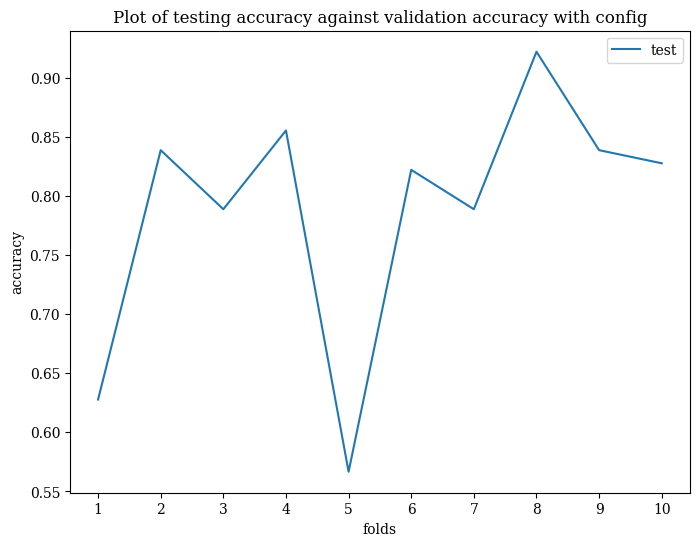

In [53]:
acc_list = [0.6277777777777778, 
 0.8388888888888889, 
 0.7888888888888889, 
 0.8555555555555555, 
 0.5666666666666667, 
 0.8222222222222222, 
 0.7888888888888889, 
 0.9222222222222223, 
 0.8388888888888889, 
 0.8277777777777777]

x = np.arange(1,11)
plt.figure(figsize=(8, 6))
plt.plot(x, acc_list, label='test')
#plt.plot(x, np.squeeze(df_attn['accuracy'].values), label='attn')
#plt.plot(x, np.squeeze(df_val['accuracy'].values), label='val')
plt.legend()
plt.xlabel('folds')
plt.ylabel('accuracy')
plt.xticks(x)
plt.title(f"Plot of testing accuracy against validation accuracy with config")#. {config}")
plt.show()

In [55]:
np.std(acc_list)

0.10255381002487077

In [41]:
np.mean(list(acc_dict.values()))

0.7598540564373898

In [42]:
np.std(list(acc_dict.values()))

0.04632309430387411

In [57]:
df = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/report_svm.pkl")
sens_list, spes_list = [], []
for elem in df:
    sens = df[elem]['1']['recall']
    spes = df[elem]['0']['recall']
    sens_list.append(sens)
    spes_list.append(spes)
    #print(f"spes mean {elem}: {(spes)}")
print(f"mean sens: {np.mean(sens_list)}")
print(f"std sens: {np.std(sens_list)}")
print(f"mean spes: {np.mean(spes_list)}")
print(f"std spes: {np.std(spes_list)}")

mean sens: 0.7955555555555556
std sens: 0.09521904571390469
mean spes: 0.78
std spes: 0.21074822612495417


In [60]:
spes_list

[0.6222222222222222,
 0.9555555555555556,
 0.8777777777777778,
 0.8777777777777778,
 0.23333333333333334,
 0.9,
 0.7333333333333333,
 0.9444444444444444,
 0.9333333333333333,
 0.7222222222222222]

In [52]:
#print(len(test_org_ids))
#print(len(test_probs))
#print(test_org_ids)
#print(test_probs)
df = pd.read_csv("/home/stinasb/SSL4PR/TVs_copy/val_speaker_ids.csv")['5']
df

0    AVPEPUDEAC0039
1     AVPEPUDEA0005
2    AVPEPUDEAC0025
3     AVPEPUDEA0017
4    AVPEPUDEAC0011
5    AVPEPUDEAC0053
6     AVPEPUDEA0034
7     AVPEPUDEA0010
8    AVPEPUDEAC0019
Name: 5, dtype: object

In [4]:
#data = pd.read_csv(f"/home/stinasb/SSL4PR/TV_train_test/Fold5/train/train.csv")

#speaker_data = data[data['speaker_id']== 'AVPEPUDEAC0019']
#speaker_data
        

In [106]:
#probs = np.concatenate(test_probs, axis=0).squeeze(1)
#probs.shape
probs = pd.read_csv("/home/stinasb/SSL4PR/TVs_copy/probs_5.csv")
test_probs = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/test_probs.pkl")
test_probs[5].notna()

AVPEPUDEA0001_Monologo-NR    False
AVPEPUDEA0001_juan           False
AVPEPUDEA0001_ka             False
AVPEPUDEA0001_laura          False
AVPEPUDEA0001_loslibros      False
                             ...  
AVPEPUDEAC0045_readtext      False
AVPEPUDEAC0045_rosita        False
AVPEPUDEAC0045_ta            False
AVPEPUDEAC0045_triste        False
AVPEPUDEAC0045_viste         False
Name: 5, Length: 1800, dtype: bool

In [69]:
for i in range(1, 11):
    df = pd.read_csv(f"/home/stinasb/SSL4PR/TV_train_test/Fold{str(i)}/train/train.csv")
    print(set(df[df['labels'] == 1]['UPDRS-speech']))

{0.0, 1.0, 2.0, 3.0}
{0.0, 1.0, 2.0, 3.0}
{0.0, 1.0, 2.0, 3.0}
{0.0, 1.0, 2.0, 3.0}
{0.0, 1.0, 2.0, 3.0}
{0.0, 1.0, 2.0, 3.0}
{0.0, 1.0, 2.0, 3.0}
{0.0, 1.0, 2.0, 3.0}
{0.0, 1.0, 2.0, 3.0}
{0.0, 1.0, 2.0, 3.0}


In [103]:
#orgs = np.concatenate(test_org_ids, axis=0)
#orgs.shape
#gita_dir = '/talebase/data/speech_raw/S0489/'
#df = pd.read_csv("/home/stinasb/SSL4PR/BDHPD-splits/ewadb_metadata_bdhpd/test_metadata.tsv", sep="\t")
#wavfiles=np.array(glob.glob(gita_dir + '**/*.wav', recursive = True))


In [63]:
test = pd.read_csv("/home/stinasb/SSL4PR/BDHPD-splits/ewadb_metadata_bdhpd/test_metadata.tsv", sep="\t")
diagnosis = 'Healthy' #'Parkinson' 'Healthy'
#test[[ 'DIAGNOSIS', 'SPEAKER_CODE']].value_counts()
#test[test[ 'DIAGNOSIS']== diagnosis]['SPEAKER_CODE'].nunique()
test

,PICTURE,SPEAKER_CODE,DIAGNOSIS,INCLUSIVE_CRITERIA,AUDIOFILE,ASR_transcription,MANUAL_transcription
0,big3,b2yubczy01,Healthy,True,./Healthy/b2yubczy01//picture/big3.wav,[spk] muž sa nachádza v kuchyni aj so svojím s...,[hez] muž sa nachádza v kuchyni aj so svojím s...
1,big4,b2yubczy01,Healthy,True,./Healthy/b2yubczy01//picture/big4.wav,prostredie kuchyňa žena stojí za kuchynskou li...,[int] [UTT] prostredie je [spk] kuchyňa [UTT] ...
2,big5,b2yubczy01,Healthy,True,./Healthy/b2yubczy01//picture/big5.wav,nič prichádzajúci do bytu [fil] na vianoce ale...,[int] [UTT] muž prichádzajúci [spk] do bytu [i...
3,big6,b2yubczy01,Healthy,True,./Healthy/b2yubczy01//picture/big6.wav,[spk] jednou rukou sa dotýka v druhej ruke drž...,[UTT] [int] [UTT] jednou rukou sa dotýka druhe...
4,big7,b2yubczy01,Healthy,True,./Healthy/b2yubczy01//picture/big7.wav,[spk] [fil] nachádzajú sa tu stôl dve stoličky...,[hez] [spk] [spk] nachádza sa tu stôl dve stol...
...,...,...,...,...,...,...,...
1147,big4,ysw9zs5y01,Healthy,False,./Healthy/ysw9zs5y01//picture/big4.wav,no tak toto sú hodiny tá sa varí hrniec [spk] ...,[int] no tak to to sú hodiny tam sa varí hrnie...
1148,big5,ysw9zs5y01,Healthy,False,./Healthy/ysw9zs5y01//picture/big5.wav,vianoce vianočný stromček tam je pán [fil] [@]...,Vianoce vianočný stromček tam je pán [spk] na ...
1149,big6,ysw9zs5y01,Healthy,False,./Healthy/ysw9zs5y01//picture/big6.wav,ruka ruka prsty na ruke no tá sa drží prst má ...,ruka ruka prsty na ruke no tam si drží prst ma...
1150,big7,ysw9zs5y01,Healthy,False,./Healthy/ysw9zs5y01//picture/big7.wav,káva na stole stoličky stôl no a pripravená ká...,no káva na stole stoličky stôl no a pripravená...


In [102]:
train = pd.read_csv("/home/stinasb/SSL4PR/BDHPD-splits/ewadb_metadata_bdhpd/train_metadata.tsv", sep="\t")

#test[[ 'DIAGNOSIS', 'SPEAKER_CODE']].value_counts()
#train[train[ 'DIAGNOSIS']== diagnosis]#['SPEAKER_CODE'].nunique()

In [64]:
#pd.read_csv("/home/stinasb/SSL4PR/TV_train_test/test.csv")[pd.read_csv("/home/stinasb/SSL4PR/TV_train_test/test.csv")['labels']== 0]

In [20]:
val = pd.read_csv("/home/stinasb/SSL4PR/BDHPD-splits/ewadb_metadata_bdhpd/validation_metadata.tsv", sep="\t")

#test[[ 'DIAGNOSIS', 'SPEAKER_CODE']].value_counts()
val[val[ 'DIAGNOSIS']== diagnosis]['SPEAKER_CODE'].nunique()

89

In [12]:
data = pd.read_csv("/home/stinasb/SSL4PR/TV_train_test/Fold1/train/train.csv")
data['SEX'].value_counts()

SEX
F    810
M    810
Name: count, dtype: int64

In [ ]:
#labels = pd.read_csv("/home/stinasb/SSL4PR/TV_train_test/Fold9/test/test.csv")['labels']
#test_acc, test_report = compute_metrics(labels, preds)
#test_acc

In [69]:
df = pd.read_csv("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_results_bal_0_1_wav80.csv")
df #ast.literal_eval(df['report'][4])

,accuracy,sensitivity,specificity,report
0,0.677778,0.677778,0.677778,"{'0': {'precision': 0.6777777777777778, 'recal..."
1,0.816667,0.733333,0.900000,"{'0': {'precision': 0.7714285714285715, 'recal..."
2,0.794444,0.688889,0.900000,"{'0': {'precision': 0.7431192660550459, 'recal..."
3,0.877778,0.877778,0.877778,"{'0': {'precision': 0.8777777777777778, 'recal..."
4,0.483333,0.700000,0.266667,"{'0': {'precision': 0.47058823529411764, 'reca..."
5,0.833333,0.733333,0.933333,"{'0': {'precision': 0.7777777777777778, 'recal..."
6,0.772222,0.822222,0.722222,"{'0': {'precision': 0.8024691358024691, 'recal..."
7,0.955556,0.966667,0.944444,"{'0': {'precision': 0.9659090909090909, 'recal..."
8,0.827778,0.733333,0.922222,"{'0': {'precision': 0.7757009345794392, 'recal..."
9,0.833333,0.955556,0.711111,"{'0': {'precision': 0.9411764705882353, 'recal..."


In [70]:
print(f"acc mean: {np.mean(df['accuracy'].values)}")
print(f"acc std: {np.std(df['accuracy'].values)}")
print(f"sens mean: {np.mean(df['sensitivity'].values)}")
print(f"sens std: {np.std(df['sensitivity'].values)}")
print(f"spec mean: {np.mean(df['specificity'].values)}")
print(f"spec std: {np.std(df['specificity'].values)}")

acc mean: 0.787222222222222
acc std: 0.12161592041655334
sens mean: 0.788888888888889
sens std: 0.10387551904462441
spec mean: 0.7855555555555556
spec std: 0.1977059794770701


In [113]:
df = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/segment_testing/oppsett_2/test_results_loaded.pkl")
df #['report'][1]#['macro avg']


,accuracy,sensitivity,specificity,report
1,0.677778,0.688889,0.666667,"{'0': {'precision': 0.6818181818181818, 'recal..."
2,0.833333,0.777778,0.888889,"{'0': {'precision': 0.8, 'recall': 0.888888888..."
3,0.777778,0.688889,0.866667,"{'0': {'precision': 0.7358490566037735, 'recal..."
4,0.872222,0.877778,0.866667,"{'0': {'precision': 0.8764044943820225, 'recal..."
5,0.488889,0.711111,0.266667,"{'0': {'precision': 0.48, 'recall': 0.26666666..."
6,0.822222,0.711111,0.933333,"{'0': {'precision': 0.7636363636363637, 'recal..."
7,0.761111,0.811111,0.711111,"{'0': {'precision': 0.7901234567901234, 'recal..."
8,0.955556,0.955556,0.955556,"{'0': {'precision': 0.9555555555555556, 'recal..."
9,0.827778,0.744444,0.911111,"{'0': {'precision': 0.780952380952381, 'recall..."
10,0.827778,0.955556,0.700000,"{'0': {'precision': 0.9402985074626866, 'recal..."


In [112]:
print(f"acc mean: {np.mean(df['accuracy'].values)}")
print(f"acc std: {np.std(df['accuracy'].values)}")
print(f"sens mean: {np.mean(df['sensitivity'].values)}")
print(f"sens std: {np.std(df['sensitivity'].values)}")
print(f"spec mean: {np.mean(df['specificity'].values)}")
print(f"spec std: {np.std(df['specificity'].values)}")

acc mean: 0.7844444444444443
acc std: 0.1199485486406053
sens mean: 0.7922222222222223
sens std: 0.09901365412761871
spec mean: 0.7766666666666666
spec std: 0.1964154076076493


In [43]:
df_attn = pd.read_csv("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_results_bal_0_1_wav80.csv")
print(f"acc mean: {np.mean(df_attn['accuracy'].values)}")
print(f"acc std: {np.std(df_attn['accuracy'].values)}")
print(f"sens mean: {np.mean(df_attn['sensitivity'].values)}")
print(f"sens std: {np.std(df_attn['sensitivity'].values)}")
print(f"spec mean: {np.mean(df_attn['specificity'].values)}")
print(f"spec std: {np.std(df_attn['specificity'].values)}")
df_attn


acc mean: 0.787222222222222
acc std: 0.12161592041655334
sens mean: 0.788888888888889
sens std: 0.10387551904462441
spec mean: 0.7855555555555556
spec std: 0.1977059794770701


,accuracy,sensitivity,specificity,report
0,0.677778,0.677778,0.677778,"{'0': {'precision': 0.6777777777777778, 'recal..."
1,0.816667,0.733333,0.900000,"{'0': {'precision': 0.7714285714285715, 'recal..."
2,0.794444,0.688889,0.900000,"{'0': {'precision': 0.7431192660550459, 'recal..."
3,0.877778,0.877778,0.877778,"{'0': {'precision': 0.8777777777777778, 'recal..."
4,0.483333,0.700000,0.266667,"{'0': {'precision': 0.47058823529411764, 'reca..."
5,0.833333,0.733333,0.933333,"{'0': {'precision': 0.7777777777777778, 'recal..."
6,0.772222,0.822222,0.722222,"{'0': {'precision': 0.8024691358024691, 'recal..."
7,0.955556,0.966667,0.944444,"{'0': {'precision': 0.9659090909090909, 'recal..."
8,0.827778,0.733333,0.922222,"{'0': {'precision': 0.7757009345794392, 'recal..."
9,0.833333,0.955556,0.711111,"{'0': {'precision': 0.9411764705882353, 'recal..."


In [37]:
df_attn = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_results_bal_0_1_wav80.pkl")
print(f"acc mean: {np.mean(df_attn['accuracy'].values)}")
print(f"acc std: {np.std(df_attn['accuracy'].values)}")
print(f"sens mean: {np.mean(df_attn['sensitivity'].values)}")
print(f"sens std: {np.std(df_attn['sensitivity'].values)}")
print(f"spec mean: {np.mean(df_attn['specificity'].values)}")
print(f"spec std: {np.std(df_attn['specificity'].values)}")
df_attn



FileNotFoundError: [Errno 2] No such file or directory: '/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_results_bal_0_1_wav80.pkl'

In [139]:
#df_val = pd.read_csv("/home/stinasb/SSL4PR/TVs_copy/val_results_attention.csv")
df_val = pd.read_csv("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/val_results_bal_0_1_tv.csv")

df_val

,accuracy,sensitivity,specificity,report
0,0.685185,0.680556,0.688889,"{'0': {'precision': 0.7294117647058823, 'recal..."
1,0.716049,0.638889,0.777778,"{'0': {'precision': 0.7291666666666666, 'recal..."
2,0.820988,0.833333,0.811111,"{'0': {'precision': 0.8588235294117647, 'recal..."
3,0.845679,0.791667,0.888889,"{'0': {'precision': 0.8421052631578947, 'recal..."
4,0.734568,0.722222,0.744444,"{'0': {'precision': 0.7701149425287356, 'recal..."
5,0.820988,0.805556,0.833333,"{'0': {'precision': 0.8426966292134831, 'recal..."
6,0.845679,0.791667,0.888889,"{'0': {'precision': 0.8421052631578947, 'recal..."
7,0.808642,0.722222,0.877778,"{'0': {'precision': 0.797979797979798, 'recall..."
8,0.777778,0.694444,0.844444,"{'0': {'precision': 0.7755102040816326, 'recal..."
9,0.716049,0.597222,0.811111,"{'0': {'precision': 0.7156862745098039, 'recal..."


In [128]:
#df_val = pd.read_csv("/home/stinasb/SSL4PR/TVs_copy/val_results_attention.csv")
df_val = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/oppsett_1/val_results_bal_0_1_wav80.pkl")

df_val

,accuracy,sensitivity,specificity,report
1,0.703704,0.805556,0.622222,"{'0': {'precision': 0.8, 'recall': 0.622222222..."
2,0.765432,0.875000,0.677778,"{'0': {'precision': 0.8714285714285714, 'recal..."
3,0.895062,0.861111,0.922222,"{'0': {'precision': 0.8924731182795699, 'recal..."
4,0.932099,0.875000,0.977778,"{'0': {'precision': 0.9072164948453608, 'recal..."
5,0.845679,0.972222,0.744444,"{'0': {'precision': 0.9710144927536232, 'recal..."
6,0.901235,0.875000,0.922222,"{'0': {'precision': 0.9021739130434783, 'recal..."
7,0.870370,0.888889,0.855556,"{'0': {'precision': 0.9058823529411765, 'recal..."
8,0.901235,0.944444,0.866667,"{'0': {'precision': 0.9512195121951219, 'recal..."
9,0.864198,0.819444,0.900000,"{'0': {'precision': 0.8617021276595744, 'recal..."
10,0.740741,0.875000,0.633333,"{'0': {'precision': 0.8636363636363636, 'recal..."


In [72]:
def calc_f1_score(df, pickle):
    rep = df['report']
    f1_score = {'macro': {}, 'weighted': {}}
    for i in range(0, 10):
        if pickle:
            
            f1_score['weighted'][i] = rep[i+1]['weighted avg']['f1-score']
            f1_score['macro'][i] = rep[i+1]['macro avg']['f1-score']
        else:
            f1_score['weighted'][i] = ast.literal_eval(df['report'][i])['weighted avg']['f1-score']
            f1_score['macro'][i] = ast.literal_eval(df['report'][i])['macro avg']['f1-score']
    
    return f1_score
pickle = False
f1_score = calc_f1_score(df, pickle)

In [73]:
print(f"mean of f1-score of macro: {np.mean(list(f1_score['macro'].values()))}")
print(f"std of f1-score of macro: {np.std(list(f1_score['macro'].values()))}")
print(f"mean of f1-score of weighted: {np.mean(list(f1_score['weighted'].values()))}")
print(f"std of f1-score of weighted: {np.std(list(f1_score['weighted'].values()))}")

mean of f1-score of macro: 0.7836837401324863
std of f1-score of macro: 0.12779105499253285
mean of f1-score of weighted: 0.7836837401324862
std of f1-score of weighted: 0.12779105499253282


0.7682610686356856
0.12138074229237934


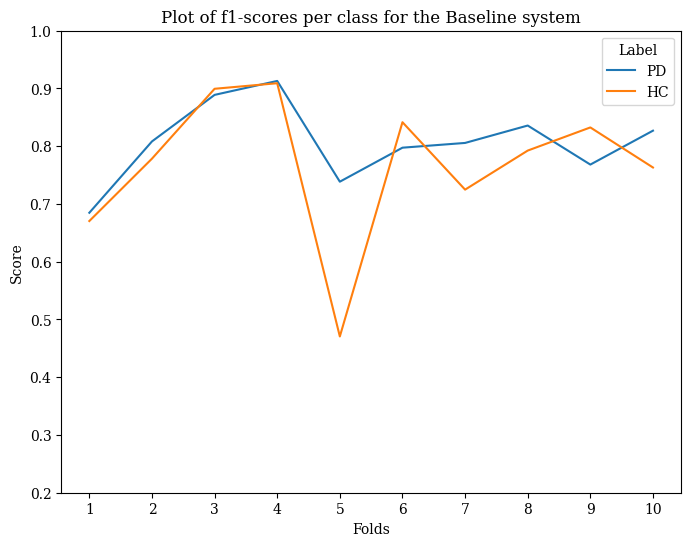

In [ ]:
import matplotlib.pyplot as plt
f1_score = calc_f1_score(df, True)

config = ''
metric = 'accuracy' #'sensitivity' # 'accuracy'  'specificity' 
x = np.arange(1,11)
plt.figure(figsize=(8, 6))
#plt.plot(x, np.squeeze(df[metric].values), label='Baseline')
#plt.plot(x, np.squeeze(df[metric].values), label='Segment')
#plt.plot(x, f1_score['1'].values(), label = 'PD')
#plt.plot(x, f1_score['0'].values(), label = 'HC')
#plt.plot(x, np.squeeze(df_val[metric].values), label='Validation')
plt.legend()
plt.xlabel('Folds')
plt.ylabel('Score')
plt.ylim([0.2, 1])
plt.xticks(x)
plt.legend(title='Label')
plt.title(f"Plot of f1-scores per class for the Baseline system")#. {config}")
plt.show()

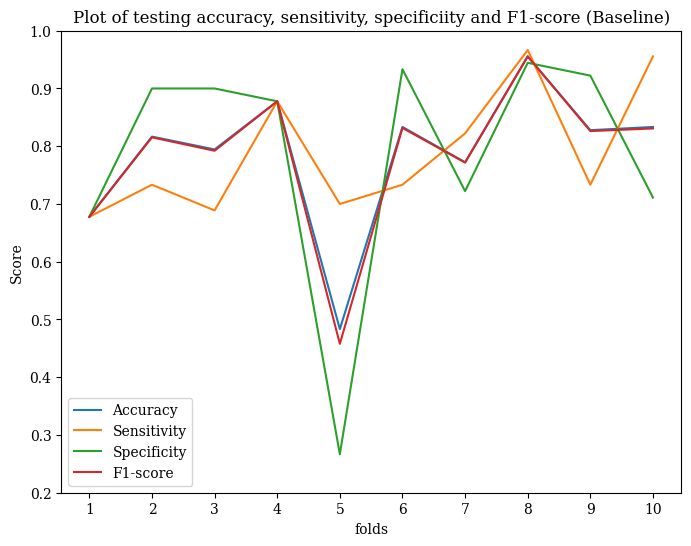

In [75]:
x = np.arange(1,11)

keys = ['accuracy', 'sensitivity', 'specificity']
label = ['Accuracy', 'Sensitivity', 'Specificity']
pickle = False
f1_score = calc_f1_score(df, pickle)
plt.figure(figsize=(8, 6))  # Opprett én figur
#for key in keys:
    
 #   plt.plot(x, np.squeeze(df[key]), label=key)
 
plt.plot(x, np.squeeze(df['accuracy'].values), label='Accuracy')
plt.plot(x, np.squeeze(df['sensitivity'].values), label='Sensitivity')
plt.plot(x, np.squeeze(df['specificity'].values), label='Specificity')
plt.plot(x, f1_score['macro'].values(), label = "F1-score")
    
plt.legend()
plt.xlabel('folds')
plt.ylabel('Score')
plt.xticks(x)
plt.ylim([0.2, 1])
plt.title("Plot of testing accuracy, sensitivity, specificiity and F1-score (Baseline)")
plt.show()

#plt.figure(figsize=(8, 6))  # Opprett én figur
#for key in keys:
    
 #   plt.plot(x, np.squeeze(df_attn[key])*100, label=key)
    
#plt.legend()
#plt.xlabel('folds')
#plt.ylabel('Percentage')
#plt.xticks(x)
#plt.show()

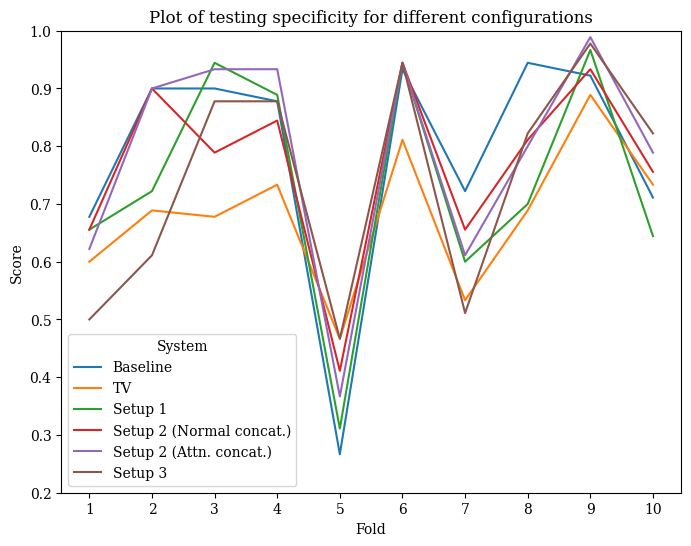

In [37]:
df_layer1 = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/testing_classifier/test_results_bal_0_1_wav80_1024_1.pkl")
df_layer2 = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/testing_classifier/test_results_bal_0_1_wav80_512_2.pkl")
df_layer3 = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/testing_classifier/test_results_bal_0_1_wav80_256_3.pkl")
df_baseline = pd.read_csv("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_results_bal_0_1_wav80.csv")
df_tv = pd.read_csv("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_results_bal_0_1_tv.csv")
df_setup1 = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/oppsett_1/test_results_bal_0_1_wav80.pkl")
df_attn = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_results_bal_0_1_attn80.pkl")
df_both = pd.read_csv("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_results_bal_0_1_both80.csv")
df_setup3 = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/oppsett_3/test_results_bal_0_1_wav80.pkl")
#df_layer1 = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/testing_pooling/oppsett_2/test_results_bal_0_1_wav80_layer1.pkl")
#df_layer2 = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/testing_pooling/oppsett_2/test_results_bal_0_1_wav80_layer2.pkl")
#df_layer3 = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/testing_pooling/oppsett_2/test_results_bal_0_1_wav80_layer3.pkl")
df_layer4 = {'accuracy': {1: 0.6277777777777778,
 2: 0.8388888888888889,
 3: 0.7888888888888889,
 4: 0.8555555555555555,
 5: 0.5666666666666667,
 6: 0.8222222222222222,
 7: 0.7888888888888889,
 8: 0.9222222222222223,
 9: 0.8388888888888889,
 10: 0.8277777777777777}, 'sensitivity' : {1: 0.6333333333333333,
2:  0.7222222222222222,
3: 0.7,
4: 0.8333333333333334,
5: 0.9,
6: 0.7444444444444445,
7: 0.8444444444444444,
8: 0.9,
9: 0.7444444444444445,
10: 0.9333333333333333}, 'specificity': {1:0.6222222222222222,
 2:0.9555555555555556,
 3:0.8777777777777778,
 4:0.8777777777777778,
 5:0.23333333333333334,
 6:0.9,
 7:0.7333333333333333,
 8:0.9444444444444444,
 9:0.9333333333333333,
 10:0.7222222222222222}}

metric ='specificity' #'accuracy' 'sensitivity'  'specificity'
x = np.arange(1,11)
plt.figure(figsize=(8, 6))
plt.plot(x, np.squeeze(df_baseline[metric].values), label='Baseline')
plt.plot(x, np.squeeze(df_tv[metric].values), label='TV')
plt.plot(x, np.squeeze(df_setup1[metric].values), label='Setup 1')
plt.plot(x, np.squeeze(df_both[metric].values), label='Setup 2 (Normal concat.)')
plt.plot(x, np.squeeze(df_attn[metric].values), label='Setup 2 (Attn. concat.)')
plt.plot(x, np.squeeze(df_setup3[metric].values), label='Setup 3')
#plt.plot(x, np.squeeze(df_layer1[metric].values), label='DNN 1')
#plt.plot(x, np.squeeze(df_layer2[metric].values), label='DNN 2')
#plt.plot(x, np.squeeze(df_layer3[metric].values), label='DNN 3')
#plt.plot(x, list(df_layer4[metric].values()), label='SVM')
plt.legend()
plt.xlabel('Fold')
plt.ylabel('Score')
plt.xticks(x)
plt.ylim([0.2 ,1])
plt.legend(title='System')
plt.title(f"Plot of testing {metric} for different configurations")#. {config}")
plt.show()

In [36]:
def load_pred(filepath, fold):

    path = f"/home/stinasb/SSL4PR/TV_train_test/Fold{fold}/test/test.csv"
    
    df = pd.read_csv(path)
    
    pred = pd.read_csv(filepath)
    
    try:
        pred_x = np.array([int(x.strip('[]')) for x in pred[fold]])
    except AttributeError:
        pred_x = pred[fold]
    
    df['speech_task'] = df['sample_wav'].str.replace(
    '/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/', '', regex=False
    ).apply(lambda x: x.split('/')[0])
    
    df['pred'] = pred_x 
    
    return df

def accuracy_per_param(param, df):

    
    #acc_per_param = {}
    # Calculate accuracy for each task by excluding the grouping column
    accuracy_per_task = df.groupby(param).apply(
        lambda x: (x['labels'] == x['pred']).mean(), include_groups=False
    ).reset_index(name='accuracy')
    
    #acc_per_param[param] = accuracy_per_task
    
    return accuracy_per_task
    
def plot_accuracy_per_param(param, accuracy_per_task, method, fold):
    accuracy_per_task.set_index(param)['accuracy'].plot(kind='bar', figsize=(8, 6))

    # Plot accuracy
    #accuracy_per_task.plot(x=param, y='accuracy', kind='bar', figsize=(8, 6))
    plt.title(f"Accuracy per {param} in fold {fold} ({method})")
    plt.xlabel(param)
    plt.ylabel('Accuracy score')
    plt.ylim(0, 1)
    plt.show(block=True)
    
def all_folds_acc_per_param(param, filepath):
    folds = np.arange(1,11)
    
    all_folds_acc_per_param_dict = {}
    
    for fold in folds:
        #print(fold)
        df = load_pred(filepath, str(fold))
        accuracy_per_task = accuracy_per_param(param, df)
        all_folds_acc_per_param_dict[fold] = accuracy_per_task
        
    return all_folds_acc_per_param_dict

def stats_per_param_all_folds(folds_dict, param):
    df_all = pd.concat(folds_dict.values(), ignore_index=True)
    
    stats_df = df_all.groupby(param)['accuracy'].agg(['mean','std']).reset_index()
    
    return stats_df


In [100]:
fold_nr = '9'
method = 'TV'
param = 'speech_task'  # 'speaker_id' 'speech_task' 'UPDRS-speech'
filepath = "/home/stinasb/SSL4PR/pre_experiments/oppsett_3/test_predictions_bal_0_1_wav80.csv"
#filepath = "/home/stinasb/SSL4PR/pre_experiments/segment_testing/oppsett_2/test_predictions_loaded.csv"
#filepath = "/home/stinasb/SSL4PR/pre_experiments/testing_classifier/test_predictions_bal_0_1_wav80_256_3.csv"
#filepath = "/home/stinasb/SSL4PR/TVs_copy/pred_svm.csv"
df = load_pred(filepath, fold_nr)


acc_dict = accuracy_per_param(param, df)

#plot_accuracy_per_param(param, acc_dict, method, fold_nr)

folds_dict = all_folds_acc_per_param(param, filepath)

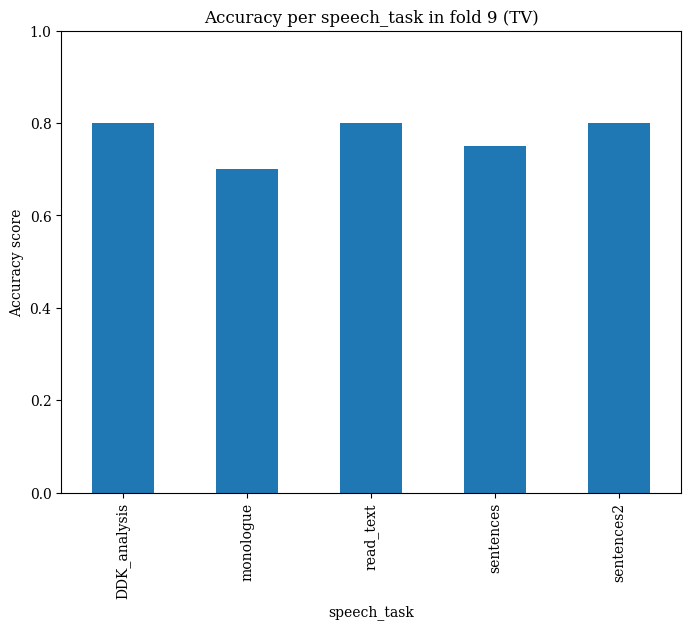

In [88]:
plot_accuracy_per_param(param, acc_dict, method, fold_nr)

In [81]:
i=9
df = pd.read_csv(f"/home/stinasb/SSL4PR/TV_train_test/Fold{str(i)}/test/test.csv")
unique_speakers = list(set(df['speaker_id']))

#for elem in unique_speakers:
    #for index, value in df[df['speaker_id']==elem]['UPDRS-speech'].notna().items():
        #if value:
    #if df[df['speaker_id']==elem]['UPDRS-speech'].notna()[1]:
            #print(f" {elem} :{df[df['speaker_id']==elem]['UPDRS-speech']}")

df[df['speaker_id']=='AVPEPUDEA0029']

,sample_tv,sample_wav,labels,speaker_id,origin_id,status,UPDRS,UPDRS-speech,H/Y,SEX,AGE,time after diagnosis
36,/home/stinasb/SSL4PR/TVs_copy_test/monologue/s...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0029,AVPEPUDEA0029_Monologo-NR,pd,19.0,0.0,2.0,F,69.0,12.0
37,/home/stinasb/SSL4PR/TVs_copy_test/sentences2/...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0029,AVPEPUDEA0029_juan,pd,19.0,0.0,2.0,F,69.0,12.0
38,/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysi...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0029,AVPEPUDEA0029_ka,pd,19.0,0.0,2.0,F,69.0,12.0
39,/home/stinasb/SSL4PR/TVs_copy_test/sentences/l...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0029,AVPEPUDEA0029_laura,pd,19.0,0.0,2.0,F,69.0,12.0
40,/home/stinasb/SSL4PR/TVs_copy_test/sentences/l...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0029,AVPEPUDEA0029_loslibros,pd,19.0,0.0,2.0,F,69.0,12.0
41,/home/stinasb/SSL4PR/TVs_copy_test/sentences/l...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0029,AVPEPUDEA0029_luisa,pd,19.0,0.0,2.0,F,69.0,12.0
42,/home/stinasb/SSL4PR/TVs_copy_test/sentences/m...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0029,AVPEPUDEA0029_micasa,pd,19.0,0.0,2.0,F,69.0,12.0
43,/home/stinasb/SSL4PR/TVs_copy_test/sentences/o...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0029,AVPEPUDEA0029_omar,pd,19.0,0.0,2.0,F,69.0,12.0
44,/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysi...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0029,AVPEPUDEA0029_pa,pd,19.0,0.0,2.0,F,69.0,12.0
45,/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysi...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0029,AVPEPUDEA0029_pakata,pd,19.0,0.0,2.0,F,69.0,12.0


In [104]:
#folds_dict[5]
pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/train_reference.pkl")

,1,2,3,4,5,6,7,8,9,10
0,1,1,0,0,1,0,0,0,1,1
1,1,1,1,0,0,0,0,0,1,0
2,1,0,1,0,1,1,1,0,1,1
3,0,1,1,0,0,1,1,0,1,1
4,0,0,0,0,1,0,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...
1451,0,1,1,1,0,1,0,0,0,1
1452,0,1,0,1,0,0,1,1,0,0
1453,1,1,0,0,1,1,0,0,0,1
1454,1,1,1,0,0,1,1,0,1,1


In [101]:
stats_df = stats_per_param_all_folds(folds_dict, param)
stats_df

,speech_task,mean,std
0,DDK_analysis,0.7550,0.107454
1,monologue,0.7500,0.164992
2,read_text,0.8200,0.168655
3,sentences,0.7950,0.101242
4,sentences2,0.7975,0.116934


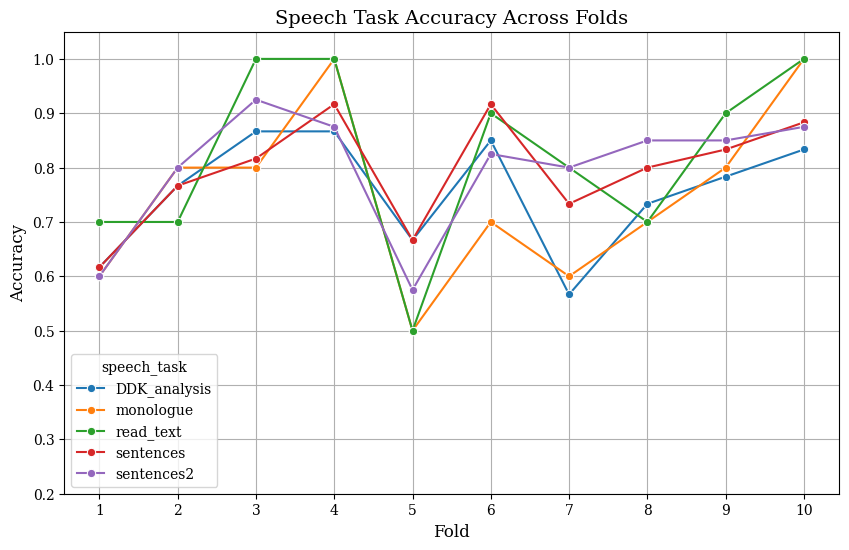

In [102]:
df_list = []
for fold, df in folds_dict.items():
    df["fold"] = fold
    df_list.append(df)

df_all = pd.concat(df_list, ignore_index=True)
param_plot = "speech_task"
df_all = df_all.sort_values(by=["fold"])

# Plot using seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_all, x="fold", y="accuracy", hue=param_plot, marker="o")

# Formatting the plot
plt.title("Speech Task Accuracy Across Folds", fontsize=14)
plt.xlabel("Fold", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.xticks(range(1, 11))  # Ensure x-axis labels show folds 1-10
plt.ylim(0.2, 1.05)  # Adjust y-axis range for clarity
plt.legend(title=param_plot)
plt.grid(True)

# Show the plot
plt.show()


In [51]:
probs = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/test_probs.pkl")
for index, value in probs[5].dropna().items():
    print(f"{index}: {value}")

AVPEPUDEA0011_Monologo-NR: [[0.06316198 0.93683803]
 [0.11330538 0.8866946 ]
 [0.12744719 0.8725529 ]]
AVPEPUDEA0011_juan: [[0.15063095 0.84936905]]
AVPEPUDEA0011_ka: [[0.02374579 0.9762542 ]]
AVPEPUDEA0011_laura: [[0.60788167 0.39211836]]
AVPEPUDEA0011_loslibros: [[0.4844227  0.51557726]]
AVPEPUDEA0011_luisa: [[0.13750072 0.8624993 ]]
AVPEPUDEA0011_micasa: [[0.5011674  0.49883258]]
AVPEPUDEA0011_omar: [[0.77021724 0.22978276]]
AVPEPUDEA0011_pa: [[0.01869389 0.98130614]]
AVPEPUDEA0011_pakata: [[0.5232718  0.47672823]]
AVPEPUDEA0011_pataka: [[0.5167762 0.4832238]]
AVPEPUDEA0011_petaka: [[0.5996925  0.40030748]]
AVPEPUDEA0011_preocupado: [[0.42462325 0.5753768 ]]
AVPEPUDEA0011_readtext: [[0.21201783 0.7879822 ]
 [0.08271373 0.9172863 ]]
AVPEPUDEA0011_rosita: [[0.25055856 0.74944144]]
AVPEPUDEA0011_ta: [[0.01281157 0.9871884 ]]
AVPEPUDEA0011_triste: [[0.61754596 0.38245404]]
AVPEPUDEA0011_viste: [[0.23876147 0.7612385 ]]
AVPEPUDEA0020_Monologo-NR: [[0.10123461 0.8987654 ]
 [0.09564164 0.9

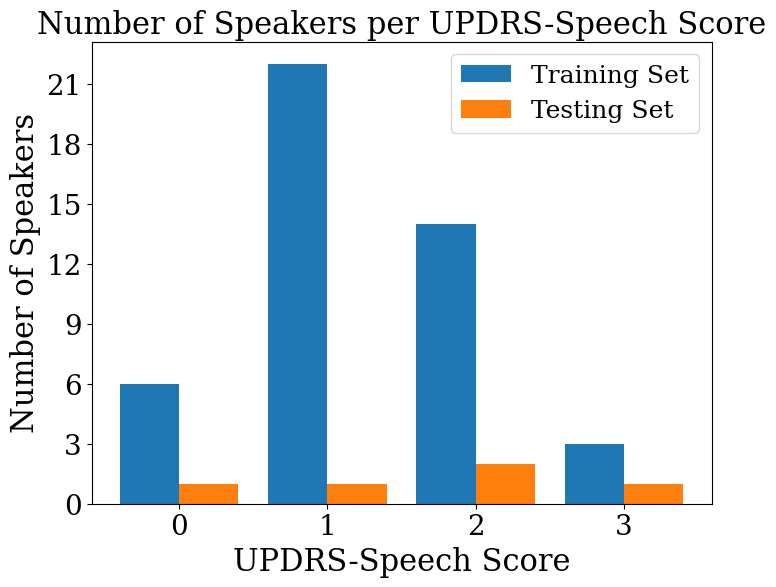

In [68]:
from matplotlib.ticker import MaxNLocator
def updrs_speech_rep(files, files_train, ax):
    # Grouping by UPDRS_Speech and counting the number of speakers
    files_train = files_train.drop_duplicates(subset='speaker_id')
    files = files.drop_duplicates(subset='speaker_id')

    validation_counts = files_train.groupby("UPDRS-speech").size()
    testing_counts = files.groupby("UPDRS-speech").size()

    # Ensuring all UPDRS_Speech scores are represented
    all_scores = sorted(set(validation_counts.index).union(testing_counts.index))
    validation_counts = validation_counts.reindex(all_scores, fill_value=0)
    testing_counts = testing_counts.reindex(all_scores, fill_value=0)

    # Plotting
    ax.bar(np.array(all_scores) - 0.2, validation_counts, width=0.4, label="Training Set")
    ax.bar(np.array(all_scores) + 0.2, testing_counts, width=0.4, label="Testing Set")

    # Adding labels and title with custom font sizes
    ax.set_xlabel("UPDRS-Speech Score", fontsize=22)
    ax.set_ylabel("Number of Speakers", fontsize=22)
    ax.set_title("Number of Speakers per UPDRS-Speech Score", fontsize=22)
    ax.set_xticks(all_scores)
    ax.tick_params(axis='both', which='major', labelsize=20)
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    ax.legend(fontsize=18)
    
files = pd.read_csv("/home/stinasb/SSL4PR/TV_train_test/Fold3/test/test.csv")
files_train = pd.read_csv("/home/stinasb/SSL4PR/TV_train_test/Fold3/train/train.csv")

# Create plot
fig, ax = plt.subplots(figsize=(8, 6))
updrs_speech_rep(files, files_train, ax)
plt.show()

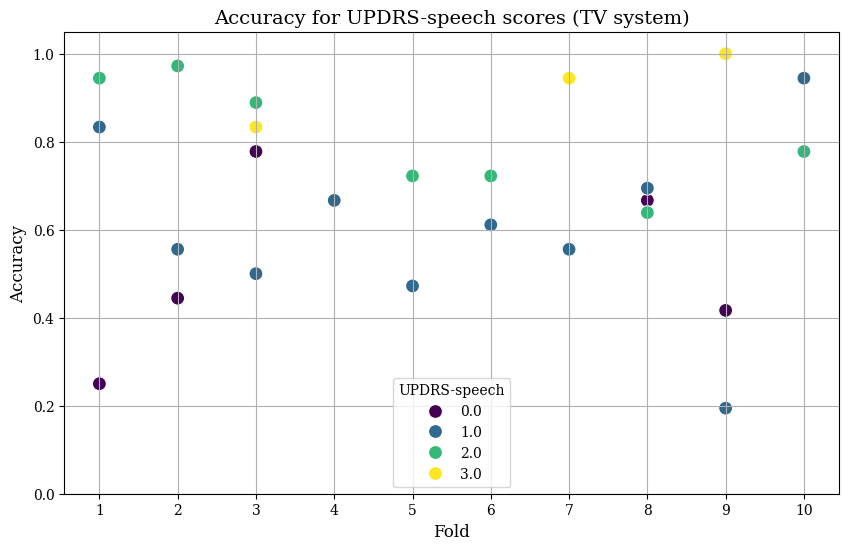

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns

#UPDRS-speech

filepath = "/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_predictions_bal_0_1_tv.csv"
#filepath = "/home/stinasb/SSL4PR/pre_experiments/segment_testing/oppsett_2/test_predictions_loaded.csv"
#filepath = "/home/stinasb/SSL4PR/pre_experiments/testing_classifier/test_predictions_bal_0_1_wav80_256_3.csv"
#filepath = "/home/stinasb/SSL4PR/TVs_copy/pred_svm.csv"
df = load_pred(filepath, fold_nr)

folds_dict = all_folds_acc_per_param('UPDRS-speech', filepath)
df_list = []
for fold, df in folds_dict.items():
    df["fold"] = fold
    df_list.append(df)

df_all = pd.concat(df_list, ignore_index=True)
df_all = df_all.sort_values(by=["fold"])

# Filter data for UPDRS-speech only
df_updrs = df_all[df_all["UPDRS-speech"].notnull()]  # or just df_all if 'UPDRS-speech' is the column used for hue

# If "UPDRS-speech" is a column and you want only those rows where it matches a condition, adjust accordingly.
# For example, if param_plot is a column name and you want rows where param_plot == "UPDRS-speech":
# df_updrs = df_all[df_all[param_plot] == "UPDRS-speech"]

plt.figure(figsize=(10, 6))

# Scatter plot: x is fold, y is accuracy
sns.scatterplot(data=df_updrs, x="fold", y="accuracy", hue="UPDRS-speech", palette="viridis", s=100)
#sns.countplot(data=df_updrs, x="UPDRS-speech", palette="viridis",order=sorted(df_updrs["UPDRS-speech"].unique()))

#sns.countplot(data=df_updrs, x="UPDRS-speech", palette="viridis")

plt.title("Accuracy for UPDRS-speech scores (TV system)", fontsize=14)
plt.xlabel("Fold", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.xticks(range(1, 11))
plt.ylim(0.0, 1.05)
plt.grid(True)
plt.legend(title="UPDRS-speech")

plt.show()

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
/tmp/ipykernel_2338615/1249368063.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_updrs, x="UPDRS-speech", palette="viridis")
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


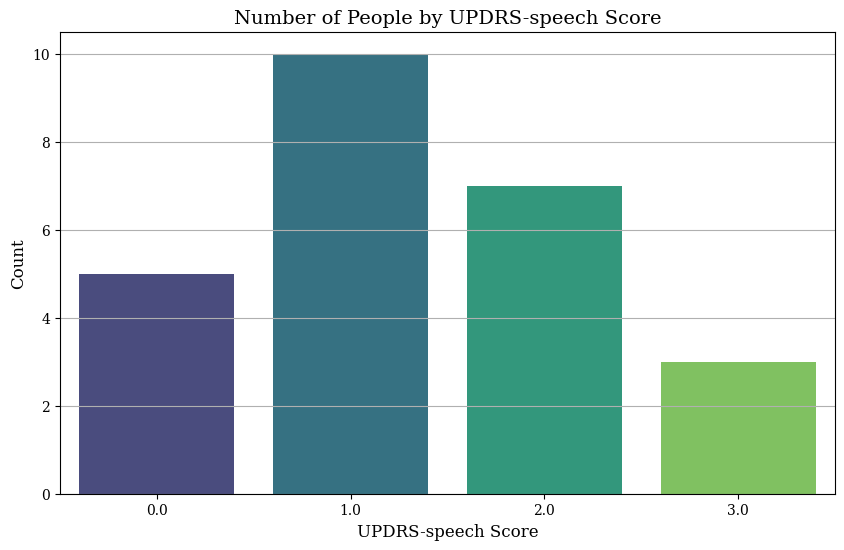

In [57]:
df_updrs = df_all[df_all["UPDRS-speech"].notnull()]

plt.figure(figsize=(10, 6))

# Count plot: x-axis is UPDRS-speech score, y-axis is count of people
sns.countplot(data=df_updrs, x="UPDRS-speech", palette="viridis")

plt.title("Number of People by UPDRS-speech Score", fontsize=14)
plt.xlabel("UPDRS-speech Score", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.grid(axis='y')

plt.show()

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns
df_list = []
for fold, df in folds_dict.items():
    df["fold"] = fold
    df_list.append(df)

df_all = pd.concat(df_list, ignore_index=True)
plt.figure(figsize=(10, 6))

# Scatter plot with each speaker as a point
# x: fold, y: accuracy
# hue: UPDRS-speech score (continuous color mapping)
sns.scatterplot(data=df_all, x="fold", y="accuracy", hue="UPDRS-speech", palette="viridis", s=100)

plt.title("Accuracy by Fold for All PD Speakers\nColored by UPDRS-speech Score", fontsize=14)
plt.xlabel("Fold", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.xticks(range(1, 11))
plt.ylim(0.2, 1.05)
plt.grid(True)

# Show color bar legend for continuous UPDRS-speech scores
plt.legend(title="UPDRS-speech Score", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.show()


ValueError: Could not interpret value `UPDRS-speech` for `hue`. An entry with this name does not appear in `data`.

<Figure size 1000x600 with 0 Axes>

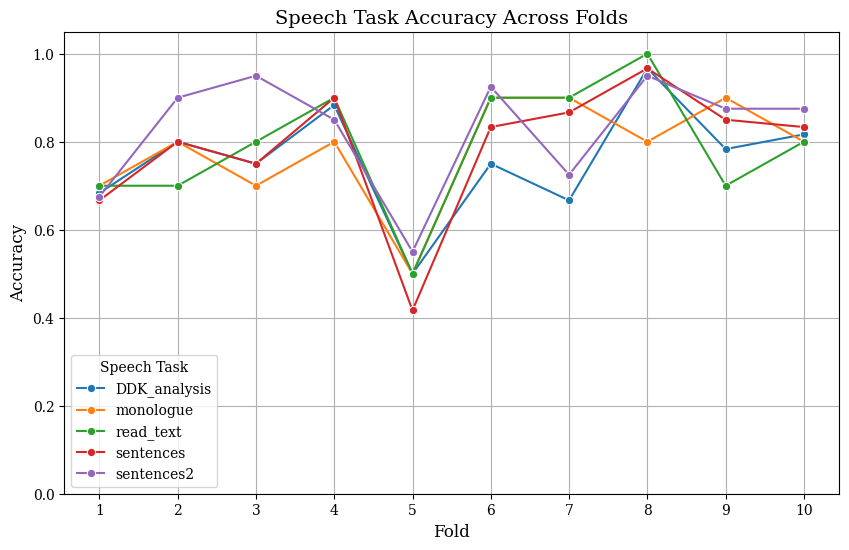

In [63]:
fold_nr = '5'
method = 'Comb. '
param = 'speech_task' #'speech_task'
filepath = "/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_predictions_bal_0_1_wav80.csv"
df = load_pred(filepath, fold_nr)



acc_dict = accuracy_per_param(param, df)

#plot_accuracy_per_param(param, acc_dict, method, fold_nr)

folds_dict = all_folds_acc_per_param(param, filepath)

stats_df = stats_per_param_all_folds(folds_dict, param)

df_list = []
for fold, df in folds_dict.items():
    df["fold"] = fold
    df_list.append(df)

df_all = pd.concat(df_list, ignore_index=True)

# Plot using seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_all, x="fold", y="accuracy", hue="speech_task", marker="o")

# Formatting the plot
plt.title("Speech Task Accuracy Across Folds", fontsize=14)
plt.xlabel("Fold", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.xticks(range(1, 11))  # Ensure x-axis labels show folds 1-10
plt.ylim(0.0, 1.05)  # Adjust y-axis range for clarity
plt.legend(title="Speech Task")
plt.grid(True)

# Show the plot
plt.show()

In [64]:
stats_df
#folds_dict[5]

,speech_task,mean,std
0,DDK_analysis,0.760000,0.127221
1,monologue,0.780000,0.122927
2,read_text,0.790000,0.144914
3,sentences,0.788333,0.153770
4,sentences2,0.827500,0.133568


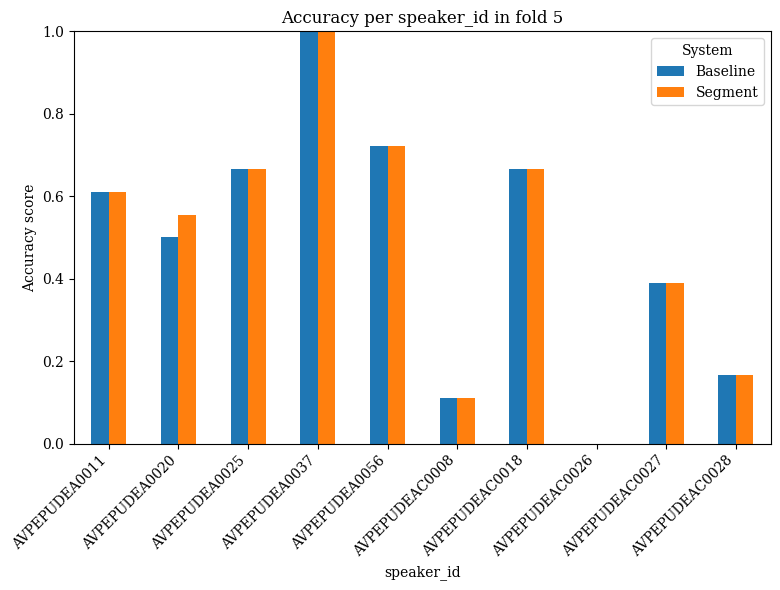

In [41]:
def plot_accuracy_per_param_dual(param, accuracy1, accuracy2, method1, method2, fold):
    # Rename for merging
    df1 = accuracy1.rename(columns={'accuracy': method1})
    df2 = accuracy2.rename(columns={'accuracy': method2})
    
    # Merge on param (e.g., 'speech_task')
    merged = pd.merge(df1, df2, on=param)

    # Set param as index
    merged.set_index(param, inplace=True)
    
    # Plot side-by-side bars
    ax = merged[[method1, method2]].plot(kind='bar', figsize=(8, 6))
    
    plt.title(f"Accuracy per {param} in fold {fold}")
    plt.xlabel(param)
    plt.ylabel('Accuracy score')
    plt.ylim(0, 1)
    plt.xticks(rotation=45)
    plt.legend(title='System')
    plt.tight_layout()
    
    ax.set_xticks(np.arange(len(merged)))  # set correct tick locations
    ax.set_xticklabels(merged.index, ha='right', rotation=45)
    plt.show()

fold_nr_dual = '5'
#method = 'Segment'
param = 'speaker_id'  # 'speaker_id' 'speech_task'
filepath_baseline = "/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_predictions_bal_0_1_wav80.csv"
#filepath_setup = "/home/stinasb/SSL4PR/pre_experiments/oppsett_1/test_predictions_bal_0_1_wav80.csv"
#filepath_segment = "/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_predictions_bal_0_1_tv.csv"
filepath_segment = "/home/stinasb/SSL4PR/pre_experiments/segment_testing/oppsett_2/test_predictions_loaded.csv"
#filepath = "/home/stinasb/SSL4PR/pre_experiments/testing_classifier/test_predictions_bal_0_1_wav80_512_2.csv"
df_baseline = load_pred(filepath_baseline, fold_nr_dual)

acc_dict_baseline = accuracy_per_param(param, df_baseline)

df_segment = load_pred(filepath_segment, fold_nr_dual)

acc_dict_segment = accuracy_per_param(param, df_segment)

#plot_accuracy_per_param(param, acc_dict, method, fold_nr)

#folds_dict = all_folds_acc_per_param(param, filepath)

plot_accuracy_per_param_dual(param, acc_dict_baseline, acc_dict_segment, 'Baseline', 'Segment', fold_nr_dual)

/tmp/ipykernel_765856/2156363134.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  accuracy_per_task = df.groupby(param).apply(


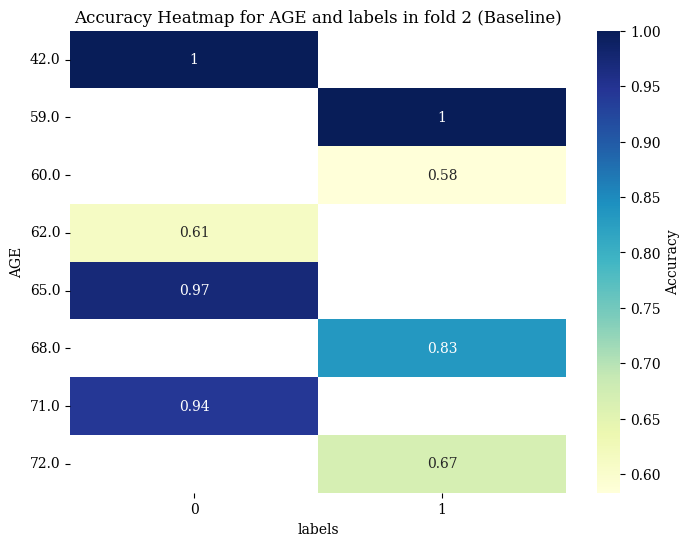

/tmp/ipykernel_765856/2156363134.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  accuracy_per_task = df.groupby(param).apply(


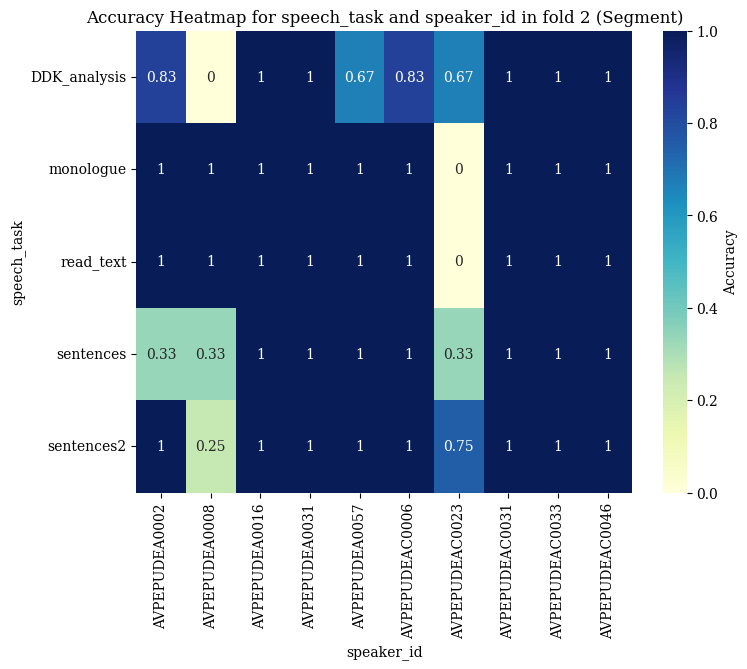

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def accuracy_per_param_heatmap_2(param, df, method, fold):
    """
    Plot accuracy per parameter or a heatmap if two parameters are provided.

    Parameters:
    - param: list or string, column(s) to group by (single column or two for heatmap)
    - df: pandas DataFrame containing the data
    - method: string, description of the method used
    - fold: string or int, fold identifier
    - ax: matplotlib Axes object for plotting
    """
    
    fig, ax = plt.subplots(figsize=(8, 6)) 
    
    if isinstance(param, list) and len(param) == 2:
        # Calculate accuracy for each combination of the two parameters
        accuracy_per_task = df.groupby(param).apply(
            lambda x: (x['labels'] == x['pred']).mean()
        ).reset_index(name='accuracy')
        
        # Pivot data for heatmap
        heatmap_data = accuracy_per_task.pivot(index=param[0], columns=param[1], values='accuracy')
        
        # Plot heatmap on the provided Axes
        sns.heatmap(heatmap_data, annot=True, cmap="YlGnBu", cbar_kws={'label': 'Accuracy'}, ax=ax)
        ax.set_title(f"Accuracy Heatmap for {param[0]} and {param[1]} in fold {fold} ({method})")
        ax.set_xlabel(param[1])
        ax.set_ylabel(param[0])
        
        # Set y-axis labels to horizontal
        ax.tick_params(axis='y', rotation=0)
    else:
        # Calculate accuracy for a single parameter
        accuracy_per_task = df.groupby(param).apply(
            lambda x: (x['true_label_int'] == x['pred']).mean()
        ).reset_index(name='accuracy')
        
        # Plot bar chart on the provided Axes
        accuracy_per_task.set_index(param)['accuracy'].plot(kind='bar', ax=ax)
        ax.set_title(f"Accuracy per {param} in fold {fold} ({method})")
        ax.set_xlabel(param)
        ax.set_ylabel('Accuracy score')
        ax.set_ylim(0, 1)
        
    return fig

fold_nr = '2'
filepath_baseline = "/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_predictions_bal_0_1_wav80.csv"
df_baseline = load_pred(filepath_baseline, fold_nr)

# Example usage with subplots
param_list = ['speech_task', 'speaker_id']  # Adjust parameters as needed
#fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)
#fig, ax = plt.subplots(figsize=(8,6))

fig = accuracy_per_param_heatmap_2(['AGE', 'labels'], df_baseline, 'Baseline', fold_nr)
#accuracy_per_param_heatmap_2(param_list, df_lora, 'LoRA', fold, axes[1])

plt.show()

#fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)

#accuracy_per_param_heatmap_2(param_list, df_adalora, 'AdaLoRA', fold, axes[0])
#accuracy_per_param_heatmap_2(param_list, df_vblora, 'VB-LoRA', fold, axes[1])

#plt.show()
filepath_segment = "/home/stinasb/SSL4PR/pre_experiments/segment_testing/oppsett_2/test_predictions_loaded.csv"
df_segment = load_pred(filepath_segment, fold_nr)

fig = accuracy_per_param_heatmap_2(param_list, df_segment, 'Segment', fold_nr)
plt.show()

In [63]:
#train_path = f"/home/stinasb/SSL4PR/TV_train_test/Fold9/train/train.csv"

#df_10 = pd.read_csv(train_path)
#pd.set_option('display.max_rows', None) 
#print(df['speaker_id'].value_counts())

#os.listdir("/talebase/data/speech_raw/PC-GITA-v2/TVs/model_2_torch")

#for i in range(1, 11):
i=5
df = pd.read_csv(f"/home/stinasb/SSL4PR/TV_train_test/Fold{str(i)}/test/test.csv")
unique_speakers = list(set(df['speaker_id']))

#for elem in unique_speakers:
    #for index, value in df[df['speaker_id']==elem]['UPDRS-speech'].notna().items():
        #if value:
    #if df[df['speaker_id']==elem]['UPDRS-speech'].notna()[1]:
            #print(f" {elem} :{df[df['speaker_id']==elem]['UPDRS-speech']}")

df[df['speaker_id']=='AVPEPUDEAC0028']

,sample_tv,sample_wav,labels,speaker_id,origin_id,status,UPDRS,UPDRS-speech,H/Y,SEX,AGE,time after diagnosis
162,/home/stinasb/SSL4PR/TVs_copy_test/monologue/s...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,0,AVPEPUDEAC0028,AVPEPUDEAC0028_Monologo-NR,hc,NaN,NaN,NaN,F,76.0,NaN
163,/home/stinasb/SSL4PR/TVs_copy_test/sentences2/...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,0,AVPEPUDEAC0028,AVPEPUDEAC0028_juan,hc,NaN,NaN,NaN,F,76.0,NaN
164,/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysi...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,0,AVPEPUDEAC0028,AVPEPUDEAC0028_ka,hc,NaN,NaN,NaN,F,76.0,NaN
165,/home/stinasb/SSL4PR/TVs_copy_test/sentences/l...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,0,AVPEPUDEAC0028,AVPEPUDEAC0028_laura,hc,NaN,NaN,NaN,F,76.0,NaN
166,/home/stinasb/SSL4PR/TVs_copy_test/sentences/l...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,0,AVPEPUDEAC0028,AVPEPUDEAC0028_loslibros,hc,NaN,NaN,NaN,F,76.0,NaN
167,/home/stinasb/SSL4PR/TVs_copy_test/sentences/l...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,0,AVPEPUDEAC0028,AVPEPUDEAC0028_luisa,hc,NaN,NaN,NaN,F,76.0,NaN
168,/home/stinasb/SSL4PR/TVs_copy_test/sentences/m...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,0,AVPEPUDEAC0028,AVPEPUDEAC0028_micasa,hc,NaN,NaN,NaN,F,76.0,NaN
169,/home/stinasb/SSL4PR/TVs_copy_test/sentences/o...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,0,AVPEPUDEAC0028,AVPEPUDEAC0028_omar,hc,NaN,NaN,NaN,F,76.0,NaN
170,/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysi...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,0,AVPEPUDEAC0028,AVPEPUDEAC0028_pa,hc,NaN,NaN,NaN,F,76.0,NaN
171,/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysi...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,0,AVPEPUDEAC0028,AVPEPUDEAC0028_pakata,hc,NaN,NaN,NaN,F,76.0,NaN


In [47]:
probs = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/test_probs.pkl")
for index, value in probs[2].dropna().items():
    print(f"{index}: {value}")

AVPEPUDEA0002_Monologo-NR: [[0.67391557 0.32608443]
 [0.25354767 0.74645233]
 [0.24211301 0.75788695]
 [0.15178375 0.8482163 ]
 [0.28152147 0.71847856]
 [0.480707   0.51929307]
 [0.25148353 0.74851644]]
AVPEPUDEA0002_juan: [[0.210953 0.789047]]
AVPEPUDEA0002_ka: [[0.7484843  0.25151566]]
AVPEPUDEA0002_laura: [[0.8004044  0.19959557]]
AVPEPUDEA0002_loslibros: [[0.6247608 0.3752392]]
AVPEPUDEA0002_luisa: [[0.03048122 0.9695188 ]]
AVPEPUDEA0002_micasa: [[0.06152089 0.9384791 ]]
AVPEPUDEA0002_omar: [[0.5821784  0.41782156]]
AVPEPUDEA0002_pa: [[0.19655107 0.803449  ]]
AVPEPUDEA0002_pakata: [[0.23321381 0.7667862 ]]
AVPEPUDEA0002_pataka: [[0.14992258 0.8500774 ]]
AVPEPUDEA0002_petaka: [[0.04647816 0.9535218 ]]
AVPEPUDEA0002_preocupado: [[0.01774427 0.9822557 ]]
AVPEPUDEA0002_readtext: [[0.15773286 0.8422671 ]
 [0.17623617 0.82376385]
 [0.1806929  0.81930715]]
AVPEPUDEA0002_rosita: [[0.6581548 0.3418452]]
AVPEPUDEA0002_ta: [[0.4872944 0.5127056]]
AVPEPUDEA0002_triste: [[0.16669293 0.8333071 ]

In [ ]:
i = 10
df = pd.read_csv(f"/home/stinasb/SSL4PR/TV_train_test/Fold{str(i)}/test/test.csv")

unique_speakers = df['speaker_id'].unique()

for speaker in unique_speakers:
    speaker_df = df[df['speaker_id'] == speaker]
    if speaker_df['UPDRS-speech'].notna().any():
        print(f"Speaker: {speaker}")
        print(speaker_df['UPDRS-speech'])
        print("-" * 40)

Speaker: AVPEPUDEA0005
0     1.0
1     1.0
2     1.0
3     1.0
4     1.0
5     1.0
6     1.0
7     1.0
8     1.0
9     1.0
10    1.0
11    1.0
12    1.0
13    1.0
14    1.0
15    1.0
16    1.0
17    1.0
Name: UPDRS-speech, dtype: float64
----------------------------------------
Speaker: AVPEPUDEA0014
18    2.0
19    2.0
20    2.0
21    2.0
22    2.0
23    2.0
24    2.0
25    2.0
26    2.0
27    2.0
28    2.0
29    2.0
30    2.0
31    2.0
32    2.0
33    2.0
34    2.0
35    2.0
Name: UPDRS-speech, dtype: float64
----------------------------------------
Speaker: AVPEPUDEA0024
36    2.0
37    2.0
38    2.0
39    2.0
40    2.0
41    2.0
42    2.0
43    2.0
44    2.0
45    2.0
46    2.0
47    2.0
48    2.0
49    2.0
50    2.0
51    2.0
52    2.0
53    2.0
Name: UPDRS-speech, dtype: float64
----------------------------------------
Speaker: AVPEPUDEA0047
54    1.0
55    1.0
56    1.0
57    1.0
58    1.0
59    1.0
60    1.0
61    1.0
62    1.0
63    1.0
64    1.0
65    1.0
66    1.0
67    1.0


In [35]:
#os.listdir("/talebase/data/speech_raw/S0489/")

In [ ]:
df = pd.read_csv("/talebase/data/speech_raw/S0489/SPEAKERS.TSV", sep="\t")
#for elem in df['SPEAKER_CODE']:
    #print(elem)

In [37]:
#with open("/talebase/data/speech_raw/S0489/README.TXT", 'r', encoding='windows-1252') as file:
 #   contents = file.read()
  #  print(contents)


In [ ]:
df = pd.read_csv("/home/stinasb/SSL4PR/BDHPD-splits/ewadb_metadata_bdhpd/train_metadata.tsv", sep="\t")

In [ ]:
df.columns

Index(['PICTURE', 'SPEAKER_CODE', 'DIAGNOSIS', 'INCLUSIVE_CRITERIA',
       'AUDIOFILE', 'ASR_transcription', 'MANUAL_transcription'],
      dtype='object')

In [ ]:
df = pd.read_csv("/home/stinasb/SSL4PR/BDHPD-splits/ewadb_metadata_bdhpd/test_metadata.tsv", sep="\t")
audio_files = []
for elem in df['AUDIOFILE']:
    newpath = os.path.join("/talebase/data/speech_raw/S0489/",elem)
    audio_files.append(newpath)
os.path.exists(newpath)

True

In [ ]:
len(audio_files)

4019

In [ ]:
labels = []
for elem in df['DIAGNOSIS']:
    if elem == 'Healthy':
        labels.append(0)
    elif elem == 'Parkinson':
        labels.append(1)

In [ ]:
len(labels)

1152

In [ ]:
ewa_dict = {'audio_file':audio_files, 'speaker_id': df['SPEAKER_CODE'], 'labels': labels}
ewa_df = pd.DataFrame(ewa_dict)

In [ ]:
#ewa_df.to_csv('ewa_db_moreno.csv', index=False)

In [ ]:
dirname = "/home/stinasb/SSL4PR/TVs_ewa"

filelist = []
labels = []
tasks = []
speaker_ids = []
test = []

for root, dirs, files in os.walk(dirname):
    if files:
        label = root.split(os.sep)[5]
        test.append(label)
        for file in files:
            #print(os.path.join(root, file))
            filelist.append(os.path.join(root, file))
            
            
for element in filelist:
    dirname = os.path.dirname(element)
    label = dirname.split(os.sep)[5]
    
    if label.lower() == "healthy":
        labels.append(0)
    elif label.lower() == "parkinson":
        labels.append(1)
     
    
    tasks.append(os.path.basename(os.path.dirname(element)))
            
    speaker_ids.append(dirname.split(os.sep)[6])

In [ ]:
test_dict = {'sample_tv': filelist, 'labels':labels, 'speaker_id': speaker_ids, 'task': tasks}

In [22]:
df = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/embeddings/val/embeddings_bal_setup2_both80.pkl")
df

,mel_embeddings,tv_embeddings,comb_embeddings
1,"[[-4.173777, 3.856502, -1.9202007, 0.100760385...","[[0.7417853, -0.27534923, 0.46674755, 3.812942...","[None, None, None, None, None, None, None, Non..."
2,"[[-1.6352341, 4.229571, -3.0625618, -2.4083233...","[[3.5984077, -2.7216933, -4.460067, -6.171091,...","[None, None, None, None, None, None, None, Non..."
3,"[[-2.8165784, 2.3290274, 3.1068797, 2.4883456,...","[[-0.26247403, -1.6150329, -2.7875328, 5.71088...","[None, None, None, None, None, None, None, Non..."
4,"[[2.3556654, -2.1000028, -2.2890737, 0.2089260...","[[-4.993893, -1.5531152, -0.17809871, -3.58511...","[None, None, None, None, None, None, None, Non..."
5,"[[7.6886597, 1.9714444, -7.22653, 7.081666, 2....","[[-4.4536138, 1.8187621, -1.3423342, 4.9768605...","[None, None, None, None, None, None, None, Non..."
6,"[[7.9804006, -3.0977087, 6.2609987, 1.1386893,...","[[2.118999, -1.0306339, -2.9515142, 4.6273527,...","[None, None, None, None, None, None, None, Non..."
7,"[[-3.6869972, -3.4060771, 2.9681575, 6.380123,...","[[-1.6482984, -2.0913637, -1.2542195, -3.53893...","[None, None, None, None, None, None, None, Non..."
8,"[[1.2780852, -1.6728607, 2.405905, -2.0455472,...","[[-3.4269762, -3.8154526, 3.632837, 3.8021336,...","[None, None, None, None, None, None, None, Non..."
9,"[[0.23693353, 1.1072358, 0.011947885, -0.43508...","[[0.20757908, 2.1497457, 7.0133915, 5.427138, ...","[None, None, None, None, None, None, None, Non..."
10,"[[4.642592, -1.9753014, 2.2758229, -3.0279932,...","[[4.3880024, 2.9071503, -2.4856842, 2.3479798,...","[None, None, None, None, None, None, None, Non..."


In [52]:
def plot_tsne_class(typeemb, fold, filepath_emb, all_label, dataset, feat):
    
    dfemb = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/embeddings/" + filepath_emb)
    
    emb = dfemb[f"{typeemb}_embeddings"][fold]
    
    
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate="auto", init='pca')
    embeddings_2d = tsne.fit_transform(emb)
    print(embeddings_2d.shape)
    
    # Visualization
    plt.figure(figsize=(8, 6))
    for label in np.unique(all_label):
        idx = all_label == label
        plt.scatter(embeddings_2d[idx, 0], embeddings_2d[idx, 1], label=f"Parkinson\'s" if label else "Healthy", alpha=0.7)
    
    plt.title(f"t-SNE Visualization of Embeddings for {feat} features from fold {fold} ({dataset})")
    plt.xlabel('t-SNE Dim 1')
    plt.ylabel('t-SNE Dim 2')
    plt.legend()
    plt.show()

In [59]:
def subplot_tsne_class(typeemb, fold, filepath_emb, all_label, ax, feat, dataset):
    
    dfemb = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/embeddings/" + filepath_emb)
    
    emb = dfemb[f"{typeemb}_embeddings"][fold]
    
    print(len(emb))
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate="auto")
    embeddings_2d = tsne.fit_transform(emb)
    #print(embeddings_2d.shape)
    
    # Visualization
    #plt.figure(figsize=(8, 6))
    for label in np.unique(all_label):
        idx = all_label == label
        ax.scatter(embeddings_2d[idx, 0], embeddings_2d[idx, 1], label=f"Parkinson\'s" if label else "Healthy", alpha=0.7)
    
    ax.set_title(f"t-SNE for {feat} features - Fold {fold} ({dataset})")
    ax.set_xlabel('t-SNE Dim 1')
    ax.set_ylabel('t-SNE Dim 2')
    ax.legend()

In [80]:
df = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/embeddings/train/embeddings_bal_setup2_tv.pkl")
df
#df = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/train_reference.pkl")
#df


,mel_embeddings,tv_embeddings,comb_embeddings
1,"[None, None, None, None, None, None, None, Non...","[[-2.0960047, -1.3982695, -2.1880076, 1.082818...","[None, None, None, None, None, None, None, Non..."
2,"[None, None, None, None, None, None, None, Non...","[[-3.8048658, 1.2649143, 0.59483224, 1.7888434...","[None, None, None, None, None, None, None, Non..."
3,"[None, None, None, None, None, None, None, Non...","[[3.5549705, 2.473109, 0.5961407, -0.112543605...","[None, None, None, None, None, None, None, Non..."
4,"[None, None, None, None, None, None, None, Non...","[[1.6435518, -1.3306402, 0.048420057, -0.04192...","[None, None, None, None, None, None, None, Non..."
5,"[None, None, None, None, None, None, None, Non...","[[-0.6215089, -4.4735217, -1.8456715, 2.579420...","[None, None, None, None, None, None, None, Non..."
6,"[None, None, None, None, None, None, None, Non...","[[0.009654704, 1.6672553, -1.2102418, -1.82401...","[None, None, None, None, None, None, None, Non..."
7,"[None, None, None, None, None, None, None, Non...","[[0.7087517, -2.640677, 0.853761, -4.440722, -...","[None, None, None, None, None, None, None, Non..."
8,"[None, None, None, None, None, None, None, Non...","[[-0.34481236, -1.0302333, 0.9493503, -2.41829...","[None, None, None, None, None, None, None, Non..."
9,"[None, None, None, None, None, None, None, Non...","[[2.034294, -0.12262819, -0.594505, -0.4525746...","[None, None, None, None, None, None, None, Non..."
10,"[None, None, None, None, None, None, None, Non...","[[-0.3449893, -1.0076917, 2.8002188, -0.194071...","[None, None, None, None, None, None, None, Non..."


(1456, 2)


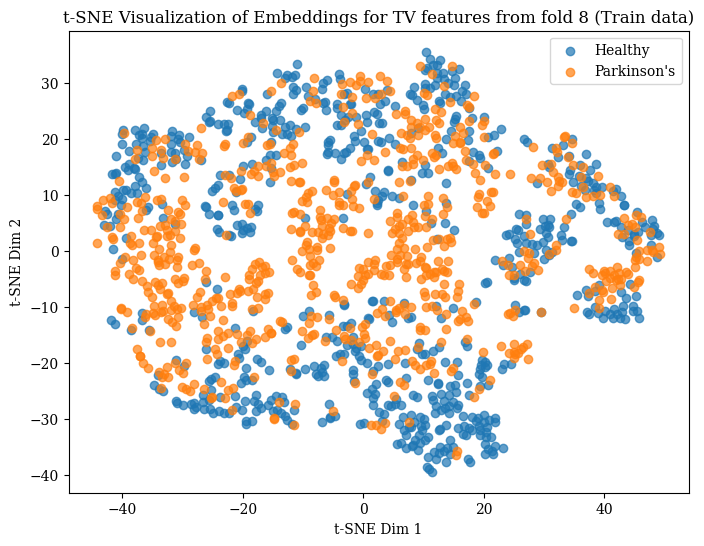

In [64]:
df = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/train_reference_setup1.pkl")

typeemb = 'tv'
fold = 8
feat = 'TV'
filepath_emb = "train/embeddings_bal_setup1_1.pkl"
dataset = "Train data"

all_label_val = df[fold]
          
plot_tsne_class(typeemb, fold, filepath_emb, all_label_val, dataset, feat)
#filepath_emb


180
180


<Figure size 1600x1200 with 0 Axes>

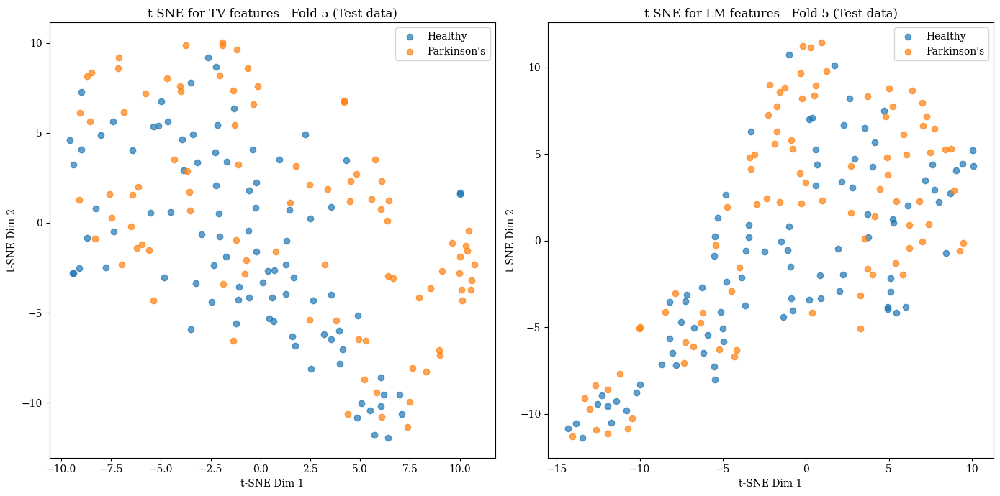

In [60]:
df = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/test_reference_setup1_1.pkl")


fold = 5
filepath_emb = "test/embeddings_bal_setup1_1.pkl"
dataset = "Test data"

all_label_val = df[fold]
        
plt.figure(figsize=(16,12))      
fig, (ax1, ax2)  = plt.subplots(1,2, figsize=(14,7)) 
       
subplot_tsne_class('tv', fold, filepath_emb, all_label_val, ax1, 'TV', dataset)

subplot_tsne_class('mel', fold, filepath_emb, all_label_val, ax2, 'LM', dataset)

plt.tight_layout()
plt.show()

(180, 2)


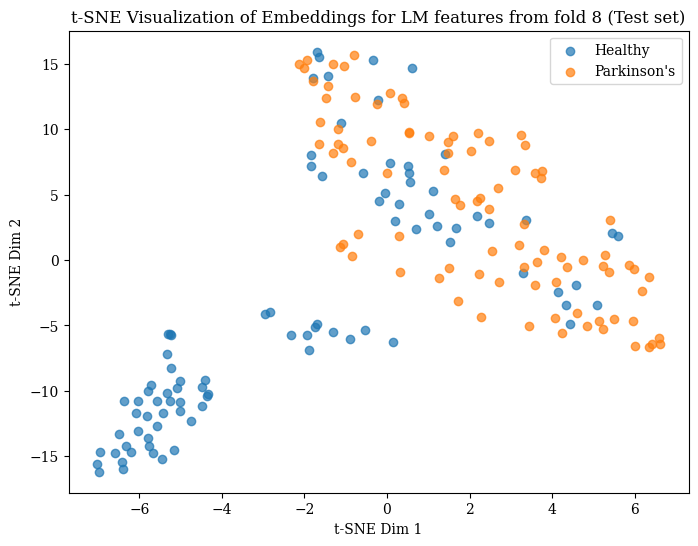

In [65]:
typeemb = 'mel'
fold = 8
filepath_emb = "test/embeddings_bal_setup1_1.pkl"
feat = 'LM'
all_label_test = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/test_reference_setup1_1.pkl")[fold]

dataset = "Test set"
#all_label_test = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/test_reference_wav80_segment.pkl")[fold]
#all_label_test = pd.read_pickle(f"/home/stinasb/SSL4PR/TV_train_test/Fold{str(fold)}/test/test_segment.pkl")['labels']

plot_tsne_class(typeemb, fold, filepath_emb, all_label_test, dataset, feat)

,1,2,3,4,5,6,7,8,9,10
0,1,1,1,1,1,1,1,1,1,1
1,1,1,1,1,1,1,1,1,1,1
2,1,1,1,1,1,1,1,1,1,1
3,1,1,1,1,1,1,1,1,1,1
4,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...
175,0,0,0,0,0,0,0,0,0,0
176,0,0,0,0,0,0,0,0,0,0
177,0,0,0,0,0,0,0,0,0,0
178,0,0,0,0,0,0,0,0,0,0


TypeError: subplot_tsne_class() missing 2 required positional arguments: 'feat' and 'dataset'

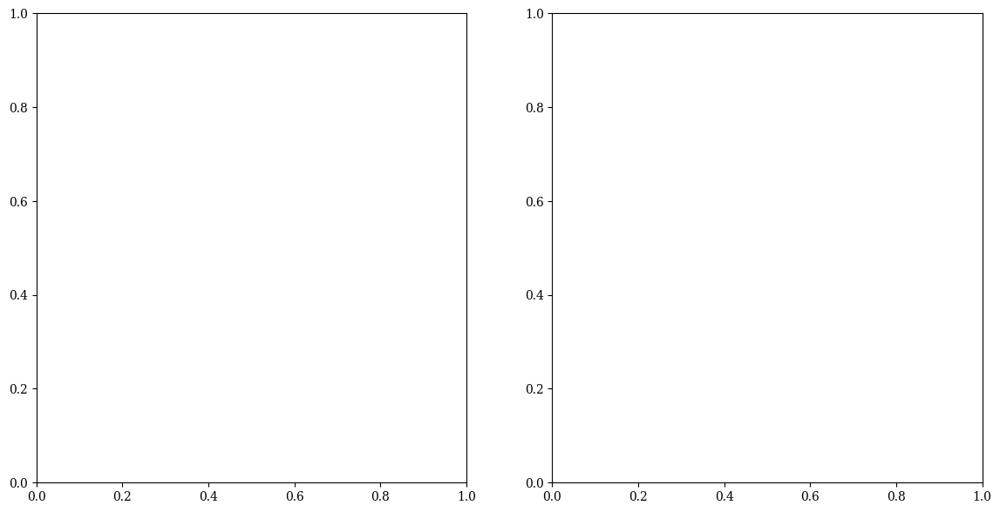

In [85]:
df = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/test_reference_setup1.pkl")

fold = 6

filepath_emb = "test/embeddings_bal_setup1.pkl"

all_label_test = df[fold]
        
#plt.figure(figsize=(16,12))      
fig, (ax1, ax2)  = plt.subplots(1,2, figsize=(14,7)) 
       
subplot_tsne_class('tv', fold, filepath_emb, all_label_test, ax1)

subplot_tsne_class('mel', fold, filepath_emb, all_label_test, ax2)

plt.tight_layout()
plt.show()


In [6]:
def plot_tsne_speaker_id(typeemb, fold, filepath_emb, all_label):
    
    dfemb = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/embeddings/" + filepath_emb)
    
    emb = dfemb[f"{typeemb}_embeddings"][fold]
    
    
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate="auto")
    embeddings_2d = tsne.fit_transform(emb)
    print(embeddings_2d.shape)

    # Visualization
    plt.figure(figsize=(8, 6))
    for label in np.unique(all_label):
        idx = all_label == label
        plt.scatter(embeddings_2d[idx, 0], embeddings_2d[idx, 1], label=str(label), alpha=0.7)
        
    plt.title(f"t-SNE Visualization of Embeddings for fold {fold} ")
    plt.xlabel('t-SNE Dim 1')
    plt.ylabel('t-SNE Dim 2')
    plt.legend()
    plt.show()

In [47]:
typeemb = 'mel'
fold = 5
filepath_emb = "test/embeddings_bal_setup2_wav80.pkl"
dfemb = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/embeddings/" + filepath_emb)
    
emb = dfemb[f"{typeemb}_embeddings"][fold]

        
all_label_test = pd.read_csv(f"/home/stinasb/SSL4PR/TV_train_test/Fold{str(fold)}/test/test.csv")['speaker_id']
avpepudeac0026_labels, avpepudeac0026_emb = [], []
for i in range(len(all_label_test)):
    if all_label_test[i] == 'AVPEPUDEAC0027':
        avpepudeac0026_labels.append(all_label_test[i])
        avpepudeac0026_emb.append(emb[i])
#plot_tsne_speaker_id(typeemb, fold, filepath_emb, all_label_test)
avpepudeac0026_emb = np.array([avpepudeac0026_emb]).squeeze(0)

In [48]:
all_label = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/test_reference.pkl").squeeze(1)
all_label.shape

(180, 10)

(1152, 2)


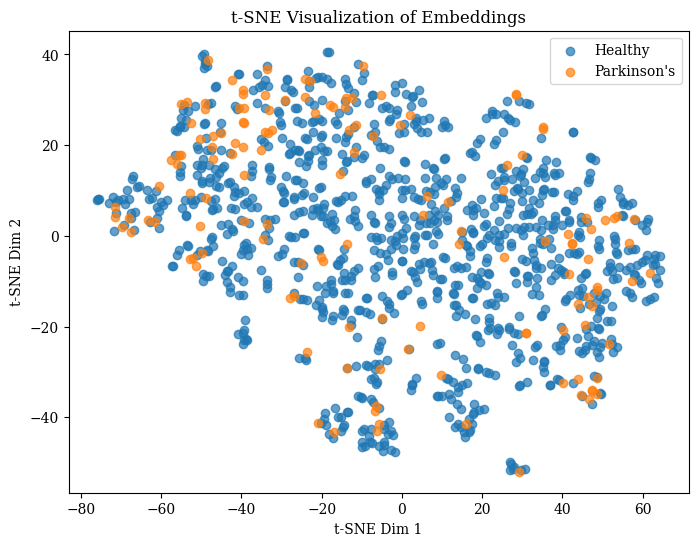

In [101]:
#def plot_tsne_class(typeemb, fold, filepath_emb, all_label):
all_label = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/test_reference.pkl").squeeze(1)
    
dfemb = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/ewa_db/test/embeddings.pkl")

emb = dfemb[f"tv_embeddings"][1]


tsne = TSNE(n_components=2, random_state=42, perplexity=15, learning_rate="auto")
embeddings_2d = tsne.fit_transform(emb)
print(embeddings_2d.shape)

# Visualization
plt.figure(figsize=(8, 6))
for label in np.unique(all_label):
    idx = all_label == label
    plt.scatter(embeddings_2d[idx][:,0], embeddings_2d[idx][:,1], label=f"Parkinson\'s" if label else "Healthy", alpha=0.7)

plt.title(f"t-SNE Visualization of Embeddings")
plt.xlabel('t-SNE Dim 1')
plt.ylabel('t-SNE Dim 2')
plt.legend()
plt.show()

(360, 2)


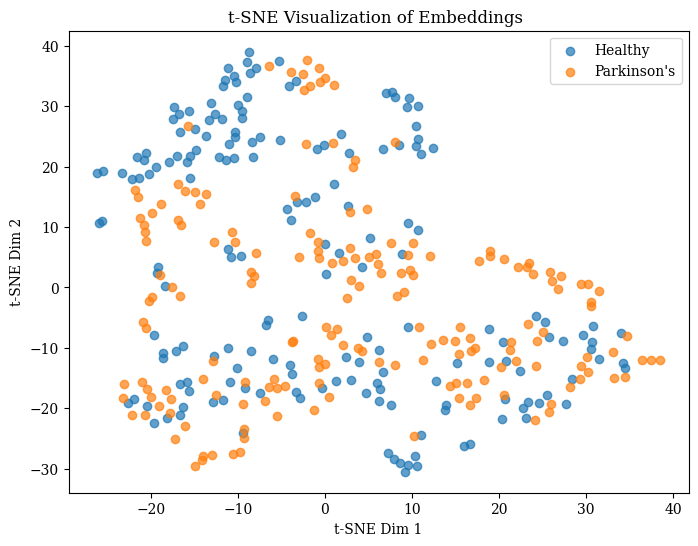

In [100]:
#def plot_tsne_class(typeemb, fold, filepath_emb, all_label):
    
dfemb = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/ewa_db/val/embeddings_tv_2.pkl")

emb = dfemb[f"{typeemb}_embeddings"][1]
all_label = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/val_reference.pkl").squeeze(1)

tsne = TSNE(n_components=2, random_state=42, perplexity=15, learning_rate="auto")
embeddings_2d = tsne.fit_transform(emb)
print(embeddings_2d.shape)

# Visualization
plt.figure(figsize=(8, 6))
for label in np.unique(all_label):
    idx = all_label == label
    plt.scatter(embeddings_2d[idx, 0], embeddings_2d[idx, 1], label=f"Parkinson\'s" if label else "Healthy", alpha=0.7)

plt.title(f"t-SNE Visualization of Embeddings ")
plt.xlabel('t-SNE Dim 1')
plt.ylabel('t-SNE Dim 2')
plt.legend()
plt.show()

In [45]:
def plot_tsne_speaker_id_special(typeemb, fold, filepath_emb, all_label, spes_emb, spes_labels, spes_id):
    
    dfemb = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/embeddings/" + filepath_emb)
    
    emb = dfemb[f"{typeemb}_embeddings"][fold]
    comb_emb = np.vstack([emb, spes_emb])
    comb_labels = np.concatenate([all_label, spes_labels])
    
    #min(30, len(comb_emb) - 1)
    
    #print(emb.shape)
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate="auto")
    embeddings_2d = tsne.fit_transform(comb_emb)
    #embedding_2d_spes = tsne.fit_transform(spes_emb)
    
    is_special = np.array([False]*len(all_label)+[True]*len(spes_labels))

    # Visualization
    plt.figure(figsize=(8, 6))
    for label in [False, True]:
        idx = (comb_labels == label) & (~is_special)
        plt.scatter(embeddings_2d[idx, 0], embeddings_2d[idx, 1],
                    label="Parkinson's" if label else "Healthy", alpha=0.6)

    # Plot special speaker on top
    special_idx = is_special
    plt.scatter(embeddings_2d[special_idx, 0], embeddings_2d[special_idx, 1],
                label=f"{spes_id} ({'Parkinson' if spes_labels[0] else 'Healthy'})",
                edgecolor='black', facecolors='none', linewidths=1.5, s=100)
   
    plt.title(f"t-SNE Visualization of Embeddings for fold {fold} (Train set + {spes_id}) ")
    plt.xlabel('t-SNE Dim 1')
    plt.ylabel('t-SNE Dim 2')
    plt.legend()
    plt.show()

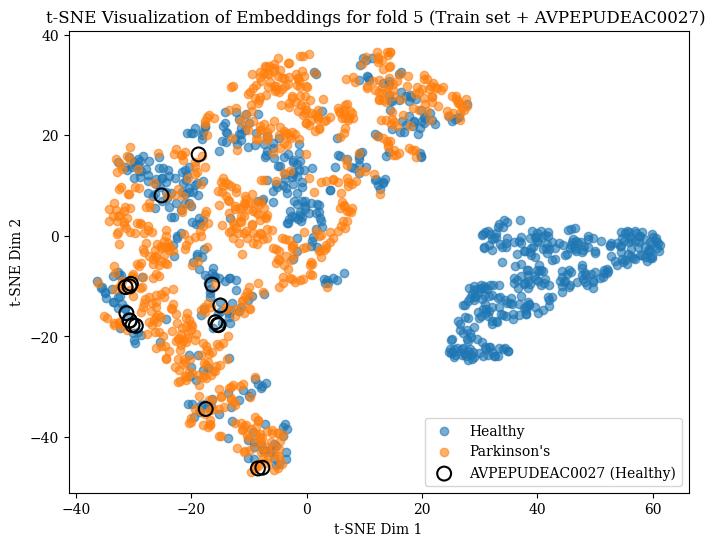

In [49]:
df = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/train_reference_wav80.pkl")
#dfemb = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/embeddings/" + "val/embeddings_bal_setup2_wav80.pkl")
    
#emb = dfemb[f"{typeemb}_embeddings"][fold]
spes_id = 'AVPEPUDEAC0027'
#avpepudeac0026_emb.shape
plot_tsne_speaker_id_special('mel', 5, "train/embeddings_bal_setup2_wav80.pkl", df[5], avpepudeac0026_emb, np.zeros(18), spes_id)

In [ ]:
    
#avpepudeac0026_emb.shape
plot_tsne_speaker_id_special('mel', 5, "train/embeddings_bal_setup2_wav80.pkl", df[5], avpepudeac0026_emb, np.zeros(18))

In [44]:
def plot_tsne_class_both(typeemb1, typeemb2, fold, filepath_emb, all_label):
    
    dfemb = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/embeddings/" + filepath_emb)
    
    emb1 = dfemb[f"{typeemb1}_embeddings"][fold]
    emb2 = dfemb[f"{typeemb2}_embeddings"][fold]
    
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate="auto")
    embeddings_2d1 = tsne.fit_transform(emb1)
    embeddings_2d2 = tsne.fit_transform(emb2)
    #print(embeddings_2d.shape)
    
    # Visualization
    plt.figure(figsize=(8, 6))
    for label in np.unique(all_label):
        idx = all_label == label
        plt.scatter(embeddings_2d1[idx, 0], embeddings_2d1[idx, 1], label=f"Parkinson\'s ({typeemb1})" if label else f"Healthy ({typeemb1})", alpha=0.7)
        plt.scatter(embeddings_2d2[idx, 0], embeddings_2d2[idx, 1], label=f"Parkinson\'s ({typeemb2})" if label else f"Healthy ({typeemb2})", alpha=0.7)
        
    plt.title(f"t-SNE for setup2 - Fold {fold}")
    plt.xlabel('t-SNE Dim 1')
    plt.ylabel('t-SNE Dim 2')
    plt.legend()
    plt.show()

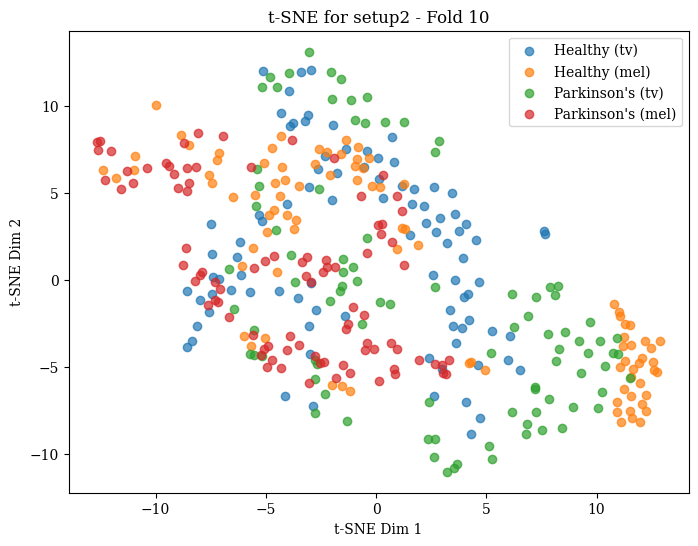

In [ ]:
df = pd.read_pickle("/home/stinasb/SSL4PR/TVs_copy/test_reference_both80.pkl")

typeemb = 'tv'
fold = 10
filepath_emb = "test/embeddings_bal_setup2_both80.pkl"

all_label_test = df[fold]
        
plot_tsne_class_both('tv', 'mel', fold, filepath_emb, all_label_test)


In [ ]:
fold = 10
df = pd.read_csv("/home/stinasb/SSL4PR/TV_train_test/Fold10/test/test.csv")
speaker_id = df['speaker_id']
emb = dfemb['tv_embeddings'][fold]
all_label = pd.read_csv(f"/home/stinasb/SSL4PR/TV_train_test/Fold{str(fold)}/test/test.csv")['labels']


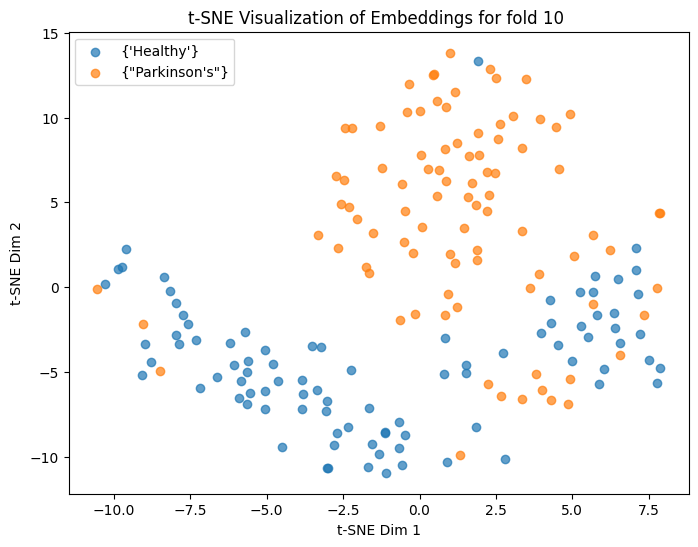

In [ ]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate="auto")
embeddings_2d = tsne.fit_transform(emb)

# Visualization
plt.figure(figsize=(8, 6))
for label in np.unique(all_label):
    idx = all_label == label
    plt.scatter(embeddings_2d[idx, 0], embeddings_2d[idx, 1], label={f"Parkinson\'s" if label else "Healthy"}, alpha=0.7)
    
plt.title(f"t-SNE Visualization of Embeddings for fold {fold} ")
plt.xlabel('t-SNE Dim 1')
plt.ylabel('t-SNE Dim 2')
plt.legend()
plt.show()

In [27]:
'''
import umap
# Assuming `embeddings` is your high-dimensional data
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2)
umap_embeddings = reducer.fit_transform(emb)

# Plotting the results
plt.scatter(umap_embeddings[:, 0], umap_embeddings[:, 1], c=all_label, cmap='Spectral', label=all_label)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.Spectral(i/1.), markersize=10) for i in range(2)]
labels = ['Healthy Control', 'Parkinson\'s Disease']
plt.legend(handles, labels, loc='best')

plt.colorbar()
plt.show()
'''

"\nimport umap\n# Assuming `embeddings` is your high-dimensional data\nreducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2)\numap_embeddings = reducer.fit_transform(emb)\n\n# Plotting the results\nplt.scatter(umap_embeddings[:, 0], umap_embeddings[:, 1], c=all_label, cmap='Spectral', label=all_label)\nhandles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.Spectral(i/1.), markersize=10) for i in range(2)]\nlabels = ['Healthy Control', 'Parkinson's Disease']\nplt.legend(handles, labels, loc='best')\n\nplt.colorbar()\nplt.show()\n"

In [28]:
'''
pca = PCA(n_components=2)
pca_embeddings = pca.fit_transform(emb)
plt.scatter(pca_embeddings[:, 0], pca_embeddings[:, 1], c=all_label, cmap='Spectral')
plt.colorbar()
plt.title('PCA Visualization of ECAPA-TDNN Embeddings')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()
'''


"\npca = PCA(n_components=2)\npca_embeddings = pca.fit_transform(emb)\nplt.scatter(pca_embeddings[:, 0], pca_embeddings[:, 1], c=all_label, cmap='Spectral')\nplt.colorbar()\nplt.title('PCA Visualization of ECAPA-TDNN Embeddings')\nplt.xlabel('Principal Component 1')\nplt.ylabel('Principal Component 2')\nplt.show()\n"

In [39]:
df = pd.read_csv("/home/stinasb/SSL4PR/TV_train_test/Fold5/test/test.csv")
speaker = df[df['speaker_id']=='AVPEPUDEA0020']


#avpepudeac0026 = df[df['speaker_id']=='AVPEPUDEAC0026']
#audio = df['sample_wav']
#file= audio[900]
speaker

,sample_tv,sample_wav,labels,speaker_id,origin_id,status,UPDRS,UPDRS-speech,H/Y,SEX,AGE,time after diagnosis
18,/home/stinasb/SSL4PR/TVs_copy_test/monologue/s...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0020,AVPEPUDEA0020_Monologo-NR,pd,30.0,1.0,2,F,55.0,12.0
19,/home/stinasb/SSL4PR/TVs_copy_test/sentences2/...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0020,AVPEPUDEA0020_juan,pd,30.0,1.0,2,F,55.0,12.0
20,/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysi...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0020,AVPEPUDEA0020_ka,pd,30.0,1.0,2,F,55.0,12.0
21,/home/stinasb/SSL4PR/TVs_copy_test/sentences/l...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0020,AVPEPUDEA0020_laura,pd,30.0,1.0,2,F,55.0,12.0
22,/home/stinasb/SSL4PR/TVs_copy_test/sentences/l...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0020,AVPEPUDEA0020_loslibros,pd,30.0,1.0,2,F,55.0,12.0
23,/home/stinasb/SSL4PR/TVs_copy_test/sentences/l...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0020,AVPEPUDEA0020_luisa,pd,30.0,1.0,2,F,55.0,12.0
24,/home/stinasb/SSL4PR/TVs_copy_test/sentences/m...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0020,AVPEPUDEA0020_micasa,pd,30.0,1.0,2,F,55.0,12.0
25,/home/stinasb/SSL4PR/TVs_copy_test/sentences/o...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0020,AVPEPUDEA0020_omar,pd,30.0,1.0,2,F,55.0,12.0
26,/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysi...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0020,AVPEPUDEA0020_pa,pd,30.0,1.0,2,F,55.0,12.0
27,/home/stinasb/SSL4PR/TVs_copy_test/DDK_analysi...,/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...,1,AVPEPUDEA0020,AVPEPUDEA0020_pakata,pd,30.0,1.0,2,F,55.0,12.0


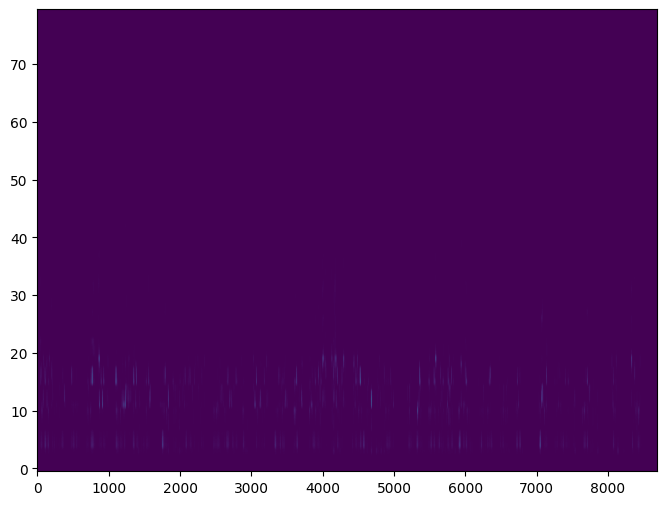

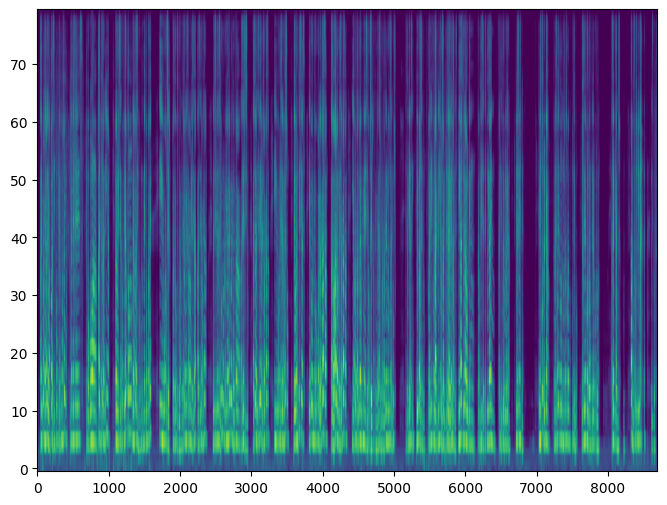

In [ ]:

samplerate, file = wavfile.read(file)
                
spec = librosa.feature.melspectrogram(
    y=file.astype(float), 
    sr=samplerate, 
    n_fft=2 * int(0.01*samplerate),
    hop_length= int(0.01*samplerate),
    #win_length= int(0.01*samplerate),
    window="hamming",
    center=True, 
    n_mels=80,
    )
plt.figure(figsize=(8,6))
plt.imshow(spec, aspect='auto', origin='lower')

#plt.xlim([0, 300])
plt.show()

plt.figure(figsize=(8,6))
plt.imshow(librosa.power_to_db(spec), aspect='auto', origin='lower')

#plt.xlim([0, 300])
plt.show()

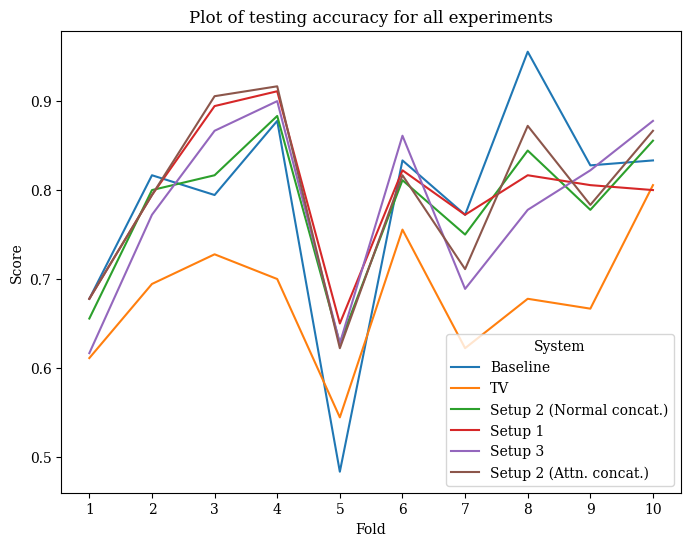

In [ ]:
baseline = pd.read_csv("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_results_bal_0_1_wav80.csv")
tv = pd.read_csv("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_results_bal_0_1_tv.csv")
both = pd.read_csv("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_results_bal_0_1_both80.csv")
setup1 = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/oppsett_1/test_results_bal_0_1_wav80.pkl")
setup3 = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/oppsett_3/test_results_bal_0_1_wav80.pkl")
attn = pd.read_pickle("/home/stinasb/SSL4PR/pre_experiments/oppsett_2/test_results_bal_0_1_attn80.pkl")

x = np.arange(1,11)
plt.figure(figsize=(8, 6))

plt.plot(x, np.squeeze(baseline['accuracy'].values), label='Baseline')
plt.plot(x, np.squeeze(tv['accuracy'].values), label='TV')
plt.plot(x, np.squeeze(both['accuracy'].values), label='Setup 2 (Normal concat.)')
plt.plot(x, np.squeeze(setup1['accuracy'].values), label='Setup 1')
plt.plot(x, np.squeeze(setup3['accuracy'].values), label='Setup 3')
plt.plot(x, np.squeeze(attn['accuracy'].values), label='Setup 2 (Attn. concat.)')

plt.legend()
plt.xlabel('Fold')
plt.ylabel('Score')
plt.xticks(x)
plt.ylim([0.4, 1])
plt.legend(title='System')
plt.title(f"Plot of testing accuracy for all experiments")
plt.show()

In [ ]:
path_train = "/home/stinasb/SSL4PR/TV_train_test/Fold1/train/train.csv"
path_test = "/home/stinasb/SSL4PR/TV_train_test/Fold1/test/test.csv"

paths = [path_train, path_test]


base_dir = "/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/"


task_durations = {}


for elem in paths:
    df = pd.read_csv(elem)
    df = df[['sample_tv', 'sample_wav','labels']]
    
    for row, data in df.iterrows():
        wav_path = data['sample_wav']
        sr, file = wavfile.read(wav_path)
        dur = len(file)/sr
        
        relative_path = os.path.relpath(wav_path, base_dir)
        task_name = relative_path.split(os.sep)[0]
        
        if task_name not in task_durations:
            task_durations[task_name] = {'duration': [], 'path': []}
        
        task_durations[task_name]['duration'].append(dur)
        task_durations[task_name]['path'].append(wav_path)
        
        #path.append(wav_path)
        #feat = librosa.feature.melspectrogram(y=file.astype(float), sr=sr, hop_length= int(0.01*sr))
        #print(data['sample_tv'], data['sample_wav'])
        #print(pd.read_pickle(data['sample_tv']).shape, librosa.power_to_db(feat).T.shape)
        


In [ ]:
speak = pd.read_csv(path_train)
speak.iloc[452]

sample_tv               /home/stinasb/SSL4PR/TVs_copy_test/DDK_analysi...
sample_wav              /talebase/data/speech_raw/PC-GITA-v2/PC-GITA_p...
labels                                                                  1
speaker_id                                                  AVPEPUDEA0035
origin_id                                                AVPEPUDEA0035_ka
status                                                                 pd
UPDRS                                                                23.0
UPDRS-speech                                                          2.0
H/Y                                                                     2
SEX                                                                     F
AGE                                                                  51.0
time after diagnosis                                                   10
Name: 452, dtype: object

In [ ]:
max_val = 0
for index, key in enumerate(task_durations):
    
    print(f" {key} : {task_durations[key]}")
    
    

sent2 = task_durations['sentences']

print(np.argmax(sent2['duration']))
#for index, key in enumerate(sent2):
  #  max_val = np.argmax(sent2)
    
#for elem in sent2['duration']:
 #   print(np.argmax())
 
audio_path = sent2['path'][np.argmax(sent2['duration'])]


 monologue : {'duration': [60.770625, 104.142125, 43.2526875, 30.7819375, 45.4330625, 87.9290625, 62.1354375, 28.03, 44.1130625, 39.75375, 47.998625, 19.692375, 41.931375, 22.1935625, 31.8536875, 48.43325, 44.48975, 84.14675, 29.518, 43.8269375, 26.787375, 99.1091875, 30.4979375, 34.67725, 32.436875, 45.947, 50.7043125, 27.1113125, 22.63475, 33.8865, 38.7763125, 75.7670625, 39.9953125, 35.358625, 110.954875, 62.3295625, 14.1055625, 25.8695, 22.4133125, 89.69675, 25.840625, 39.7985625, 26.1175, 69.19675, 39.649625, 58.360875, 164.098625, 103.09475, 69.0393125, 62.5303125, 86.9155625, 91.326875, 33.205, 33.52475, 33.8150625, 71.743875, 34.0459375, 31.3150625, 58.7458125, 25.115, 32.414375, 53.09425, 33.31825, 18.25675, 35.32425, 66.237125, 22.35625, 61.9096875, 33.7854375, 55.028875, 26.491875, 69.35875, 61.2195, 36.09375, 36.7544375, 21.7211875, 17.8674375, 31.379375, 24.5751875, 29.73175, 102.7969375, 19.1801875, 35.49325, 22.515625, 43.1130625, 29.534125, 80.937125, 31.2336875, 49.172

/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/sentences/luisa/sin_normalizar/PD/AVPEPUDEA0030_luisa.wav


In [84]:

from IPython.display import Audio

df = pd.read_csv("/home/stinasb/SSL4PR/TV_train_test/Fold9/test/test.csv")

for index, row in df.iterrows():
    if row['speaker_id'] == 'AVPEPUDEA0029':
                
        wav_file = row['sample_wav']
        sound = Audio(wav_file, autoplay=True)
        display(sound)

#sample_rate, data = wavfile.read(wav_file)

# Normalize the data for better visualization
#data = data / np.max(np.abs(data))
# Create a time axis in seconds
#time = np.linspace(0, len(data) / sample_rate, num=len(data))

#duration_seconds = len(data) / sample_rate
#duration_seconds   


In [2]:
df = pd.read_csv("/home/stinasb/SSL4PR/BDHPD-splits/ewadb_metadata_bdhpd/test_metadata.tsv", sep="\t")
audio_files = []
for elem in df['AUDIOFILE']:
    newpath = os.path.join("/talebase/data/speech_raw/S0489/",elem)
    audio_files.append(newpath)
os.path.exists(newpath)

True

In [15]:



paths = audio_files

#newpath = os.path.join("/talebase/data/speech_raw/S0489/",elem)
#base_dir = "/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/"


task_durations = {}

    
for elem in paths:
    #wav_path = data['sample_wav']
    sr, file = wavfile.read(elem)
    
    dur = len(file)/sr
    
    #relative_path = os.path.relpath(wav_path, base_dir)
    task_name = os.path.basename(os.path.dirname(elem))
    
    if task_name not in task_durations:
        task_durations[task_name] = {'duration': [], 'path': []}
    
    task_durations[task_name]['duration'].append(dur)
    #task_durations[task_name]['path'].append(elem)
        
        #path.append(wav_path)
        #feat = librosa.feature.melspectrogram(y=file.astype(float), sr=sr, hop_length= int(0.01*sr))
        #print(data['sample_tv'], data['sample_wav'])
        #print(pd.read_pickle(data['sample_tv']).shape, librosa.power_to_db(feat).T.shape)
        


/tmp/ipykernel_1404236/3113791263.py:12: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sr, file = wavfile.read(elem)


In [9]:
len(audio_files)

1152

In [16]:
print('picture mean and std:')
print(np.mean(task_durations['picture']['duration']))
print(np.std(task_durations['picture']['duration']))
print("\n")
print('picture min and max:')
print(np.min(task_durations['picture']['duration']))
print(np.max(task_durations['picture']['duration']))
print("\n")
print('pataka mean and std:')
print(np.mean(task_durations['pataka']['duration']))
print(np.std(task_durations['pataka']['duration']))
print("\n")
print('pataka min and max:')
print(np.min(task_durations['pataka']['duration']))
print(np.max(task_durations['pataka']['duration']))
print("\n")

picture mean and std:
61.371418684895836
29.191984286351506


picture min and max:
1.029
90.12


pataka mean and std:
7.961293619791667
0.09916189895196188


pataka min and max:
6.82
8.085




In [ ]:
for key, values in task_durations.items():
    print(f"mean {key}: {np.mean(values)}")
    print(f"std {key}: {np.std(values)}")
    

In [ ]:
for key, values in task_durations.items():
    print(f"min value for {key}: {np.min(values)}")
    print(f"max value for {key}: {np.max(values)}")


min value for monologue: 14.1055625
max value for monologue: 164.098625
min value for sentences2: 1.7448125
max value for sentences2: 21.718625
min value for DDK_analysis: 0.767375
max value for DDK_analysis: 10.5261875
min value for sentences: 1.2024375
max value for sentences: 9.6339375
min value for read_text: 10.3495625
max value for read_text: 45.2641875


In [ ]:
for key, values in task_durations.items():
    print(f"nr. of samples in {key}: {len(values)}")

nr. of samples in monologue: 100
nr. of samples in sentences2: 400
nr. of samples in DDK_analysis: 600
nr. of samples in sentences: 600
nr. of samples in read_text: 100


In [ ]:
def mean_per_fold(path, measure):

    dirs = os.listdir(path)
    r = len(dirs) // 4
    dfs = {}
    for i in range(1, r+1):
        dfs[i] = pd.read_csv(path+ f"/test_results_{i}.csv")[measure]
        
        
    df = pd.DataFrame(dfs).T
    df = df.rename(columns ={ 0:1, 1:2, 2:3, 3:4, 4:5, 5:6, 6:7, 7:8, 8:9, 9:10 })
    df = df.reset_index(drop=True)
    
    return df

path = "/home/stinasb/SSL4PR/pre_experiments/oppsett_1"



,1,2,3,4,5,6,7,8,9,10
0,0.605556,0.838889,0.827778,0.861111,0.538889,0.805556,0.661111,0.872222,0.750000,0.861111
1,0.655556,0.766667,0.805556,0.877778,0.566667,0.805556,0.672222,0.833333,0.711111,0.911111
2,0.650000,0.822222,0.900000,0.883333,0.550000,0.838889,0.700000,0.816667,0.727778,0.894444


In [2]:
inp_tensor = torch.rand([8, 120, 80]).transpose(1, 2)
layer = ECAPA_TDNN.TDNNBlock(80, 512, kernel_size=5, dilation=1)
out_tensor = layer(inp_tensor).transpose(1, 2)
out_tensor.shape

torch.Size([8, 120, 512])

In [ ]:
def update_pcgitasplits(fold):
    path = "/talebase/data/speech_raw/PC-GITA-v2/PC-GITA_per_task_16000Hz/monologue/sin_normalizar/hc/AVPEPUDEAC0041_Monologo-NR_.wav"
    dir = f"/home/stinasb/SSL4PR/pcgita_splits/TRAIN_TEST_{fold}"
    
    train = pd.read_csv(dir + "/train.csv")
    test = pd.read_csv(dir + "/test.csv")
    
    org_id = 'AVPEPUDEAC0041_Monologo-NR'
    
    if org_id not in train['original_id'].values or org_id not in test['original_id'].values: 
        print('great')
        '''
        if train['speaker_id'].eq('AVPEPUDEAC0041').any():
            for index, row in train.iterrows():
                if row['speaker_id'] == 'AVPEPUDEAC0041':
                    train.loc[len(train)] = train.loc[index]
                    train.loc[len(train)-1, ['original_id', 'audio_path']] = ['AVPEPUDEAC0041_Monologo-NR', path]
                    print(train.loc[len(train)-1])
                    print('in_train')
                    train.to_csv(dir + "/train.csv", index=False)
                    break
                
        
        elif test['speaker_id'].eq('AVPEPUDEAC0041').any():
            for index, row in test.iterrows():
                if row['speaker_id'] == 'AVPEPUDEAC0041':
                    test.loc[len(test)] = test.loc[index]
                    test.loc[len(test)-1, ['original_id', 'audio_path']] = ['AVPEPUDEAC0041_Monologo-NR', path]
                    print(test.loc[len(test)-1])
                    print('in_test')
                    test.to_csv(dir + "/test.csv", index=False)                
                    break
                  '''  
    else:
        pass
        
       
#l = np.arange(1, 11)
#for elem in l:
    #update_pcgitasplits(elem)

great
great
great
great
great
great
great
great
great
great


In [ ]:
#ECAPA_TDNN.ECAPA_TDNN(input_size=9).blocks[0]


Classifier(
  (act): LeakyReLU(negative_slope=0.01)
  (norm): BatchNorm1d(
    (norm): BatchNorm1d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (DNN): Sequential(
    (block_0): Sequential(
      (linear): Linear(
        (w): Linear(in_features=10, out_features=512, bias=True)
      )
      (act): LeakyReLU(negative_slope=0.01)
      (norm): BatchNorm1d(
        (norm): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
  )
  (out): Linear(
    (w): Linear(in_features=512, out_features=1211, bias=True)
  )
)


l = np.arange(1, 11)
for elem in l:
    dir = f"/home/stinasb/SSL4PR/pcgita_splits/TRAIN_TEST_{elem}"
    if elem == 9:
        df = pd.read_csv(dir + "/test.csv")
        df.drop(df.tail(1).index, inplace=True)
    
        df.to_csv(dir + "/test.csv")
    else:
        df = pd.read_csv(dir + "/train.csv")
        df.drop(df.tail(1).index, inplace=True)
    
        df.to_csv(dir + "/train.csv")
    
        